---
<font color="#CA3532" face="calibri" size=8><h1 align="left">Sleep Stage Detection 
Systems App - (SSDApp)</h1></font>
<font color="#6E6E6E" face="calibri"><h2 align="left">Proyecto "Automatic Sleep Staging"</h2></font>
<font color="#0F0FF0" face="calibri" size=4><h4 align="left">José Javier Gutiérrez Gil - jogugil@gmail.com</h4></font>
---

# Índice

- 1. [Introducción](#1.-Introducción)
    + 1.1. [Objetivos](#1.1.-Objetivos)
- 2. [Conjunto de datos](#2.-Conjunto-de-datos)
    + 2.1. [Subgroup III](#2.1.-Subgroup-III)
- 3. [Etapas del sueño](#3.-Etapas-del-sueño)
    + 3.1. [Definición y descripción](#3.1.-Definición-y-descripción)
    + 3.2. [Ciclos y patrones](#3.2.-Ciclos-y-patrones)
- 4. [Importación y ETL](#4.-Importación-y-ETL)
- 5. [Preprocesado de datos](#5.-Preprocesado-de-datos)
    + 5.1. [Remuestreo](#5.1.-Remuestreo)
    + 5.2. [Detección de artefactos](#5.2.-Detección-de-artefactos)
    + 5.3. [Filtrado](#5.3.-Filtrado)
    + 5.4. [Segmentación y diezmado](#5.4.-Segmentación-y-diezmado)
- 6. [Extracción de características](#6.-Extracción-de-características)
    + 6.1. [Extracción de las características de [1]](#6.1.-Extracción-de-las-características-de-[1])
    + 6.2 [Extracción de características con `yasa`](#6.2-Extracción-de-características-con-yasa)
- 7. [Normalización de características](#7.-Normalización-de-características)
    + 7.1. [Normalización de las características de [1]](#7.1.-Normalización-de-las-características-de-[1])
    + 7.2. [Normalización de las características `yasa`](#7.2.-Normalización-de-las-características-yasa)
- 8. [División del conjunto de datos y selección automática de características](#8.-División-del-conjunto-de-datos-y-selección-automática-de-características)
- 9. [Modelado de datos y evaluación](#9.-Modelado-de-datos-y-evaluación)
- 10. [Análisis de resultados](#10.-Análisis-de-resultados)
    + 10.1. [Visión clínica de la solución planteada](#10.1.-Visión-clínica-de-la-solución-planteada)
    + 10.2. [Interpretabilidad/Explicabilidad](#10.2.-Interpretabilidad/Explicabilidad)
- 11. [Conclusión](#11.-Conclusión)
- 12. [Bibliografía y referencias](#12.-Bibliografía-y-referencias)

# 1. Introducción

El presente *notebook* constituye el proyecto de detección y clasificación de las etapas de sueño por las que pasa un sujeto, de la asignatura Analítica de Datos en Salud, del grado en Ciencia de Datos de la Universtiat de València. Dicho proyecto, titulado "Sleep Stage Detection Systems App" y realizado por José Javier Gutiérrez Gil y Carmen Guarner Giner, se enmarca en el compromiso de explorar soluciones avanzadas en el campo de la salud, específicamente en el análisis automático de los estados del sueño.

## 1.1. Objetivos

El objetivo principal del proyecto es desarrollar un modelo de aprendizaje automático (*Machine Learning*, ML) que tenga la capacidad de clasificar los diferentes estados de sueño a través del análisis de un conjunto de señales provenientes del polisomnograma de un sujeto. Con el fin de cumplir dicho objetivo general, los objetivos específicos que determinamos son los siguientes.

- **Objetivo 1**. Encontrar la mejor combinación de señales del polisomnograma dado; esto es, la combinación más adecuada para conseguir dicho objetivo. Notar que para todos los sujetos (*subjects*) de estudio se tendrá el mismo conjunto de señales.

- **Objetivo 2**. Estudio en tiempo y frecuencia de las señales elegidas, con el fin de analizar la adecucación de aplicación de filtrados u otras operaciones sobre las mismas.

- **Objetivo 3**. Extracción de características de las señales seleccionadas. Cálculo de un vector de características. Obtenión de características por trasnformadas (tiempo, frecuencia, tiempo-frecuencia) y aplicación de una normalización posterior de los resultados.

- **Objetivo 4**. Entrenamiento del modelo ML de clasificación con los datos de los sujetos de estudio.
     - **Objetivo 4.1**. Estrategia de separación de los datos de estudio en datos de enmtrenamiento, validación y test.
     - **Objetivo 4.2**. Diferentes estrategias para el entrenamiento del modelo de clasificación.
     - **Objetivo 4.3**. Estrategia de selección automática de características.

- **Objetivo 5**. Evaluación de la calidad del modelo con el conjunto de sujetos de prueba.

- **Objetivo 6**. Análisis de resultados, deliberación y concreción de conclusiones sobre los resultados obtenidos en las predicciones del modelo final.

# 2. Conjunto de datos

El conjunto de datos con el que se trabaja para crear la aplicación y entrenar el modelo es el almacenado en el banco de datos [**ISRUC-Sleep**](https://sleeptight.isr.uc.pt/). En concreto, se utiliza la serie *Subgroup_3*. 

Los datos del conjunto de pacientes *Subgroup_3* se presentan en carpetas comprimidas, cada uno compuesto por varios archivos. En primer lugar, encontramos un archivo .rec que es, en realidad, un archivo .edf, que debe ser renombrado para su correcta identificación. Además, cada carpeta comprimida incluye dos archivos .txt que contienen las anotaciones de los especialistas. Estos archivos son relevantes para la interpretación de las marcas asociadas a las distintas etapas del sueño. Asimismo, se proporcionan dos archivos .xlsx que contienen la misma información que los archivos .txt, pero también incorporan datos adicionales. Estos archivos .xlsx resultan especialmente útiles para realizar un análisis más profundo, permitiendo indagar en las razones detrás de posibles errores, descartar épocas de calidad dudosa, entre otros aspectos.

## 2.1. Subgroup III

La serie *Subgroup_3* consta de 10 sujetos (9 hombres y 1 mujer), con una sesión de adquisición de datos por sujeto. Se trata de sujetos saludables (grupo de control). Los años de los sujetos se sitúan entre 30 y 58 años, con el promedio ubicándose en 40 años y con una desviación estándar de 10 años.

El polisomnograma (PSG) asociado a estos datos incluye una variedad de señales provenientes de diferentes canales. Estos canales son:

- EEG (F3, C3, O1, F4, C4 y O2)
- EOG derecho e izquierdo (ROC y LOC)
- Electrocardiograma (ECG)
- Tipos de EMG, específicamente un músculo submentalis (EMG de la barbilla - X1) y dos músculos tibialis (EMG de las piernas)
- Las referencias se colocaron en los lóbulos de las orejas izquierda y derecha (A1, A2).

Específicamente, cada grabación consta de señales de **19 canales**. Todas las señales de EEG, EOG y EMG de mentón se muestrean a **200 Hz** y se almacenan utilizando los formatos de datos estándar .edf. Además, todos los registros del conjunto de datos se encuentran segmentados en **épocas de 30 segundos** y puntuados visualmente por dos expertos en sueño diferentes en CHUC de acuerdo con las pautas de AASM, con las etapas:
                       
$$Despierto - NREM (N1, N2 \text{ y } N3) - REM$$

El registro para cada sujeto es el siguiente:


|  Channel  number |  Type of the signal  |  Label | Frequency rate/Hz  | Butterworth | Notch filter | Description|
|------------------|----------------------|------------|--------------------|--------------|--------------|---------------------- |
|       1          |         EOG          | LOC-A2     |  200               | 0.3 Hz–35 Hz |     50 Hz     | Left eyes MOV         |
|       2          |                      | ROC-A1     |                    |              |               | Right eyes MOV        |
|       3          |                      | F3-A2      |                    |              |     50 Hz     | Brain channels        |                  
|       4          |                      | C3-A2      |                    |              |               |  with the  left       |
|       5          |         EEG          | O1-A2      |  200               | 0.3 Hz–35 Hz |    50 Hz      |                       |
|       6          |                      | F4-A1      |                    |              |               |                       |          
|       7          |                      | C4-A1      |                    |              |               |                       |
|       8          |                      | O2-A1      |                    |              |               |                       |                      
|       9          |    Chin EMG          | X1         | 200                |10 Hz–70 Hz   |  50 Hz        |  Chin EMG, placed         |
|       10         |    ECG (EKG)         | X2         | 200                |              |               | Electrocardiographic      |  
|       11         |    Leg-1 EMG         | X3         | 200                |              |               | Left leg movement         |
|       12         |   Leg-2 EMG          | X4         | 200                |10 Hz–70 Hz   |  50 Hz        | Right leg movement        |  
|       13         |    Snore             | X5         | 200                |10 Hz–70 Hz   |  50 Hz        | Snore (derived)           |
|       14         |    Flow-1            | X6         | 12.5               |              |               |                           |  
|       15         |    Flow-2            | DC3        | 25                 |              |               | Airflow (pressure based)   |
|       16         |    Abdominal         | X7         | 25                 |              |               |   Abdominal efforts       |  
|       17         |   Abdominal          | X8         | 25                 |              |               |  Abdominal efforts        |
|       18         |   Pulse oximetry     | SaO2       |12.5                |              |               |  Pulse oximetry (SaO2)    |  
|       19         |   Body position      | DC8        | 25                 |              |               |  Body position (BPOS)     |  



# 3. Etapas del sueño

## 3.1. Definición y descripción

Las etapas del sueño se presentan a continuación, junto con las características asociadas a cada una de estas.

* REM:
    - Señales de baja amplitud
    - Frecuencia de EEG mixta
    - Patrón en dientes de sierra
    - EMG de baja amplitud
    - EOG de alto nivel en ambos ojos   
* N1:
    - Ondas con alta amplitud
    - Frecuencia de 2 a 7 Hz junto con la existencia de ondas alfa
    - EMG es más bajo en comparación con la etapa despierto   
* N2:
    - Husos de sueño (12-14 Hz) y complejos K
* N3:    
    - Ondas de baja frecuencia y alta amplitud
    - Frecuencias de 2 a 4 Hz.
    
Las ondas que podemos encontrar en cada una de las etapas del sueño son:

| Ondas  Estados de Sueño      |
|:----------------------------:|

| Bandas     |      F (Hz)     |
|------------|-----------------|
|low delta   | 0.3–1 Hz        |
|    delta   | 1–4   Hz        |
|    theta   | 4–8   Hz        |
|    alpha   | 8–12  Hz        |
|    sigma   | 12–15 Hz        |
|     beta   | 15–30 Hz        |


| Fase del Sueño | Características | Señales del Polisomnograma                                | Ondas Asociadas                           |
|----------------|-----------------|--------------------------------------------------------|------------------------------------------|
| N1             | Ondas theta, breve | - EOG: LOC-A2 (Left eyes MOV), ROC-A1 (Right eyes MOV)  | Theta (EEG)                              |
|                |                   | - EEG: F3-A2, C3-A2 (Brain channels with the left)      |                                          |
| N2             | Complejos K, husos, Theta, Delta | - EEG: O1-A2, F4-A1, C4-A1, O2-A1                     | Theta, Delta (EEG)                       |
| N3             | Ondas delta, sueño profundo | - Chin EMG: X1 (Chin EMG, placed)                   | Delta (EEG)                              |
| REM            | Movimientos oculares rápidos, actividad cerebral similar a la vigilia | - EEG: O1-A2, F4-A1, C4-A1, O2-A1 | Beta (EEG), Theta (EOG)                 |
|                |                   | - EOG: LOC-A2, ROC-A1                                  |                                          |
|                |                   | - EMG: X1 (Chin EMG, placed)                           |                                          |
|                |                   | - ECG (EKG): X2 (Electrocardiographic)                |                                          |
|                |                   | - Leg-1 EMG: X3 (Left leg movement)                   |                                          |
|                |                   | - Leg-2 EMG: X4 (Right leg movement)                  |                                          |
|                |                   | - Snore: X5 (Snore, derived)                          |                                          |
|                |                   | - Flow-1: X6, Flow-2: DC3 (Airflow, pressure based)   |                                          |
|                |                   | - Abdominal: X7, X8 (Abdominal efforts)               |                                          |
|                |                   | - Pulse oximetry: SaO2 (Pulse oximetry, SaO2)          |                                          |
|                |                   | - Body position: DC8 (Body position, BPOS)            |                                          |

## 3.2. Ciclos y patrones

En la actual subsección, exponemos los patrones que podemos encontrar y distinguir una vez detectado las etapas de sueño en la señal del sujeto, así como distintas afecciones del tipo de sueño y el efecto de la medicación en las etapas del sueño.

- **Ciclo y Fases del Sueño (90' a 120'):**

<img src="images/ciclo_nrem_rem.png" style="float: right; margin-right: 50px; border: 1px solid #0022FF;" width="920">
<font color="#000000" face="calibri"><h4 align="left"></h4></font>

- NREM:  Etapas del sueño con movimientos oculares no rápido.
  - N1 (Transición Vigilia-Sueño):
    - Ondas theta aparecen.
    - Duración corta, aproximadamente 5-10 minutos.
  - N2 (Sueño Ligero):
    - Presencia de complejos K y husos del sueño.
    - Mayor relajación, pero aún hay conciencia del entorno.
  - N3 (Sueño Profundo):
    - Ondas delta predominantes.
    - Reparación física y crecimiento.
- REM: Movimientos oculares rápidos, actividad cerebral similar a la vigilia.
  - Parálisis muscular temporal.

Las afecciones de tipo de sueño se presentan seguidamente, diferenciando según la calidad, la duración y el patrón del sueño.

- Categorías de Afecciones:

    - Insomnio:
        - *Definición*: Dificultad para conciliar o mantener el sueño.
        - *Ejemplos*: Insomnio de conciliación, insomnio de mantenimiento.

    - Trastornos del Sueño del Ritmo Circadiano:
      - *Definición*: Alteraciones en el reloj biológico que regula el sueño y la vigilia.
      - *Ejemplos*: Trastorno del sueño-vigilia irregular, síndrome de retraso de fase del sueño.

  - Parasomnias:

    - *Definición*: Comportamientos anormales durante el sueño.
    - *Ejemplos*: Sonambulismo, terrores nocturnos, hablar durante el sueño.

- Trastornos Respiratorios del Sueño:
    - Apnea del Sueño:
      - *Definición*: Interrupciones temporales en la respiración durante el sueño.
      - *Ejemplos*: Apnea obstructiva del sueño (AOS), apnea central del sueño.

  - Ronquidos:
    - *Definición*: Ruido producido por la vibración de los tejidos en la garganta durante la respiración.

- Narcolepsia y Trastornos Relacionados:
  - Narcolepsia:
    - *Definición*: Trastorno del sueño que provoca somnolencia excesiva y ataques repentinos de sueño.
    - *Ejemplos*: Cataplejía (pérdida repentina de tono muscular), alucinaciones del sueño.

- Apnea del sueño:
    - Privación completa del sueño REM y del sueño N3
    - Aumento de los despertares de diferente duración
    - Los cambios en el sueño NREM incluyen una disminución del SWS, la potencia delta del EEG durante la noche y un aumento de la etapa N2 del sueño junto con un cambio de la potencia delta del EEG del primer al segundo ciclo de sueño en pacientes más jóvenes.
    - Valores elevados de potencia espectral en las bandas de frecuencia EEG beta (excitación cortical) y sigma (huso) durante la etapa de sueño N2 sin diferencias en otras bandas de frecuencia.

| Fase  | Características               | Ondas Cerebrales | Afecciones                                   |
|-------|-------------------------------|-------------------|----------------------------------------------|
| N1    | Ondas theta, breve            | Theta             | Posible inicio de insomnio                   |
| N2    | Complejos K, husos del sueño  | Theta, Delta      | Insomnio de mantenimiento, trastornos del    |
|       |                               |                   | sueño del ritmo circadiano                   |
| N3    | Ondas delta, sueño profundo   | Delta             | Ronquidos, apnea del sueño                   |
| REM   | Movimientos oculares rápidos  | Patrón similar a  | Narcolepsia, trastornos del sueño del        |
|       | Actividad cerebral similar a  | vigilia, beta     | comportamiento REM                          |
|       | la vigilia                     |                   |                                              |

Por último, queremos indicidir en los efectos de la medicación sobre las etapas del sueño. El uso crónico de benzodiazepinas induce un aumento de la etapa N2 del sueño, una disminución de la N3 (menor actividad delta y theta) y un aumento de los despertares. Del mismo modo, se puede observar la reducción del sueño REM o incluso una supresión completa en humanos después de la administración de antidepresivos tricíclicos. Además, los antidepresivos tenorarenérgicos y serotoninérgicos específicos mirtazapinas aumentan el tiempo total de sueño.

# 4. Importación y ETL

El presente *notebook* ha sido ejecutado desde Google Colab. Es por ello que incluimos algunos bloques de código para su configuración en dicha plataforma.

from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive')
os.chdir('/content/drive/MyDrive/base')
#os.chdir('/content/drive/MyDrive/base/data')

import sys
sys.path.append('/content/drive/MyDrive')

In [52]:
# Instala la librería utilizando !pip
!pip install mne
!pip install yasa
!pip install dotmap
!pip install numpy
!pip install PyWavelets
!pip install statsmodels
!pip install scikit-learn==1.2.0 
!pip install --upgrade scipy==1.8.1
#!pip install --upgrade pandas

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [1]:
import os
import sys

import warnings
import pandas as pd
import time


import numpy as np
import matplotlib.pyplot as plt
import mne
import yasa

from mne.datasets.brainstorm import bst_auditory
from mne.io import read_raw_ctf
from mne.preprocessing import annotate_movement, compute_average_dev_head_t
import numpy as np
from scipy.signal import resample
from scipy.signal import welch

Seguidamente, incluimos las clases definidas.

- Clase `Config`. Carga fichero de confguración ('config.yalm').

In [2]:
from base.Config import Config

- Clase `ExtractFeatures`. Clase que contiene las funciones necesarias para extraer las características de las señal EEG y EOG indicadas en el artículo de referencia [1].

In [3]:
from base.ExractFeatures import ExractFeatures

- Clase Objeto `Polysom`. Envuelve los datos del PSG leído de un sujeto determinado. Contiene funciones básicas de acceso y manipulación de las señales de cada uno de los canales del PSG. Se lee el fichero y se serializa el objeto `mne` para no mantenerlo en memoria RAM. Sólo se deserializa cuando se necesitan los datos. Únicamente se mantienen en memoria los datos de los canales eeg (`eeg_raw_resam`), los datos de los canales eog_eeg (`eog_eeg_raw_resam`) y la matriz de carateristicas normalizada (`feature_norm_matrix`).

In [5]:
from base.Polysom import Polysom

- Clase `Polysom_Data`. Carga todos los ficheros de datos. Cada fichero contiene el polisomnograma de un sujeto determinado. Mantiene en memoria una lista de objetos `Polysom`, uno por cada sujeto (*subject*).

In [6]:
try:
    from base.Polysom_Data import Polysom_Data
except Exception as e:
    print(f"Error importing module: {e}")

In [ ]:
!ls /content/drive/MyDrive/base/config_psd.yalm
!ls /content/drive/MyDrive/base/data
!ls /content/drive/MyDrive/base/data/1

/content/drive/MyDrive/base/config_psd.yalm
1  10  2  3  4	5  6  7  8  9  ISRUC
1_1.txt  1_1.xlsx  1_2.txt  1_2.xlsx  1.edf


In [7]:
DEBUG = False

# Cargamos los polisomnogramas
pp = Polysom_Data()

iPath: ./data
d: ./data/6
 Polysom (d, subject, self.conf_data)
file_path: ./data/6
subject: 6
path: ./data/6/6.edf
Extracting EDF parameters from /home/javi/py1/data/6/6.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5117999  =      0.000 ... 25589.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    8.8s


d: ./data/4
 Polysom (d, subject, self.conf_data)
file_path: ./data/4
subject: 4
path: ./data/4/4.edf
Extracting EDF parameters from /home/javi/py1/data/4/4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4763999  =      0.000 ... 23819.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    8.4s


d: ./data/ISRUC
invalid literal for int() with base 10: 'ISRUC'
d: ./data/8
 Polysom (d, subject, self.conf_data)
file_path: ./data/8
subject: 8
path: ./data/8/8.edf
Extracting EDF parameters from /home/javi/py1/data/8/8.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5999999  =      0.000 ... 29999.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:   10.2s


d: ./data/3
 Polysom (d, subject, self.conf_data)
file_path: ./data/3
subject: 3
path: ./data/3/3.edf
Extracting EDF parameters from /home/javi/py1/data/3/3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4943999  =      0.000 ... 24719.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    8.5s


d: ./data/config_psd.yalm
d: ./data/7
 Polysom (d, subject, self.conf_data)
file_path: ./data/7
subject: 7
path: ./data/7/7.edf
Extracting EDF parameters from /home/javi/py1/data/7/7.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4883999  =      0.000 ... 24419.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    8.5s


d: ./data/5
 Polysom (d, subject, self.conf_data)
file_path: ./data/5
subject: 5
path: ./data/5/5.edf
Extracting EDF parameters from /home/javi/py1/data/5/5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5663999  =      0.000 ... 28319.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    9.8s


d: ./data/2
 Polysom (d, subject, self.conf_data)
file_path: ./data/2
subject: 2
path: ./data/2/2.edf
Extracting EDF parameters from /home/javi/py1/data/2/2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5645999  =      0.000 ... 28229.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    9.6s


d: ./data/9
 Polysom (d, subject, self.conf_data)
file_path: ./data/9
subject: 9
path: ./data/9/9.edf
Extracting EDF parameters from /home/javi/py1/data/9/9.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5813999  =      0.000 ... 29069.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    9.9s


d: ./data/1
 Polysom (d, subject, self.conf_data)
file_path: ./data/1
subject: 1
path: ./data/1/1.edf
Extracting EDF parameters from /home/javi/py1/data/1/1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5723999  =      0.000 ... 28619.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    9.6s


d: ./data/10
 Polysom (d, subject, self.conf_data)
file_path: ./data/10
subject: 10
path: ./data/10/10.edf
Extracting EDF parameters from /home/javi/py1/data/10/10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4775999  =      0.000 ... 23879.995 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 33 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 33.33 Hz
- Upper transition bandwidth: 8.33 Hz (-6 dB cutoff frequency: 37.50 Hz)
- Filter length: 81 samples (0.405 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    8.5s


Subject: 6


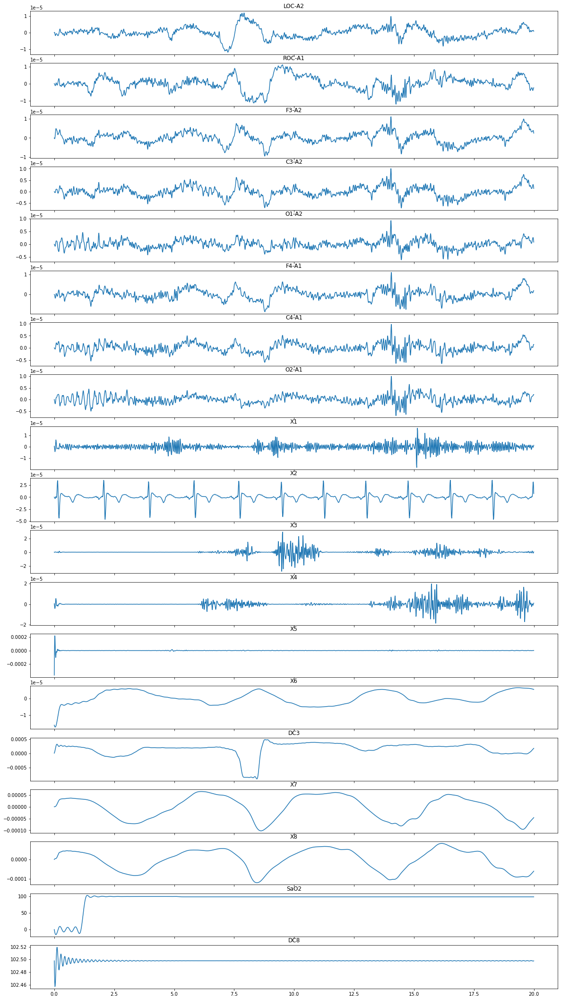

Subject: 4


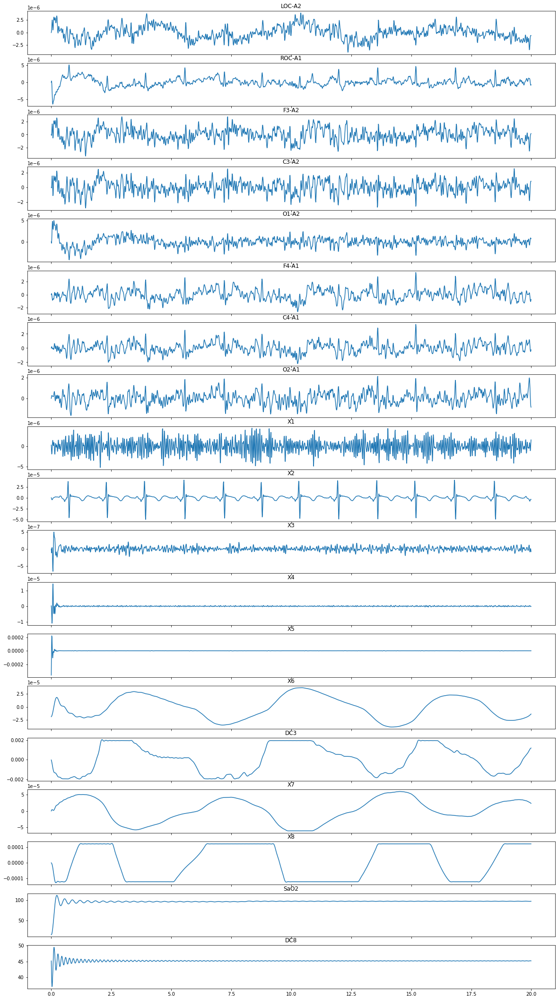

Subject: 8


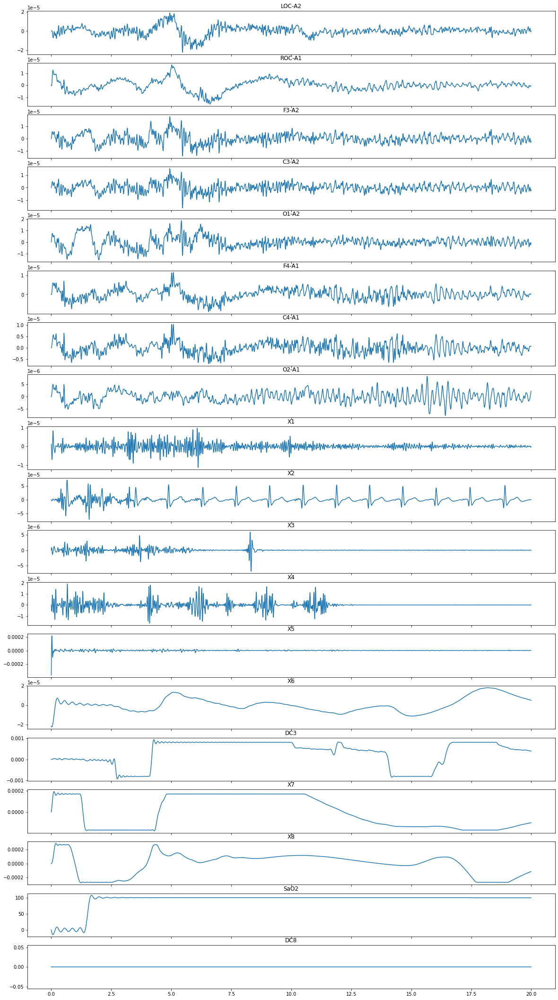

Subject: 3


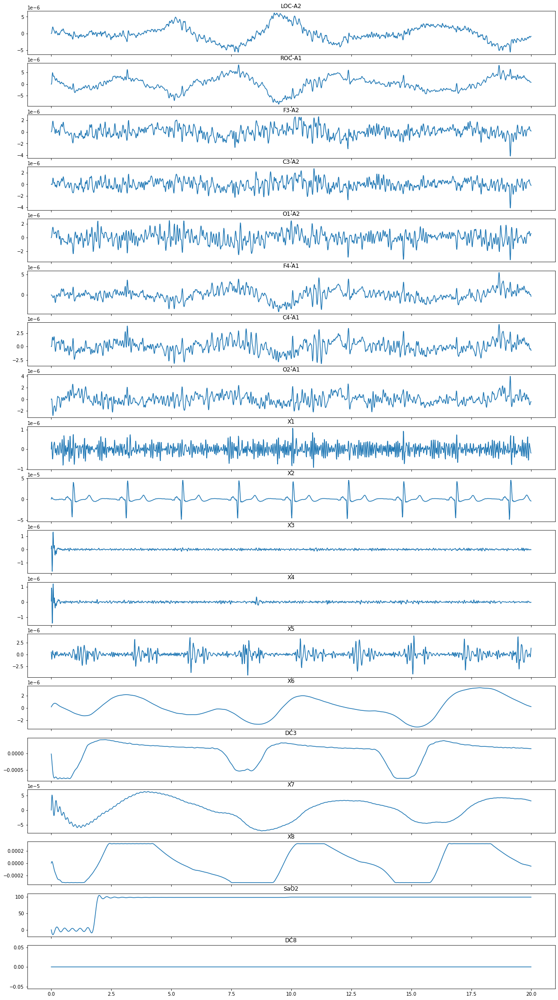

Subject: 7


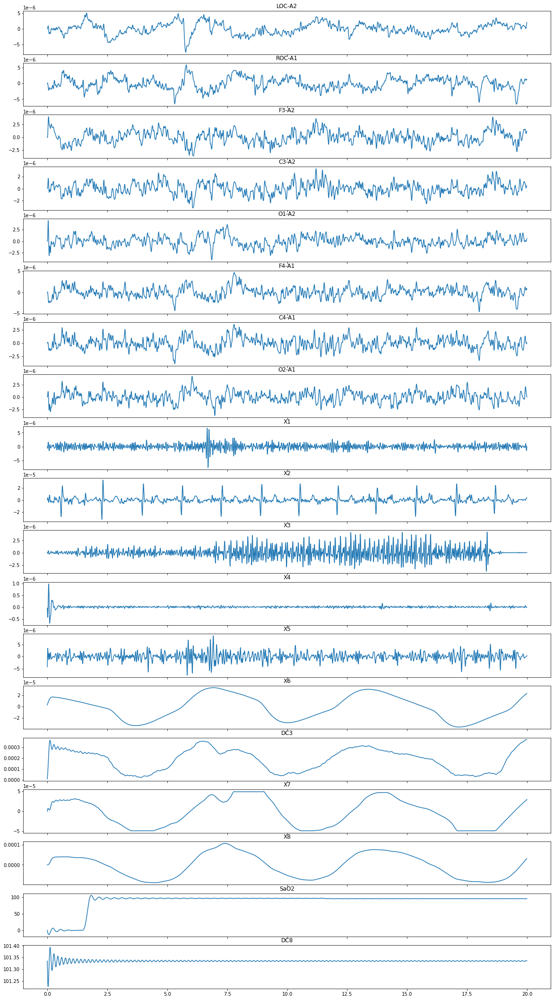

Subject: 5


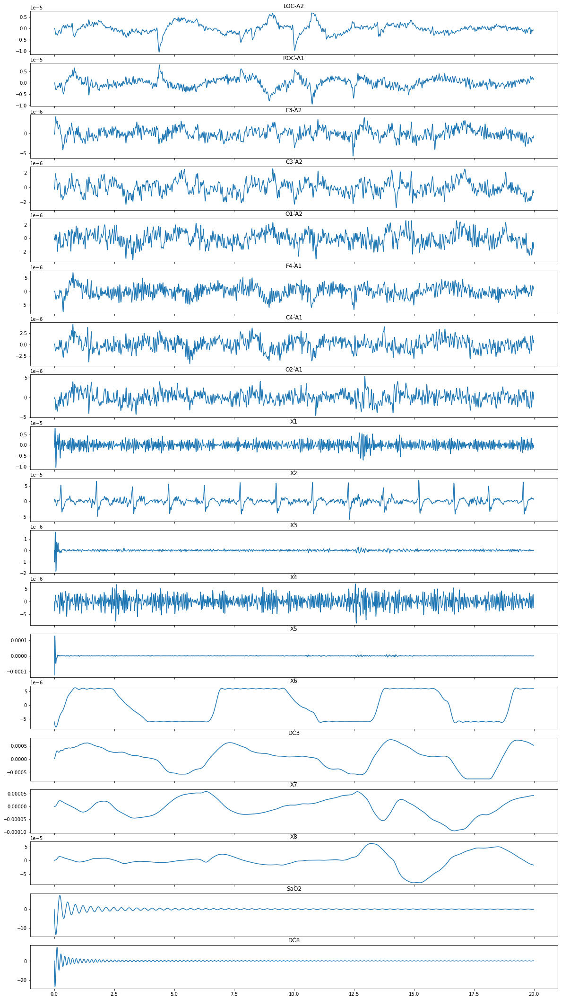

Subject: 2


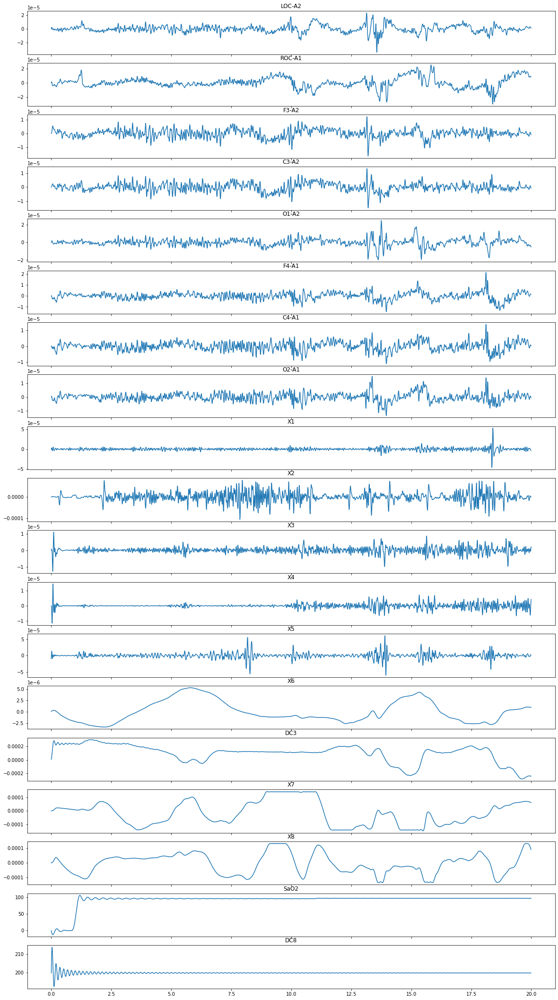

Subject: 9


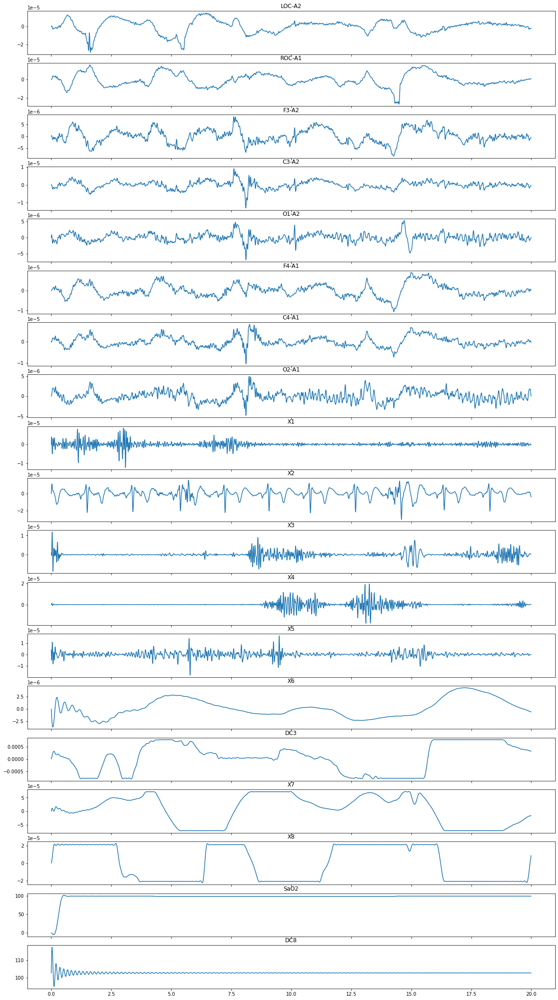

Subject: 1


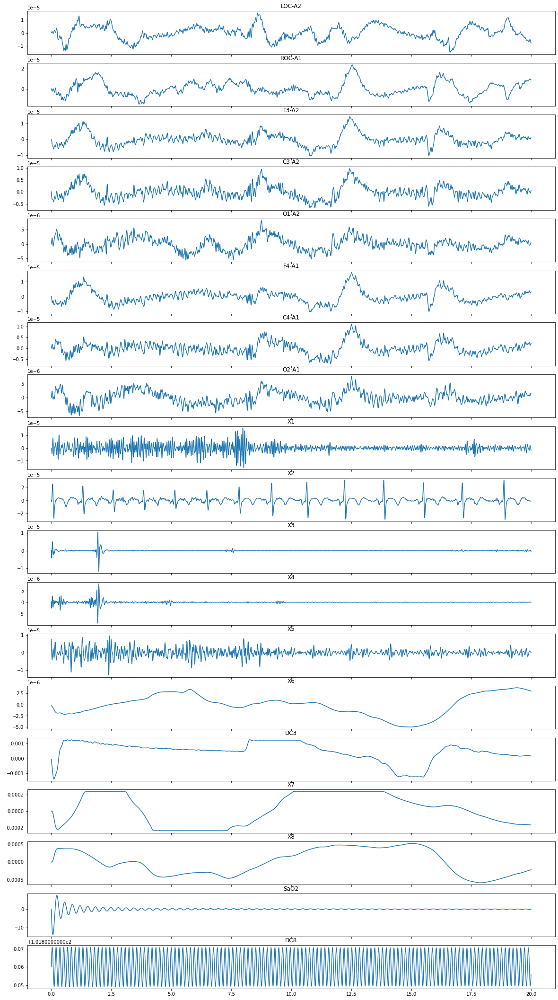

Subject: 10


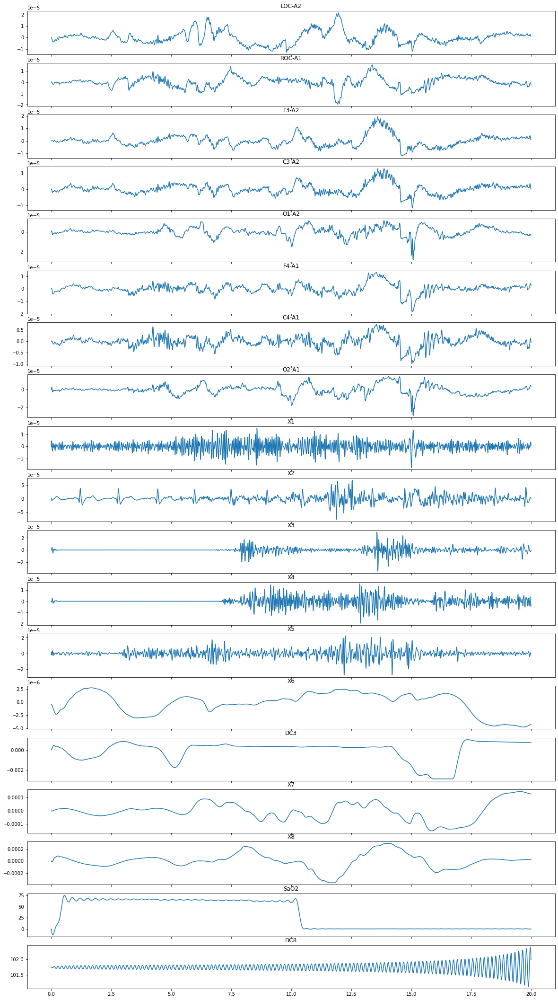

In [8]:
for sub in pp.lSubject:
    print('Subject:', sub.subject)
    sub.plot_signal_seg(seg = 20)

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


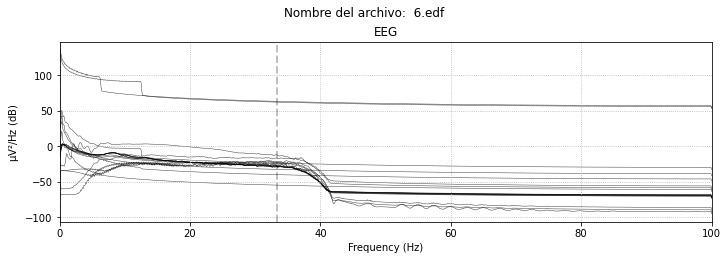

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


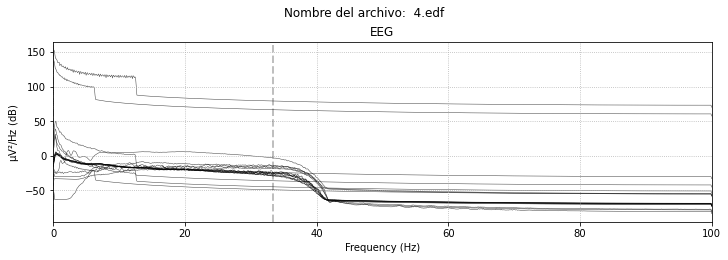

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:495: UserWarning: Zero value in spectrum for channel DC8
  spectrum = raw.compute_psd ()
/home/javi/py1/base/Polysom.py:497: UserWarning: Infinite value in PSD for channel DC8.
These channels might be dead.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


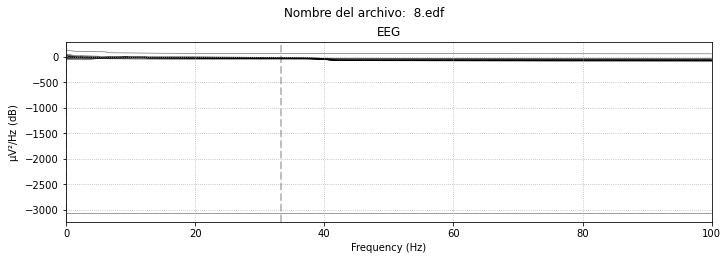

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:495: UserWarning: Zero value in spectrum for channel DC8
  spectrum = raw.compute_psd ()
/home/javi/py1/base/Polysom.py:497: UserWarning: Infinite value in PSD for channel DC8.
These channels might be dead.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


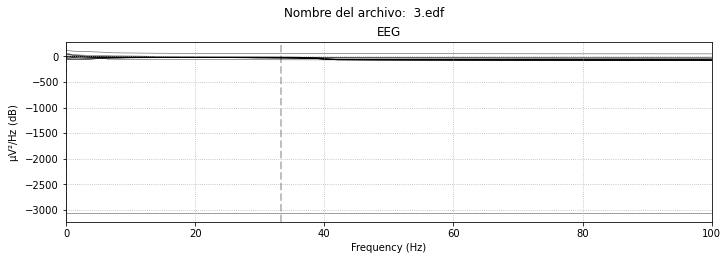

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


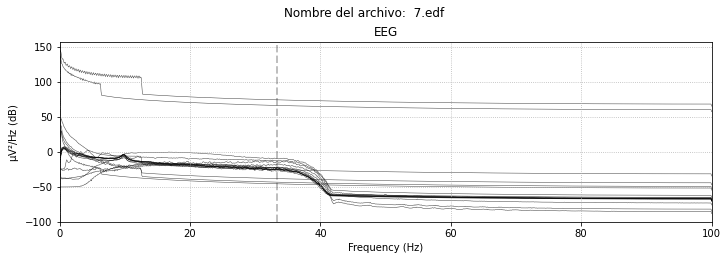

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


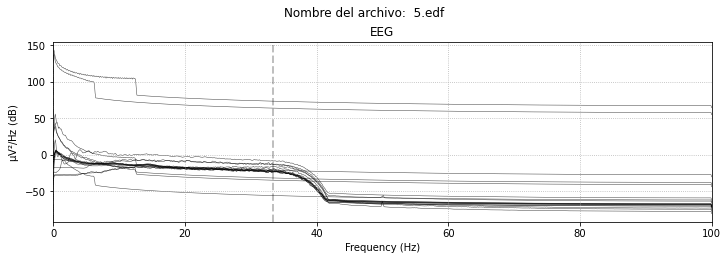

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


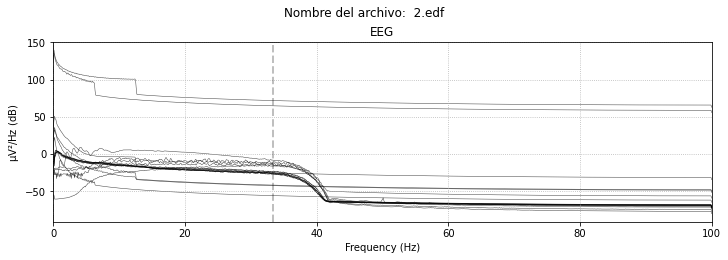

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


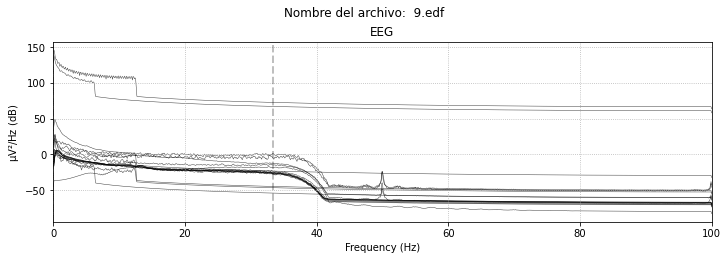

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


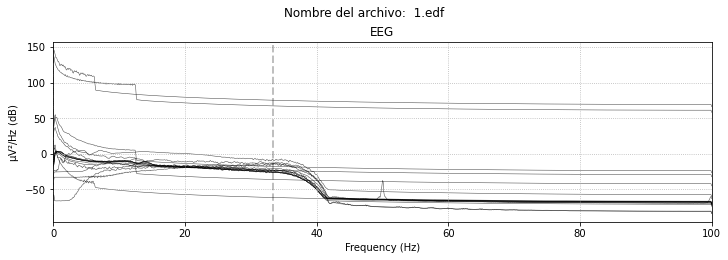

Effective window size : 10.240 (s)


/home/javi/py1/base/Polysom.py:497: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  fig = spectrum.plot(average=average, picks="data", exclude="bads")
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


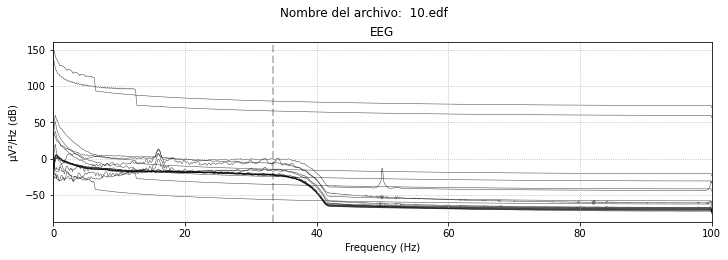

In [8]:
%matplotlib inline

for sub in pp.lSubject:
    # sub.plot_signal_psd(average = True)
    sub.plot_signal_psd()

**Indicaciones**: Observamos que en el dominio del tiempo existen señales con artefactos que distorsinaran los valores. De hecho, esa parte de la señal no debería usarse para el estudio. Por otro lado, vemos en el dominio de la frecuencia que los archivos 3 y 8 tienen un PSD  constante de casi -200. Esto se debe a que los canales DC8	Body position (BPOS) y DC3 son cero desde el inicio de la captación de la señal.

Extracting EDF parameters from /home/javi/py1/data/3/3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4943999  =      0.000 ... 24719.995 secs...
Effective window size : 10.240 (s)


/tmp/ipykernel_325790/298652374.py:5: UserWarning: Zero value in spectrum for channel DC8
  spectrum = raw_8.compute_psd ()


Effective window size : 10.240 (s)


/tmp/ipykernel_325790/298652374.py:6: UserWarning: Zero value in spectrum for channel DC8
  spectrum = raw_8.compute_psd (fmin=0.5, fmax=30, picks="data", n_fft=2048)
/tmp/ipykernel_325790/298652374.py:7: UserWarning: Infinite value in PSD for channel DC8.
These channels might be dead.
  spectrum.plot (average=True)
/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


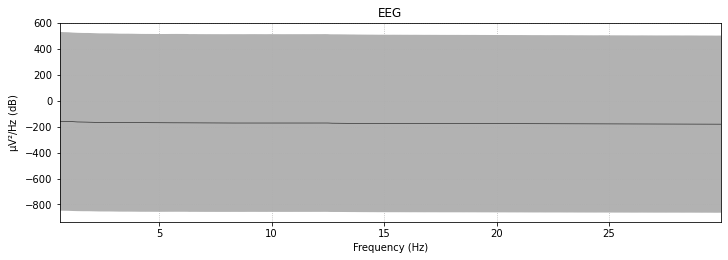

In [8]:
path = "data/%s/%s.edf" % (3, 3)

raw_8 = mne.io.read_raw_edf(path, preload = True)

spectrum = raw_8.compute_psd()
spectrum = raw_8.compute_psd(fmin = 0.5,
                             fmax = 30,
                             picks = "data",
                             n_fft = 2048)
spectrum.plot(average = True)
plt.show()

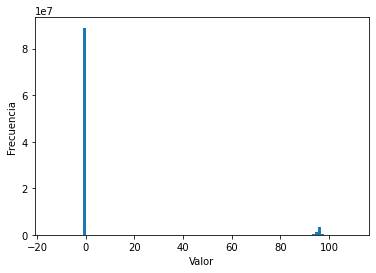

In [29]:
mean_data = raw_8.get_data().mean(axis = 1)
std_data  = raw_8.get_data().std(axis = 1)

import matplotlib.pyplot as plt
plt.hist(raw_8.get_data().flatten(),
         bins = 100)
plt.xlabel('Valor')
plt.ylabel('Frecuencia')
plt.show()

In [ ]:
mean_data

array([-1.34358095e-10, -2.14883293e-09,  3.26710659e-10,  6.06299674e-10,
       -1.84286794e-10,  4.61806242e-10, -1.44365872e-09, -1.76396901e-09,
        1.64442462e-09, -1.54694909e-08,  6.31256458e-10,  4.76613143e-09,
        1.50878044e-08, -1.71373660e-08,  3.17630634e-05, -6.64014408e-08,
       -1.92855641e-07,  9.54218784e+01,  0.00000000e+00])

Effective window size : 10.240 (s)


/home/javi/.local/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


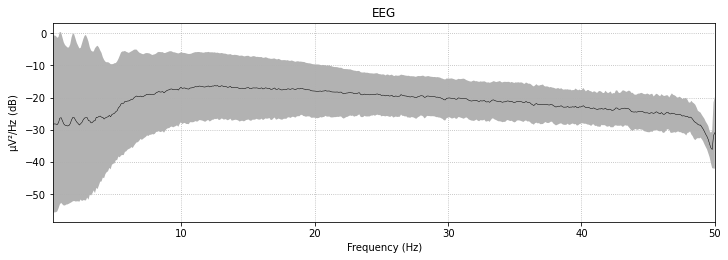

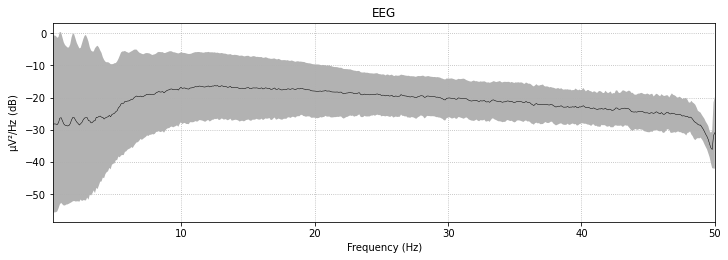

In [30]:
spectrum = raw_8.copy().pick(['ROC-A1',
                              'LOC-A2',
                              'X1',
                              'X3',
                              'X4',
                              'X2']).compute_psd(fmin = 0.3,
                                                 fmax = 50)
spectrum.plot(average = True)

Effective window size : 10.240 (s)


<ipython-input-19-53cf71e855aa>:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  spectrum.plot()


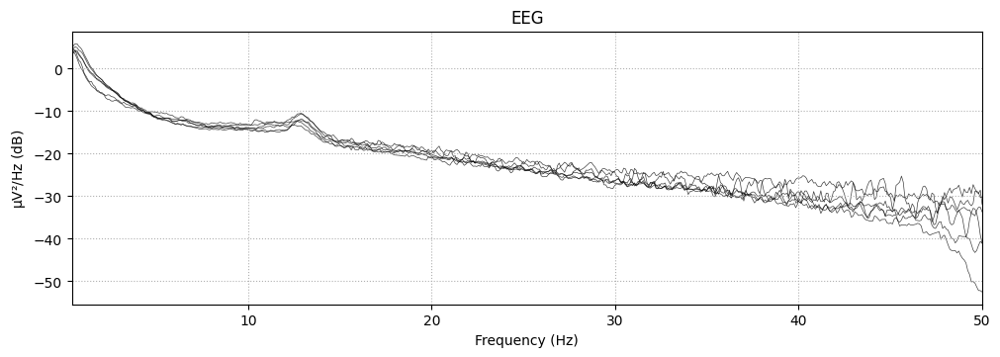

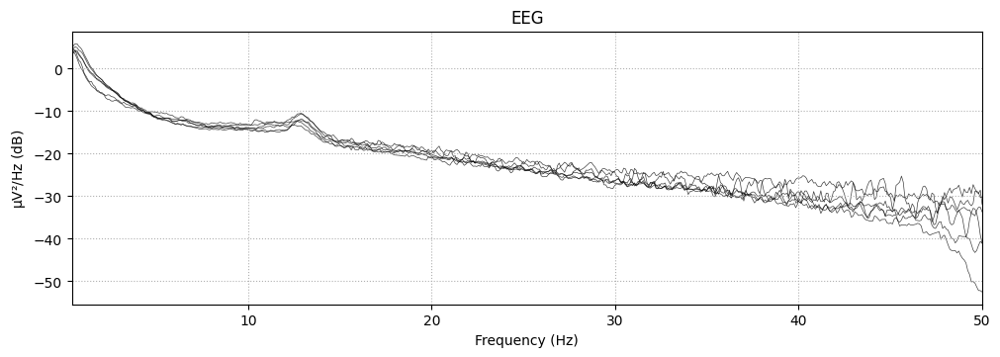

In [ ]:
spectrum = raw_8.copy().pick(['O1-A2',
                              'F4-A1',
                              'C4-A1',
                              'O2-A1',
                              'F3-A2',
                              'C3-A2']).compute_psd(fmin = 0.3,
                                                    fmax = 50)
spectrum.plot()

Effective window size : 10.240 (s)


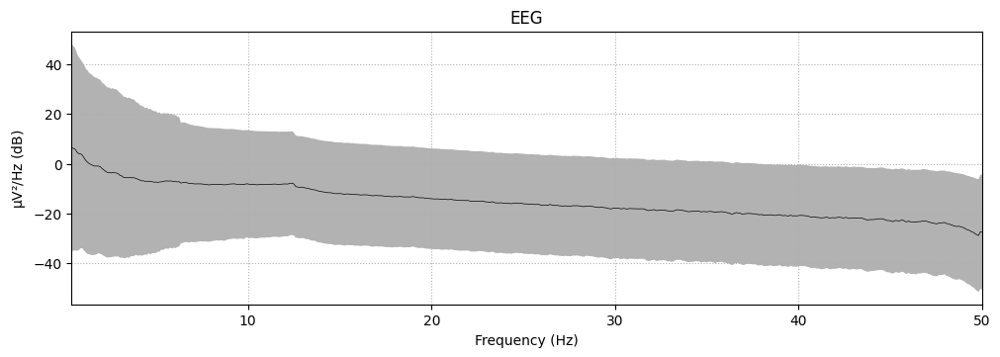

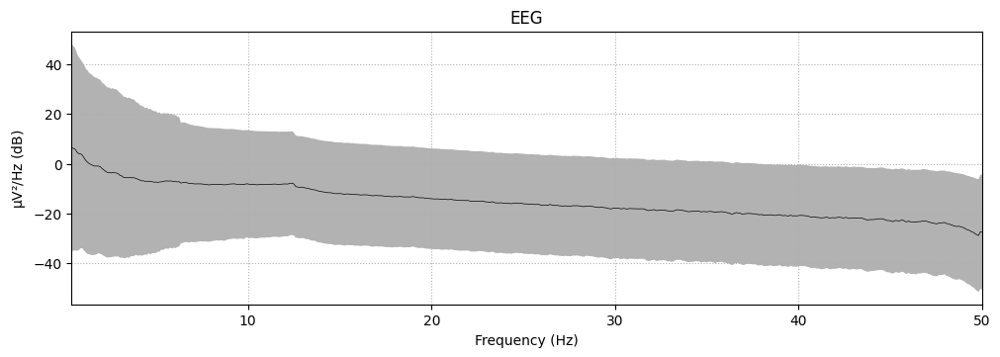

In [ ]:
# 'DC8'
spectrum = raw_8.copy().pick(['F3-A2',
                              'C3-A2',
                              'O1-A2',
                              'F4-A1',
                              'C4-A1',
                              'O2-A1',
                              'ROC-A1',
                              'LOC-A2',
                              'X1',
                              'X2',
                              'X3',
                              'X4',
                              'X7',
                              'X8',
                              'SaO2',
                              'DC3']).compute_psd(fmin = 0.3,
                                                  fmax = 50)
spectrum.plot(average = True)

# 5. Preprocesado de datos

## 5.1. Remuestreo

Al cargar los polisomnogramas de cada sujeto (*subject*) realizamos un remuestreo de la señal. Sin embargo, este remuestreo se realiza en dos fases para evitar perder información relevante antes de segmentar la señal en épocas de 30 segundos. Por tanto, en vez de utilizar `raw.resample()`, como procedemos es como sigue:

1. Aplicamos un filtro paso bajo de los datos en $\frac{1}{3}$ por debajo de la frecuencia de muestreo deseada. Tomamos 100 Hz.

2. Diezmamos los datos después de la creación de época y pasamos el parámetro `decim` calculado al cargar el fichero al constructor.

También sabemos que la frecuencia de muestreo es de 200Hz y la bajamos a 100Hz. 

- En primer lugar, según el teorema de muestreo de Nyquist-Shannon, para evitar el *aliasing*, la frecuencia de corte de un filtro paso bajo debe ser menor o igual a la mitad de la nueva frecuencia de muestreo. En este caso, la nueva frecuencia de muestreo es de 100 Hz, por lo que la frecuencia de corte no debe ser mayor de 50 Hz. Elegir una frecuencia de corte en 1/3 de la nueva frecuencia de muestreo (33.3 Hz) cumple con esta condición. 

- Así mismo, dado que la señal beta es de 30 Hz, un filtro paso bajo con una frecuencia de corte de 33.3 Hz aún permite que las componentes de la señal de interés pasen sin atenuación significativa. Esto significa que se conserva la información importante en los datos, mientras se atenua eficazmente las frecuencias más altas que pueden considerarse ruido o componentes no deseadas. 

- Además, reducir la frecuencia de muestreo a 100 Hz en lugar de mantenerla en 200 Hz disminuye la cantidad de datos que se debe procesar, lo que puede hacer que el análisis sea más eficiente sin sacrificar la información crítica.

In [8]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

n_subjects = len(pp.lSubject)
# psg_data' es una matriz de datos PSG (canales x muestras)
for i in range(n_subjects):
    print(pp.lSubject[i].miscellaneous())

the (cropped) sample data object has 5118000 time samples and 19 channels.
The last time sample is at 25589.995 seconds.
The first few channel names are LOC-A2, ROC-A1, F3-A2.

bad channels: []
200.0 Hz
None 

<Info | 8 non-empty values
 bads: []
 ch_names: LOC-A2, ROC-A1, F3-A2, C3-A2, O1-A2, F4-A1, C4-A1, O2-A1, X1, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 33.3 Hz
 meas_date: 2009-03-28 00:10:00 UTC
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
 subject_info: 1 item (dict)
>
None
the (cropped) sample data object has 4764000 time samples and 19 channels.
The last time sample is at 23819.995 seconds.
The first few channel names are LOC-A2, ROC-A1, F3-A2.

bad channels: []
200.0 Hz
None 

<Info | 8 non-empty values
 bads: []
 ch_names: LOC-A2, ROC-A1, F3-A2, C3-A2, O1-A2, F4-A1, C4-A1, O2-A1, X1, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 33.3 Hz
 meas_date: 2009-03-14 23:59:00 UTC
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
 subject_info:

## 5.2. Detección de artefactos

La eliminación de artefactos del EEG comprende una serie de métodos para la reducción o cancelación de ruido, producido por señales subyacentes asociadas a procesos fisiológicos originadas por la misma fuente.

En el contexto de señales del cerebro obtenidas a partir de un polisomnograma (PSG), un **artefacto** generalmente se refiere a cualquier interferencia no deseada o distorsión en la señal que puede deberse a factores externos o internos. Estos artefactos pueden **afectar** la **calidad de las señales de EEG** (electroencefalograma), que son **cruciales** para el **análisis del sueño en un PSG**.  

Algunas **categorías** comunes de artefactos en señales de EEG de un PSG son:

- **Movimientos Oculares (EOG)**: Movimientos rápidos de los ojos pueden introducir artefactos en las señales de EEG. Estos artefactos pueden deberse a movimientos oculares involuntarios durante el sueño.

- **Movimientos Musculares (EMG)**: Actividades musculares, especialmente en la región facial y de la mandíbula, pueden generar artefactos en las señales de EEG. Los cambios en la impedancia eléctrica debido a movimientos musculares pueden afectar la calidad de las señales.

- **Ruido Eléctrico y Ambiente**: Interferencias eléctricas, como las generadas por equipos eléctricos, luces y otros dispositivos electrónicos, pueden introducir ruido en las señales de EEG.

- **Posición del Electrodo**: La colocación incorrecta de electrodos o problemas con la fijación de electrodos pueden causar artefactos en las señales de EEG.

- **Fenómenos Fisiológicos Anómalos**: Algunos fenómenos fisiológicos anómalos, como la presencia de sudor o movimientos involuntarios, pueden afectar las señales de EEG.

La **detección y mitigación** de artefactos en señales de EEG son **aspectos críticos** del procesamiento de datos de PSG. Métodos avanzados, como el uso de *algoritmos de eliminación de artefactos*, *filtrado adaptativo* y *técnicas de rechazo de artefactos*, son empleados para **mejorar la calidad de las señales** y obtener **resultados más precisos** en el **análisis del sueño**.

Es importante realizar un monitoreo cuidadoso durante la adquisición de datos y utilizar métodos de preprocesamiento adecuados para **minimizar el impacto de los artefactos en las señales de EEG** durante el análisis del sueño.

Cómo hemos indicado, la **eliminación de artefactos del EEG** comprende una serie de **métodos** para la **reducción** o **cancelación de ruido**, **producido** por **señales subyacentes** asociadas a procesos fisiológicos originadas por la **misma fuente** o **externos**.

Existen **tres tipos de artefactos que no son cerebrales de origen fisiológico** como son el **parpadeo de ojos**, la **actividad cardiaca** y la **actividad muscular**. Y hay un cuarto **tipo correspondiente al equipamiento y los electrodos con origen técnico**. Cabe resaltar que es posible que se presenten ambos tipos de artefactos durante una lectura de EEG. Más aún existen ciertos tipos de artefactos que se pueden encontrar de manera más frecuente bajo cierto tipo de actividad como el sueño.

- **Movimiento de los ojos y parpadeo**: El movimiento de los ojos produce actividad eléctrica, cuando es lo suficiente fuerte puede ser registrada en el EEG. El EOG refleja la actividad realizada entre la córnea y la retina durante el movimiento ocular. La principal interferencia del EOG con la señal depende de la proximidad del electrodo y la dirección hacia la que se esté moviendo del ojo.  El comportamiento repetitivo puede ser fácilmente identificado, el EOG puede ser confundido con actividad lenta del EEG como actividad theta o delta. El movimiento ocular no solo está presente durante fase de actividad consciente también puede estar presente durante el sueño.

- **Actividad muscular**: Otro artefacto común corresponde a la actividad generada por la contracción muscular, medida en la superficie del cuerpo con Electromiografía EMG, este tipo de artefacto es encontrado en pacientes despiertos al realizar comportamientos como tragar saliva, hacer muecas, fruncir el ceño, masticar, hablar, chupar, e hipo (Sörnmo & Laguna, 2005). La manera general de la forma del EMG depende del grado de contracción del musculo. Una contracción tenue produce un tren de picos de baja amplitud, mientras que un aumento en la fuerza de la contracción disminuye la distancia entre picos de tal manera que el EMG exhibe el comportamiento de una señal continuamente variante.

- **Actividad cardiaca**: La actividad cardiaca del corazón se ve reflejada por el electrocardiograma ECG, no obstante, la actividad cardiaca presente en los registros de EEG suele ser particularmente baja. (1 - 2, 20-100 𝜇 V respectivamente). Puede obstaculizar la actividad EEG en ciertos tipos de fisionómicas como sujetos robustos con cuellos cortos y gruesos, la forma de la onda de patrón regular ayuda a caracterizar los latidos del corazón en condiciones normales, siendo muy útil en la cancelación de artefactos. Aunque en algunos casos las formas de pico pueden confundirse durante ataques epilépticos, y también en la presencia de arritmias cardiacas exhibiendo una amplia variación en el intervalo entre latidos.

- **Electrodos y equipamiento**: El artefacto “electrodo-pop” de su traducción al español, se encuentra basado en la manifestación del contacto de la corriente directa DC con la interacción del electrodo sobre la piel. Se puede presentar en cualquier tipo de señal bio eléctrica, y es manifestado por un cambio abrupto sobre la línea base seguido por una reincorporación gradual a la misma. En ocasiones puede ser confundido con ondas en pico. Otro tipo de artefacto que ser posible es mediante el cable que conecta el dispositivo, ya que si el cable no cuenta con la adecuada cobertura lo hace susceptible a ruido electromagnético causado por corrientes de dispositivos electrónicos cercanos, como resultado una interferencia de potencia de 50 a 60 Hz es concentrada en los electrodos contaminando la señal EEG. Finalmente, los artefactos relacionados con el equipamiento como ruido interno de los amplificadores y recorte de amplitud causado por los conversores análogo – digital con rango dinámico muy estrecho.

- Ejemplo básico de uso modelo ICA para detección de señales independientes

/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


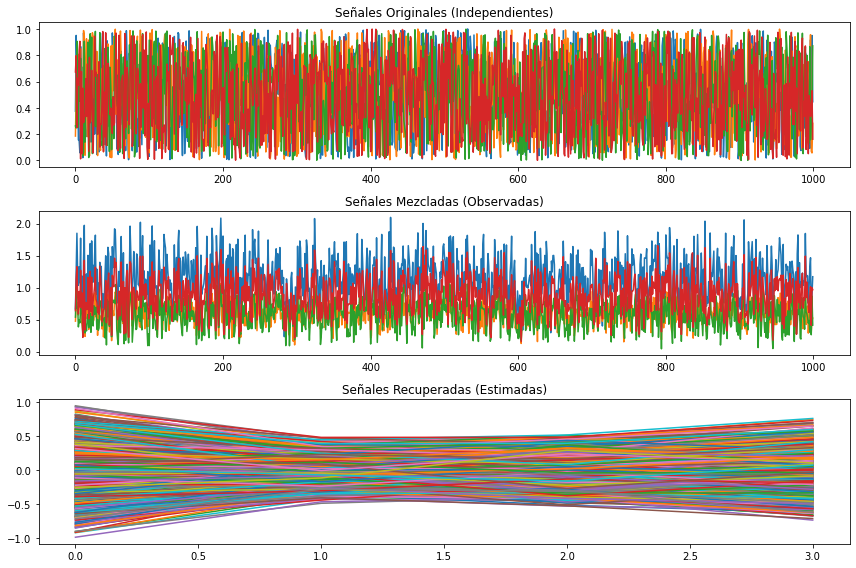

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos las señales independientes (S)
np.random.seed(42)           # Fijamos la semilla para reproducibilidad
S = np.random.rand(4, 1000)  # 4 señales independientes de longitud 1000

# Definimos la matriz de mezcla (A)
A = np.random.rand(4, 4)

# Generamos las señales observadas (X)
X = np.dot(A, S)

# Aplicamos ICA para descomponer X en A y S
from sklearn.decomposition import FastICA

ica = FastICA(n_components=4)
S_ = ica.fit_transform(X.T)  # Transponemos X ya que sklearn ICA trabaja con datos transpuestos

# Recuperamos las señales independientes estimadas
X_ = np.dot(S_, ica.mixing_.T)

# Graficamos las señales originales, mezcladas y recuperadas
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
plt.title("Señales Originales (Independientes)")
plt.plot(S.T)

plt.subplot(3, 1, 2)
plt.title("Señales Mezcladas (Observadas)")
plt.plot(X.T)

plt.subplot(3, 1, 3)
plt.title("Señales Recuperadas (Estimadas)")
plt.plot(X_.T)

plt.tight_layout()
plt.show()

Este algoritmo realmente funciona con las señales EEG y observamos su correlación con el movimiento de parpadeos EOG. Ahora se le pasan todos los canales.

/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 2
  warnings.warn(


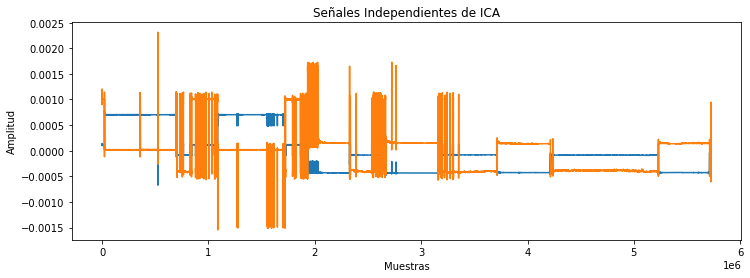

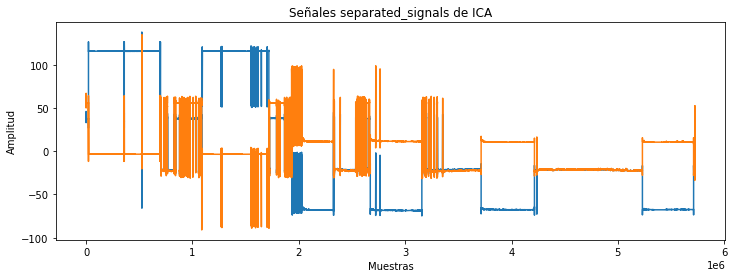

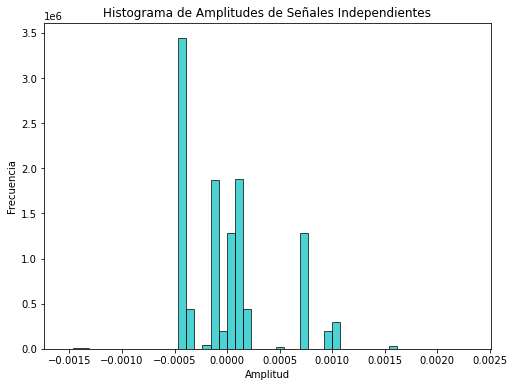

0
9.194477345025852
1
9.555170634236081
2
9.873985172948117
3
10.12566815896821
4
10.306320513854054
5
10.424797566849314
6
10.490120866047207
7
10.505457189751933
8
10.471068335084627
9
10.390171387984253
10
10.270812486132424
11
10.12278657328736
12
9.95398232338113
13
9.770046023977056
14
9.576777256959907
15
9.381820315345227
16
9.193713680853588
17
9.019670366107551
18
8.864585102553242


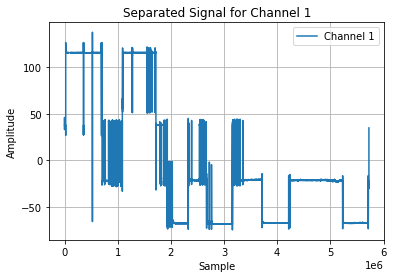

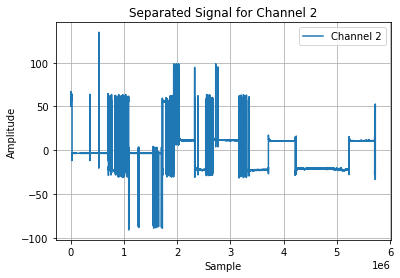

In [11]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

# psg_data' es una matriz de datos PSG (canales x muestras)
psg_data = pp.lSubject[8].getData()
# print(type(psg_data))
# print(psg_data.info)
# print(psg_data.get_data())
# psg_data = psg_data.get_data()

# Reducción de dimensionalidad con PCA
# Número de componentes principales a mantener
n_components_pca = 0.99  
pca              = PCA(n_components = n_components_pca)
psg_data_reduced = pca.fit_transform(psg_data.T)

# Inicializa el modelo ICA
# Número de componentes independientes a extraer
n_components_ica = 6  
ica              = FastICA(n_components = n_components_ica,
                           random_state = 0)

# Ajustamos el modelo a los datos PSG reducidos
ica.fit(psg_data_reduced)

# Obtiene las componentes independientes
# psg_data_ica contiene las señales EEG transformadas, donde cada columna representa una componente independiente.
psg_data_ica = ica.transform(psg_data_reduced)

# Inverse transform para obtener las señales separadas
# para transformar las componentes independientes nuevamente a las señales originales
separated_signals = ica.inverse_transform(psg_data_ica)

# Calcula la desviación estándar de cada señal separada
std_devs = np.std(separated_signals, axis = 1)

# Visualizamos las señales independientes
plt.figure(figsize = (12, 4))
plt.plot(psg_data_ica)
plt.title('Señales Independientes de ICA')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.show()

# Visualizamos las señales independientes
plt.figure(figsize = (12, 4))
plt.plot(separated_signals)
plt.title('Señales separated_signals de ICA')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.show()

# Histograma de amplitudes de las señales independientes
plt.figure(figsize = (8, 6))
plt.hist(psg_data_ica.flatten(),
         bins = 50,
         color = 'c',
         edgecolor = 'k',
         alpha = 0.7)
plt.title('Histograma de Amplitudes de Señales Independientes')
plt.xlabel('Amplitud')
plt.ylabel('Frecuencia')
plt.show()

# Establecemos un umbral para decidir qué canales mostrar
# Calcular el umbral como una fracción de la desviación estándar
threshold_factor = 3  # Ajustamos el factor según tus necesidades
threshold = threshold_factor * np.std(psg_data_ica)

# Trama las señales separadas de los canales significativos
num_channels = psg_data.shape[0]

for channel in range(num_channels):
    print(channel)
    print(std_devs[channel])
    if np.abs(std_devs[channel]) > threshold and separated_signals.T.shape [0] > channel:
        plt.figure()
        plt.plot(separated_signals.T[channel], label = f'Channel {channel + 1}')
        plt.title(f'Separated Signal for Channel {channel + 1}')
        plt.xlabel('Sample')
        plt.ylabel('Amplitude')
        plt.legend()
        plt.grid(True)

plt.show()
plt.close()

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import mne
from sklearn.decomposition import PCA, FastICA

# Función para detectar artefactos usando PCA e ICA
def detect_artifacts (raw):
    # Obtenemos datos brutos
    data = raw.get_data()

    # Aplicamos PCA
    n_components_pca = 0.99  # Conservamos el 99% de la varianza
    pca = PCA(n_components = n_components_pca)
    data_pca = pca.fit_transform(data.T)

    # Aplicamos ICA
    n_components_ica = min(data.shape[0], 15)  # Número máximo de componentes ICA
    ica = FastICA(n_components=n_components_ica, random_state=97)
    data_ica = ica.fit_transform(data_pca.T)

    # Detectamos artefactos usando umbral en las señales independientes
    threshold = 5  # Ajustamos el umbral según tus necesidades
    artifact_indices = np.where(np.abs(data_ica) > threshold)

    return artifact_indices

# Función para realizar anotaciones en base a los artefactos detectados
def annotate_artifacts(raw, artifact_indices):
    # Convertimos tiempos de anotación a índices de muestras
    sample_indices = np.asarray(raw.times[artifact_indices] * raw.info['sfreq'], dtype=int)

    # Creamos objeto de anotaciones
    annotations = mne.Annotations(onset = raw.times[artifact_indices],
                                  duration = np.zeros_like(artifact_indices),
                                  description = 'Artifact')

    # Añadimos anotaciones al objeto raw
    raw.set_annotations(annotations)

# Iteramos sobre todos los polisomnogramas en la lista
for sub in pp.lSubject:
    # Obtenemos el objeto raw
    raw = sub.getEEG()

    # Detectamos artefactos
    artifact_indices = detect_artifacts(raw)
    print(artifact_indices)
    # Verificamos si se detectaron artefactos
    if len(artifact_indices[0]) == 0:
        print(f"No se detectaron artefactos en {sub.subject}")
        continue
    # Realizamos anotaciones
    annotate_artifacts(raw, artifact_indices [0])

    # Visualizamos polisomnograma con anotaciones
    fig, ax = plt.subplots()
    raw.plot(start = 0,
             duration = 60,
             n_channels = 5,
             events = raw.annotations,
             show = False)
    ax.scatter(raw.times[artifact_indices],
               raw._data[:, artifact_indices],
               color = 'red',
               marker = 'o',
               label = 'Artifact')
    ax.legend()
    plt.title(f'Polisomnograma con Artefactos Detectados - {sub.subject}')
    plt.show()

/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 5
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 6


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 4


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 8


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 5
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 3


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 5
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 7


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 5


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 5
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 2


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 5
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 9


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 1


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


(array([], dtype=int64), array([], dtype=int64))
No se detectaron artefactos en 10


/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


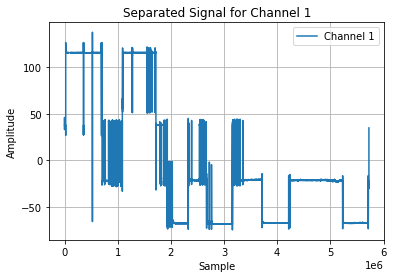

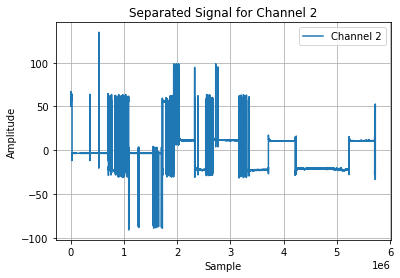

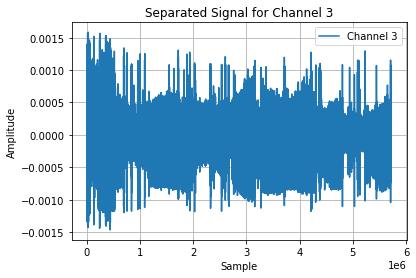

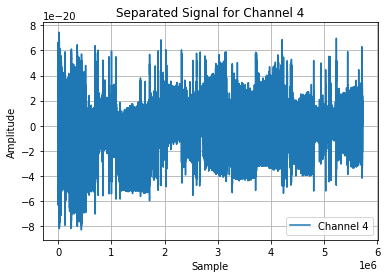

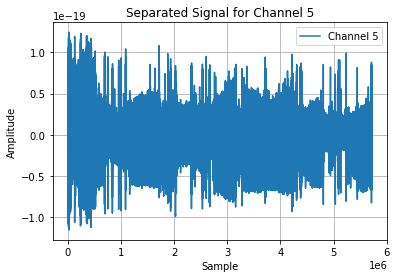

...

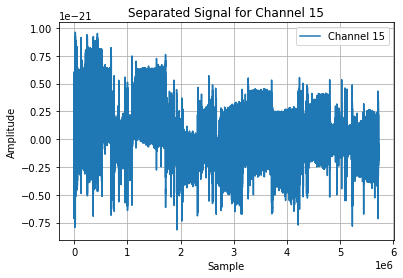

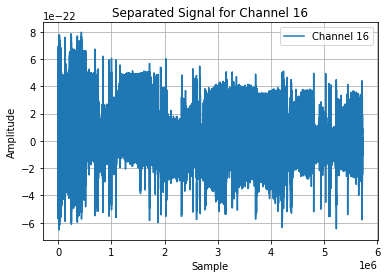

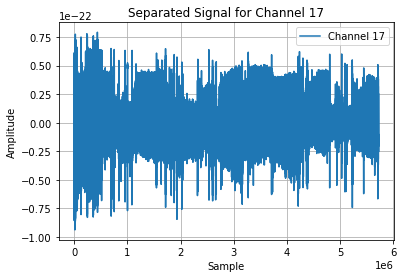

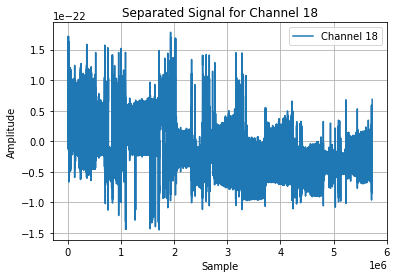

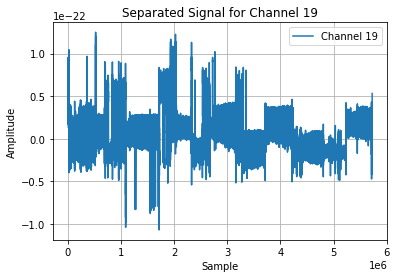

In [13]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

# psg_data' es una matriz de datos PSG (canales x muestras)
psg_data = pp.lSubject [8].getData ()
# Reducción de dimensionalidad con PCA
n_components_pca = 19  # número de componentes principales que deseas mantener
pca              = PCA (n_components = n_components_pca)
psg_data_reduced = pca.fit_transform (psg_data.T)

# Inicializa el modelo ICA
n_components_ica = 3  # Número de componentes independientes que deseas extraer
ica              = FastICA (n_components = n_components_ica, random_state = 0)

# Ajusta el modelo a los datos PSG reducidos
ica.fit (psg_data_reduced)

# Obtiene las componentes independientes
# psg_data_ica contiene las señales EEG transformadas, donde cada columna representa una componente independiente.
psg_data_ica = ica.transform (psg_data_reduced)

# Inverse transform para obtener las señales separadas
#  para transformar las componentes independientes nuevamente a las señales originales
separated_signals = ica.inverse_transform (psg_data_ica)

# Calcula la desviación estándar de cada señal separada
std_devs = np.std (separated_signals, axis = 1)

# Establece un umbral para decidir qué canales mostrar
threshold = 0.1

# Trama las señales separadas de los canales significativos
num_channels = psg_data.shape[0]

for channel in range (num_channels):
    if std_devs [channel] > threshold:
        plt.figure ()
        plt.plot (separated_signals.T[channel], label = f'Channel {channel + 1}')
        plt.title (f'Separated Signal for Channel {channel + 1}')
        plt.xlabel ('Sample')
        plt.ylabel ('Amplitude')
        plt.legend ()
        plt.grid (True)

plt.show ()

Probamos el método detección de parpadeos en señales EEG.

In [ ]:
psg_data_ica = None
ica = None
psg_data_reduced = None

del psg_data_ica, pca, ica, psg_data_reduced, separated_signals
import gc
gc.collect()

16442

In [ ]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

threshold_parpadeo = 6  # Umbral para detección de parpadeo
# Inicializamos el modelo ICA
# Número de componentes independientes a extraer
n_components_ica = 6  
# Detección de parpadeo en cada componente independiente
parpadeo_detected = np.zeros ((n_components_ica,), dtype=bool)

# psg_data' es una matriz de datos PSG (canales x muestras)
psg_data = pp.lSubject[8].getEEG ()  # pp.lSubject [8].getData ()
print(psg_data)

/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 4
  warnings.warn(
/usr/lib/python3/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


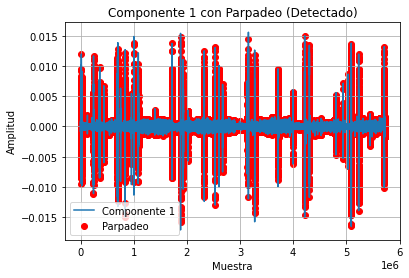

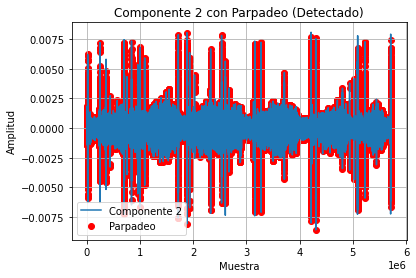

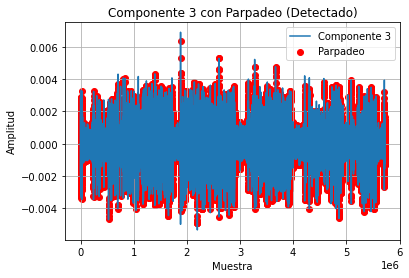

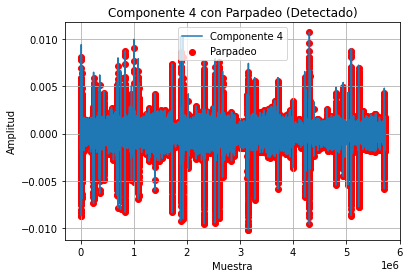

Parpadeo detectado en la Componente 1
Parpadeo detectado en la Componente 2
Parpadeo detectado en la Componente 3
Parpadeo detectado en la Componente 4
No se detectó parpadeo en la Componente 5
No se detectó parpadeo en la Componente 6
Creating RawArray with float64 data, n_channels=4, n_times=4
    Range : 0 ... 3 =      0.000 ...     0.015 secs
Ready.


/tmp/ipykernel_325790/1178868782.py:87: RuntimeWarning: Omitted 2893373 annotation(s) that were outside data range.
  raw.set_annotations(anotaciones)


Using matplotlib as 2D backend.


/tmp/ipykernel_325790/1178868782.py:87: RuntimeWarning: Limited 4 annotation(s) that were expanding outside the data range.
  raw.set_annotations(anotaciones)


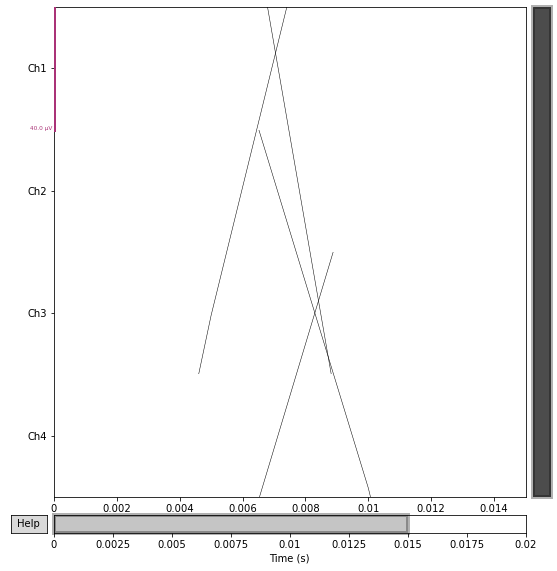

In [14]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

threshold_parpadeo = 6  # Umbral para detección de parpadeo
# Inicializamos el modelo ICA
n_components_ica = 6  # Número de componentes independientes A extraer
# Detección de parpadeo en cada componente independiente
parpadeo_detected = np.zeros((n_components_ica, ),
                              dtype=bool)

# psg_data' es una matriz de datos PSG (canales x muestras)
psg_data = pp.lSubject[8].getEEG().get_data() # pp.lSubject[8].getData() //.getEEG ().get_data ()

# Reducción de dimensionalidad con PCA
n_components_pca = 4  # Número de componentes principales a mantener
pca              = PCA(n_components = n_components_pca)
psg_data_reduced = pca.fit_transform(psg_data.T)

# Obtenemos señales independientes (modelo ICA)
ica              = FastICA(n_components = n_components_ica,
                           random_state = 0)

# Ajustamos el modelo a los datos PSG reducidos
ica.fit(psg_data_reduced)
# Obtenemos las componentes independientes
# psg_data_ica contiene las señales EEG transformadas, donde cada columna representa una componente independiente.
psg_data_ica = ica.transform(psg_data_reduced)

for componente in range(n_components_ica):
  if (psg_data_ica.shape[1] > componente):
    signal         = psg_data_ica[:, componente]
    diff_signal    = np.diff(signal)
    parpadeo_count = 0

    for i in range (1, len (diff_signal) - 1):
        if diff_signal [i - 1] > 0 and diff_signal [i] < 0 and diff_signal [i + 1] > 0:
            parpadeo_count += 1

    if parpadeo_count >= threshold_parpadeo:
        parpadeo_detected [componente] = True

# 'parpadeo_detected' contendrá información binaria donde 1 indica la presencia de parpadeo en cada canal (cada componente).
num_components = psg_data_ica.shape[1]

for componente in range(num_components):
    plt.figure()
    plt.plot(psg_data_ica[:, componente],
             label = f'Componente {componente + 1}')

    if parpadeo_detected[componente]:
        # Marcamos puntos rojos donde se detecta el parpadeo
        parpadeo_indices = np.where(diff_signal > 0)[0]  # Indices donde ocurre el patrón de parpadeo
        plt.scatter(parpadeo_indices, psg_data_ica[parpadeo_indices,
                                                   componente],
                    color = 'red',
                    label = 'Parpadeo')

        plt.title(f'Componente {componente + 1} con Parpadeo (Detectado)')
    else:
        plt.title(f'Componente {componente + 1}')

    plt.xlabel('Muestra')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.grid(True)

plt.show()

num_components = parpadeo_detected.shape [0]

for componente in range (num_components):
    if parpadeo_detected [componente]:
        print(f'Parpadeo detectado en la Componente {componente + 1}')
    else:
        print(f'No se detectó parpadeo en la Componente {componente + 1}')

# Creamos anotaciones con MNE
sfreq = 200
anotaciones = mne.Annotations(onset = parpadeo_indices / sfreq,  # Convertir índices a segundos
                              duration = 1.0,  # Duración de cada anotación en segundos
                              description = 'parpadeo')

# Creamos objeto Raw de MNE
info = mne.create_info(ch_names = [f'Ch{i+1}' for i in range(4)],
                       sfreq = sfreq,
                       ch_types = 'eeg')
nn_ch = psg_data_ica.shape[1]
raw = mne.io.RawArray(psg_data_ica.T[:, :nn_ch], info)

# Asignamos anotaciones al objeto Raw
raw.set_annotations(anotaciones)

# Visualizamos PSG con señales biológicas y anotaciones
# raw.plot(events=anotaciones, scalings='auto', start=0, duration=10, show_options=True)
# Ajustamos anotaciones para que estén dentro del rango de los datos
raw.set_annotations(anotaciones.delete(anotaciones.duration > raw.times[-1]))

# Visualizamos PSG con señales biológicas y anotaciones
events, _ = mne.events_from_annotations(raw)
raw.plot(events = events, show_options = True)

plt.show()

In [15]:
psg_data_ica = None
ica = None
psg_data = None
psg_data_reduced = None

del psg_data, psg_data_ica, ica, psg_data_reduced
import gc
gc.collect()

10645

- Método sencillo para la detección de artefactos relacionado con el umbral de la amplitud de las señales separadas.

/home/javi/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


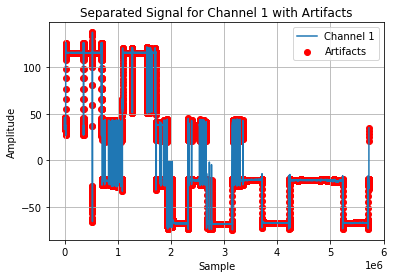

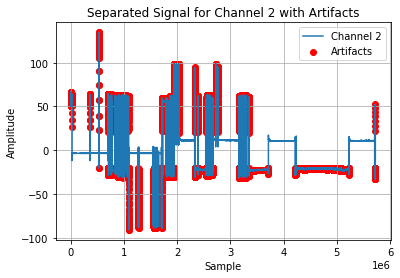

/usr/lib/python3/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


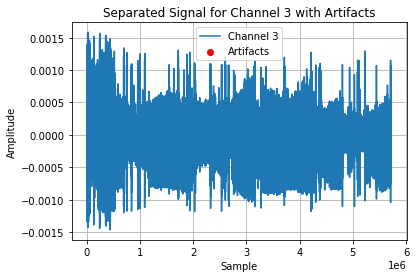

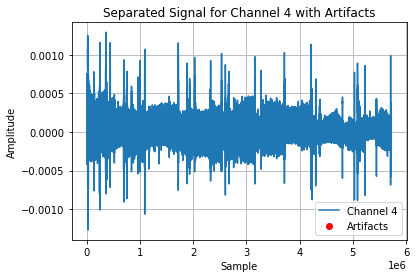

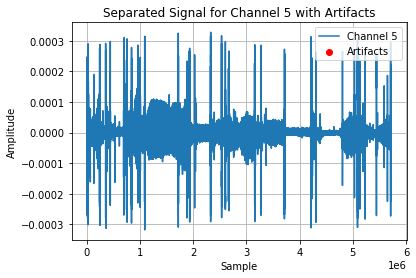

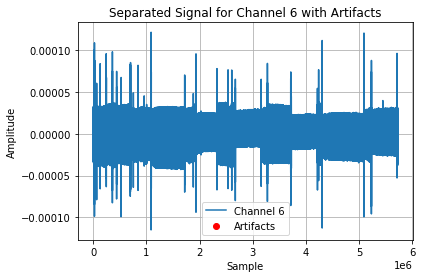

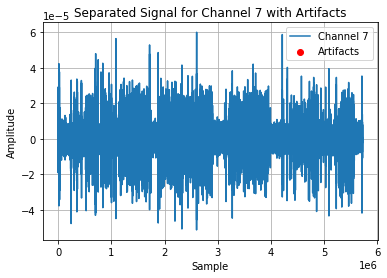

...

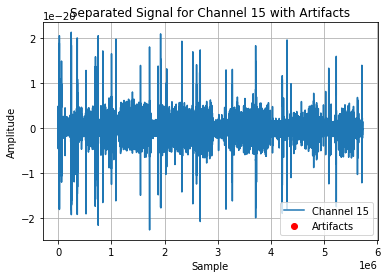

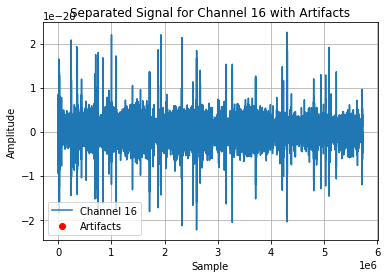

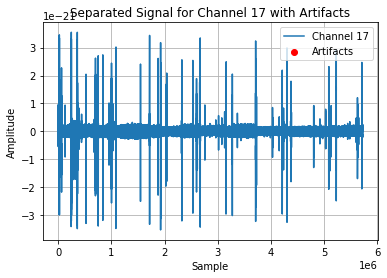

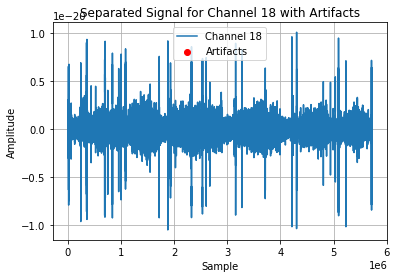

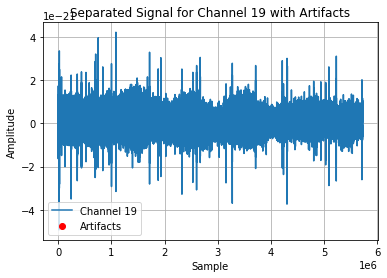

In [16]:
import numpy as np
from sklearn.decomposition import FastICA, PCA
import matplotlib.pyplot as plt

# 'psg_data' es una matriz de datos PSG (canales x muestras)
psg_data = pp.lSubject[8].getData ()

# Reducción de dimensionalidad con PCA
n_components_pca = 19 #  Número de componentes principales a mantener. Será el número de canales que tengo de origen
pca              = PCA(n_components = n_components_pca)
psg_data_reduced = pca.fit_transform (psg_data.T)

# Inicializamos el modelo ICA
n_components_ica = 10  # Número de componentes independientes que deseamos extraer
ica              = FastICA(n_components = n_components_ica, random_state = 0)

# Ajustamos el modelo a los datos PSG reducidos
ica.fit(psg_data_reduced)

# Obtienemos las componentes independientes
independent_components = ica.transform(psg_data_reduced)

# Inverse transform para obtener las señales separadas
separated_signals = ica.inverse_transform(independent_components)

# Detección de artefactos (ejemplo simple: umbral de amplitud)
threshold = 20  # Define un umbral de amplitud para detectar artefactos en las señales separadas

# Creamos una lista para almacenar los índices de artefactos por canal
artifacts_indices = []

for channel in range(psg_data.shape [0]):
    signal = separated_signals.T[channel]
    # mos los índices donde la amplitud excede el umbral
    artifact_indices = np.where(np.abs (signal) > threshold)[0]
    artifacts_indices.append(artifact_indices)

# Trama de las señales separadas con artefactos resaltados
for channel, artifact_indices in enumerate(artifacts_indices):
    plt.figure()
    plt.plot(separated_signals.T[channel], label = f'Channel {channel + 1}')
    plt.scatter(artifact_indices, separated_signals.T[channel][artifact_indices], c = 'r', label = 'Artifacts')
    plt.titl(f'Separated Signal for Channel {channel + 1} with Artifacts')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)

plt.show()

- Detección de artefactos con `yasa`

In [ ]:
hypno = pp.lSubject[2].get_raw_eData()
raw_  = pp.lSubject[2].getData()
data  = raw_ #sujto_0.getData()

In [ ]:
sf = 200
art, zscores = yasa.art_detect(data, sf, window = 30, method = 'covar', threshold = 3)
art.shape, zscores.shape

((824,), (824,))

In [ ]:
print(f'{art.sum()} / {art.size} epochs rejected.')

0 / 941 epochs rejected.


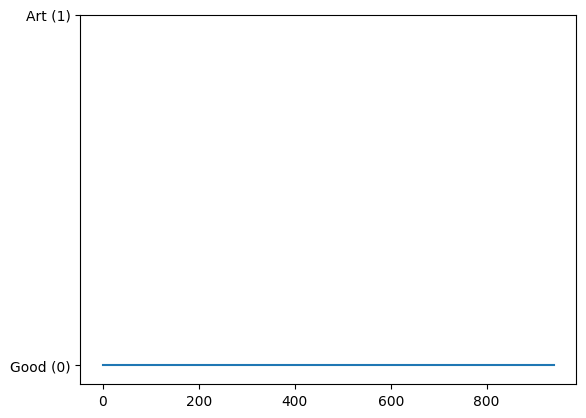

In [ ]:
plt.plot(art);
plt.yticks([0, 1], labels = ['Good (0)', 'Art (1)']);

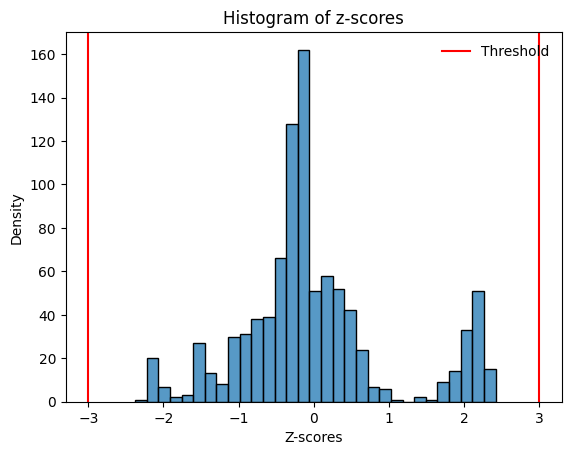

In [ ]:
import seaborn as sns

sns.histplot(zscores)
plt.title('Histogram of z-scores')
plt.xlabel('Z-scores')
plt.ylabel('Density')
plt.axvline(3, color = 'r', label = 'Threshold')
plt.axvline(-3, color = 'r')
plt.legend(frameon = False);
plt.show()

In [ ]:
from scipy.special import erf
threshold = 3
perc_expected_rejected = (1 - erf(threshold / np.sqrt(2))) * 100
print(f'{perc_expected_rejected:.2f}% of all epochs are expected to be rejected.')

0.27% of all epochs are expected to be rejected.


In [ ]:
# Actual
(art.sum() / art.size) * 100
print(f'{(art.sum() / art.size) * 100:.2f}% of all epochs were actually rejected.')

0.00% of all epochs were actually rejected.


		0 / 954 epochs rejected.


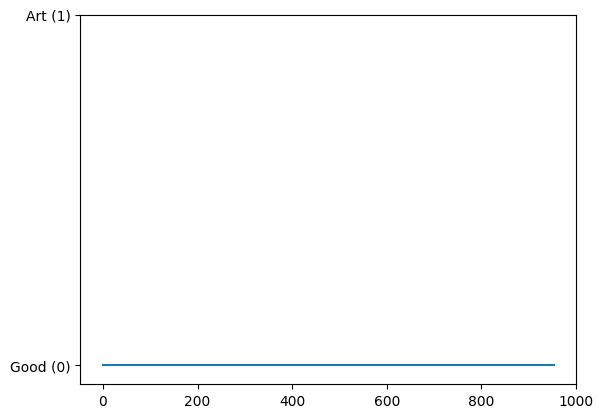

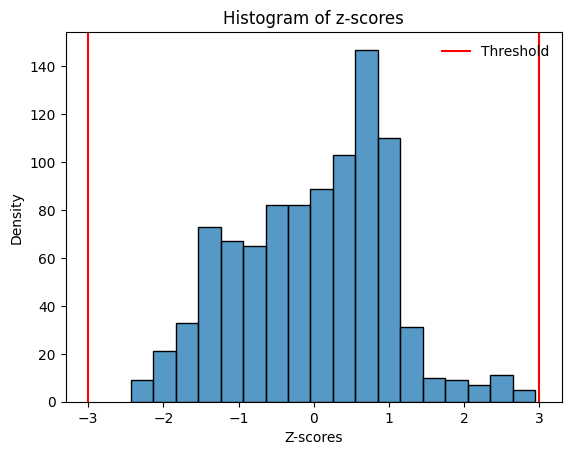

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		3 / 941 epochs rejected.


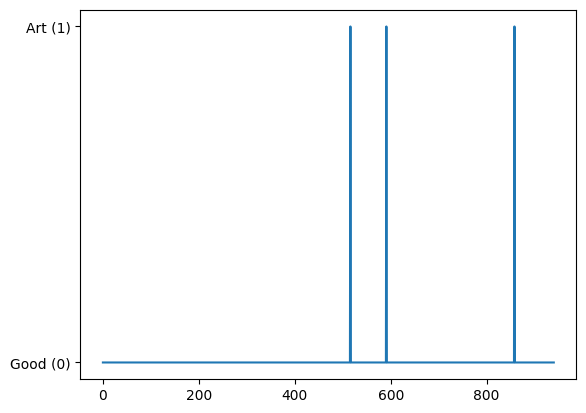

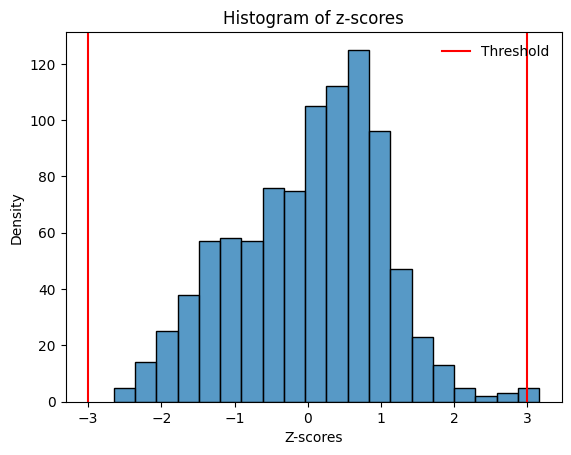

		 0.27% of all epochs are expected to be rejected.
		 0.32% of all epochs were actually rejected.
		0 / 824 epochs rejected.


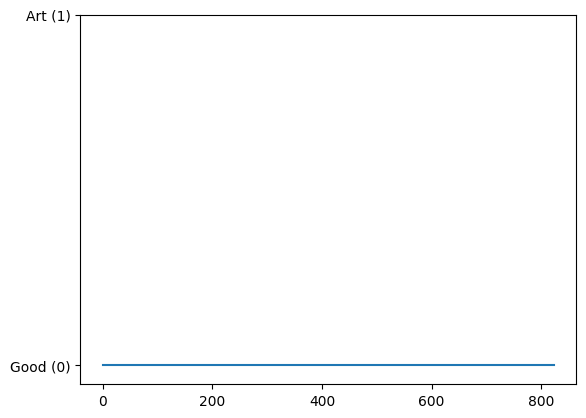

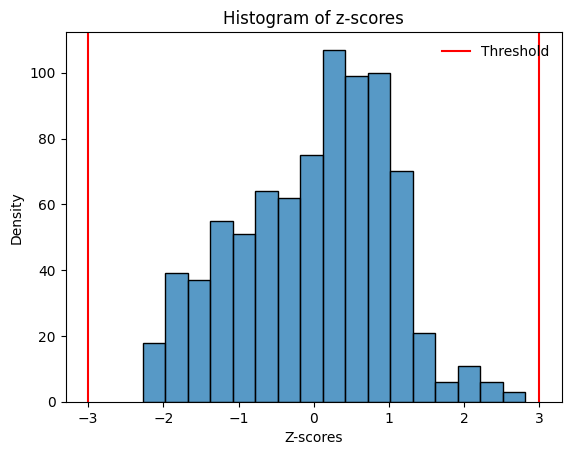

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		0 / 794 epochs rejected.


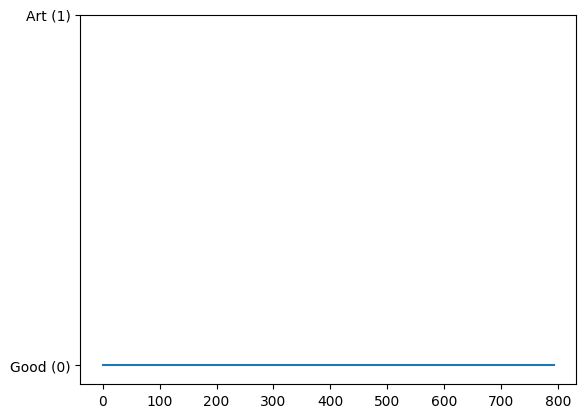

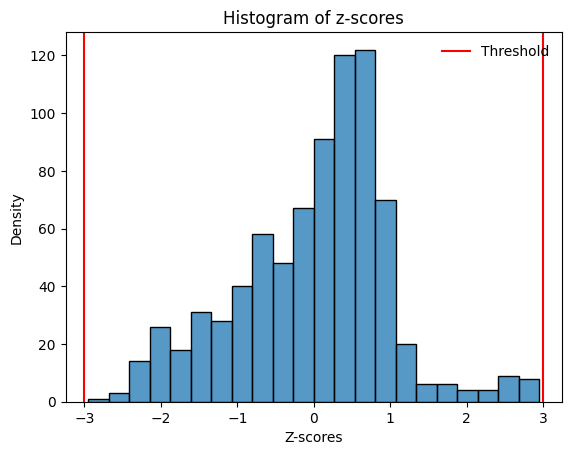

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		0 / 944 epochs rejected.


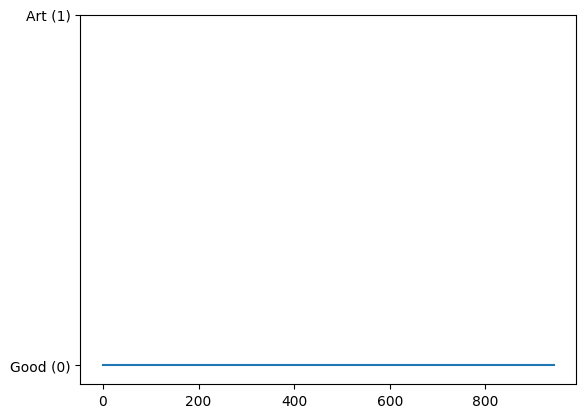

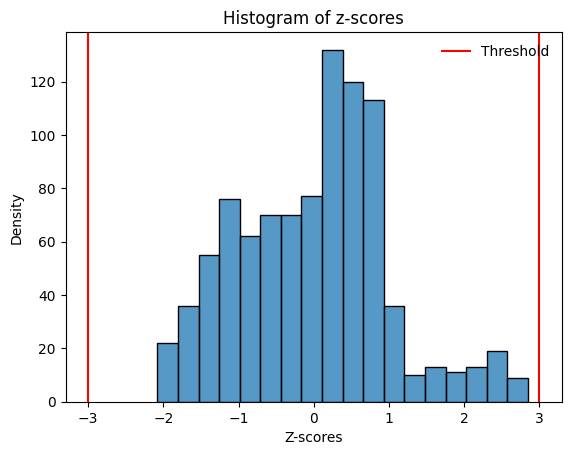

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		2 / 853 epochs rejected.


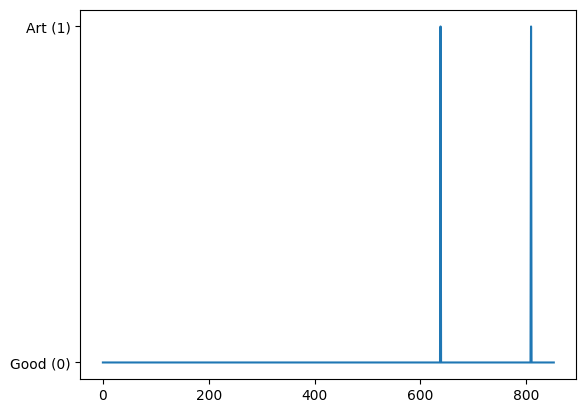

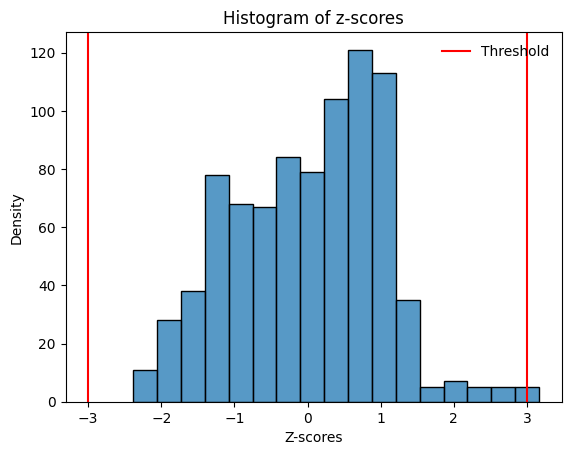

		 0.27% of all epochs are expected to be rejected.
		 0.23% of all epochs were actually rejected.
		0 / 814 epochs rejected.


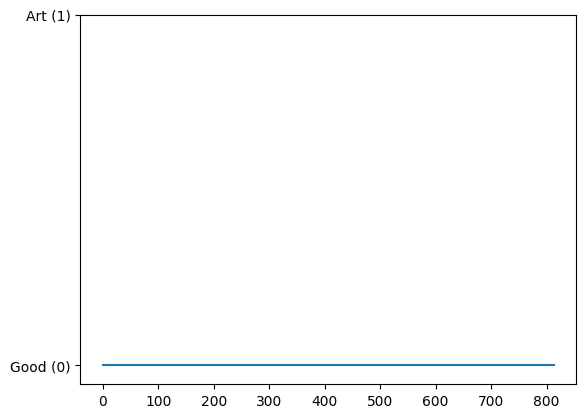

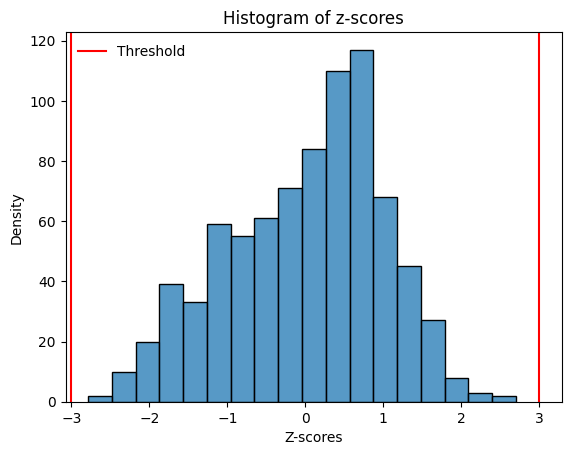

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		14 / 1000 epochs rejected.


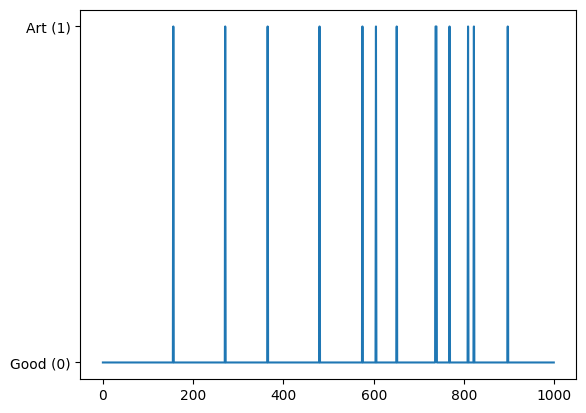

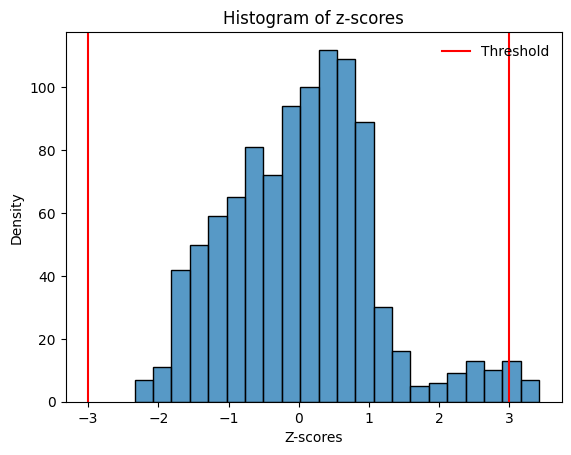

		 0.27% of all epochs are expected to be rejected.
		 1.40% of all epochs were actually rejected.
		0 / 969 epochs rejected.


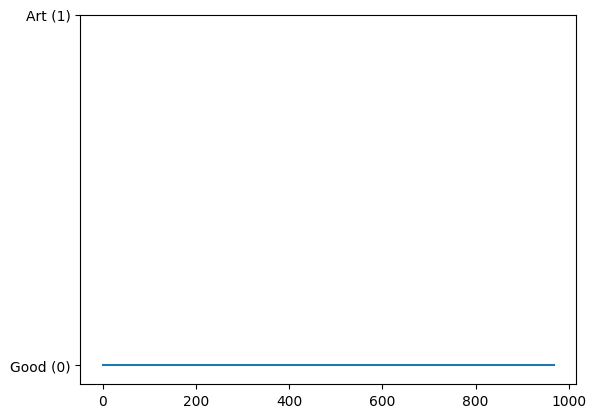

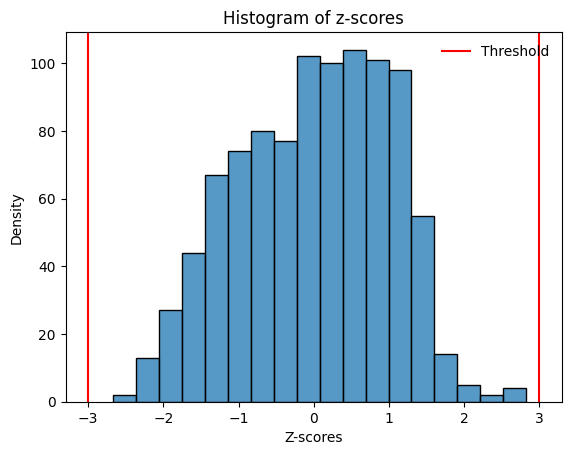

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.
		0 / 796 epochs rejected.


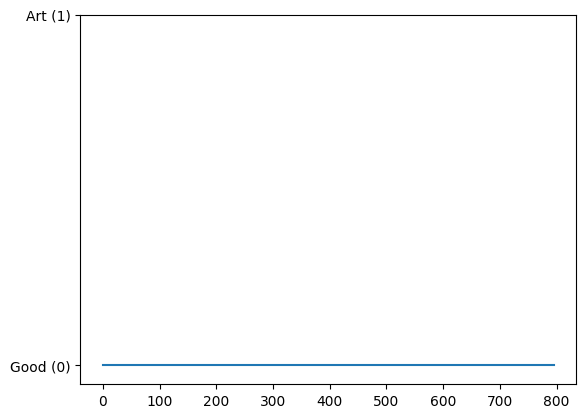

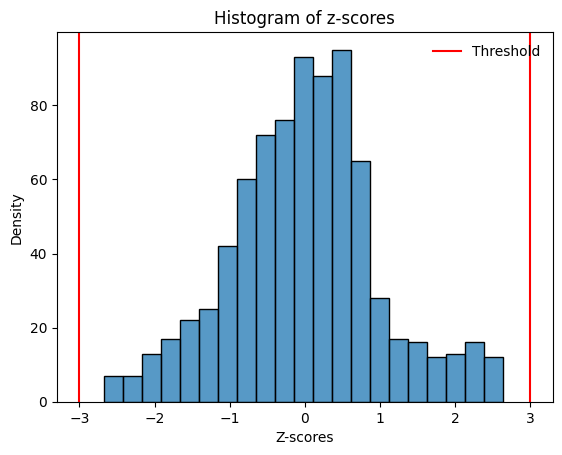

		 0.27% of all epochs are expected to be rejected.
		 0.00% of all epochs were actually rejected.


In [ ]:
import numpy as np
import yasa
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.special import erf

# Supongamos que pp.lSubject es una lista de objetos Subject
def detect_and_plot_artifacts(data, sf, window = 30, method = 'covar', threshold = 3):
    # Detectar artefactos
    art, zscores = yasa.art_detect(data,
                                   sf,
                                   window = window,
                                   method = method,
                                   threshold = threshold)

    # Imprimimos información sobre los artefactos
    print(f'\t\t{art.sum()} / {art.size} epochs rejected.')

    # Graficamos la presencia de artefactos
    plt.plot(art)
    plt.yticks([0, 1], labels=['Good (0)', 'Art (1)'])
    plt.show()

    # Histograma de z-scores
    sns.histplot(zscores)
    plt.title('Histogram of z-scores')
    plt.xlabel('Z-scores')
    plt.ylabel('Density')
    plt.axvline(threshold, color = 'r', label = 'Threshold')
    plt.axvline(-threshold, color = 'r')
    plt.legend(frameon = False)
    plt.show()

    # Calculamos y mostramos el porcentaje esperado de rechazo
    perc_expected_rejected = (1 - erf(threshold / np.sqrt(2))) * 100
    print(f'\t\t {perc_expected_rejected:.2f}% of all epochs are expected to be rejected.')

    # Calculamos y mostramos el porcentaje real de rechazo
    perc_actual_rejected = (art.sum() / art.size) * 100
    print(f'\t\t {perc_actual_rejected:.2f}% of all epochs were actually rejected.')
    
    return art

# Iteramos sobre todos los sujetos y obtenemos los índices de artefactos para cada uno
for subject in pp.lSubject:
    raw_data = subject.getEEG()
    artifact_indices = detect_and_plot_artifacts(raw_data, sf = 200)
    if len(artifact_indices) > 0 and raw_data is not None:
        if raw_data.annotations is not None:
            # Eliminamos anotaciones anteriores (si las hay)
            for idx in range(len(raw_data.annotations)):
                raw_data.annotations.delete(idx)
            raw_data.annotations.append(artifact_indices / 200, np.zeros_like(artifact_indices), 'artifact')

## 5.3. Filtrado

Se filtra para eliminar el ruido no deseado, con el objetivo de mejorar la calidad de la señal PSG y aumentar la SNR (relación señal-ruido). También poder remuestrear:
        
    1) Un filtro para eliminar el ruido eléctrico de 50Hz. NR: Los datos cargados ya tienen eliminada esta frecuencia.

    2) Un filtro Butterworth de paso de banda con un corte inferior de frecuencia de 0.3 Hz y un corte superior de frecuencia de 45 Hz para canales EEG y para el resto de canales las frecuencias necesarias. Al igual que el paso anterior, este filtrado ya está hecho en los datos cargados, para cada sujeto.
    
    3) Notar que al cargar el PSG de cada sujeto ya se ha realizado un filtrado pasa baja a 33 Hz. Ya que deseamos remuestrear posteriormente la señal a 100 Hz, siendo 33 Hz (1/3) * 100 = 33 Hz de la frecuencia de muestreo deseada.

Según el artículo de referencia [1], *a notch filter at 50 Hz (los datos ya vienen con el fitro realizado) a band-pass Butterworth filter with lower cut-off of 0.5 Hz and higher cut-off of 45 Hz. (Idem)*.

## 5.4. Segmentación y diezmado

En esta subsección, procedemos a la segmentación en ventanas de 30 segundos y diezmado de la señal pasando el valor `dicem` calculado al cargar el PSG.

- Diezmamos la señal por ventana. La función `doSegmentResample` realmente primero segmenta y luego hace el remuestreo indicado en la creacion del objeto.

- Por otro lado, una vez hecha la segmentación y el remuestreo, tal como nos indica el paper, eliminar las 30 últimas componentes (muestras) de cada señal por cada canal.

In [9]:
for sub in pp.lSubject:
    # print ('Subject:',sub.subject)
    eeg_raw         = sub.getEEG()
    eeg_names       = eeg_raw.info['ch_names']
    # print ('\t',eeg_names)
    time, eeg_resam = sub.doSegmentResample (eeg_raw)
    # print ('\t',eeg_resam.shape)
    eeg_resam = eeg_resam[:-30, :, :] # Eliminamos las 30 últimas porque lo indica el artículo de referencia
    sub.set_eeg_raw_resam(eeg_resam, eeg_names)
    # print('\t',eeg_resam.shape)

['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1']


In [10]:
# Los canales EEG y EOG:
for sub in pp.lSubject:
    # print('Subject:', sub.subject)
    eeg_eog_raw         = sub.getChannels(eeg = True, eog = True)
    eeg_eog_names       = eeg_eog_raw.info['ch_names']
    # print('\t',eeg_eog_names)
    time, eeg_eog_resam = sub.doSegmentResample(eeg_eog_raw)
    # print('\t',eeg_eog_resam.shape)
    eeg_eog_resam = eeg_eog_resam[:-30,:,:] # Eliminamos las 30 últimas porque lo indica el artículo de referencia
    # print('\t',eeg_eog_resam.shape)
    sub.set_eeg_eog_raw_resam(eeg_eog_resam, eeg_eog_names)
    # print('\t',eeg_resam.shape)

['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1', 'O2-A1', 'ROC-A1', 'LOC-A2', 'F3-A2', 'C3-A2']
['O1-A2', 'F4-A1', 'C4-A1

# 6. Extracción de características

## 6.1. Extracción de las características de [1]

La Clase `ExtractFeatures` tiene todas las funciones. Podemos extraer:

- EEG and EOG channels:
    * sallis (q=2), Renyi (α=2) and Shannon Entropy
    * Harmonic Parameters
    * Hjorth Parameters
    * Relative Spectral Power
    * Slow Wave Index (SWI)
    * Autoregressive Coefficients (order 3)
    * Percentile 25, 50, 75
    * Skewness, Kurtosis        
- EOG channels:
    * Peak to Peak Amplitude
- EEG y Each sub-band:
    * MODWT-based Features: Energy, Percentage of Energy, Mean and Standard deviation of each sub-band


La relación de dichas características con las fases del sueño son:

- **EEG and EOG channels - Entropía (Sallis, Renyi, Shannon):**
    + Relación: La entropía refleja la complejidad y la irregularidad en las señales EEG y EOG. Durante diferentes etapas del sueño, la complejidad de las señales puede variar. Por ejemplo, en el sueño REM, las señales tienden a ser más complejas y desordenadas.

- **Harmonic Parameters y Hjorth Parameters:**
    + Relación: Estos parámetros proporcionan información sobre la forma de las ondas en las señales EEG. Cambios en la forma de onda pueden indicar transiciones entre etapas del sueño. Por ejemplo, los parámetros Hjorth pueden ayudar a identificar la actividad de alta frecuencia, como la presente en el sueño REM.
    - HJORTH PARAMETERS:
        - Activity (Actividad): Mide la amplitud promedio de la señal.
        - Mobility (Movilidad): Mide la frecuencia promedio de la señal.
        - Complexity (Complejidad): Mide la variabilidad de la frecuencia en la señal.

- **Relative Spectral Power:**
    + Relación: La distribución de la potencia espectral en diferentes bandas de frecuencia (delta, theta, alpha, beta, gamma) varía durante las distintas etapas del sueño. Por ejemplo, un aumento en la potencia delta puede indicar el sueño profundo (NREM), mientras que la actividad beta puede estar asociada al sueño REM.

- **Slow Wave Index (SWI):**
    + Relación: El SWI cuantifica la presencia de ondas lentas, que son características del sueño profundo. Un mayor SWI puede indicar una proporción más alta de sueño NREM y, por lo tanto, una fase más profunda del sueño.

- **Autoregressive Coefficients (order 3):**
    + Relación: Estos coeficientes pueden caracterizar la dinámica temporal de las señales EEG. Cambios en estos coeficientes pueden indicar variaciones en la actividad cerebral asociadas con diferentes etapas del sueño.

- **Percentiles (25, 50, 75), Skewness, Kurtosis:**
    + Relación: Estas estadísticas resumen la distribución de los datos en las señales EEG y EOG. Pueden indicar la presencia de eventos anómalos o cambios en la forma de onda durante las etapas del sueño.

- **EOG channels - Peak to Peak Amplitude:**
    + Relación: La amplitud pico a pico en las señales EOG puede variar durante diferentes fases del sueño. Por ejemplo, mayores amplitudes pueden indicar movimientos oculares rápidos característicos del sueño REM.

- **EEG y Each sub-band - MODWT-based Features: Energy, Percentage of Energy, Mean and Standard deviation of each sub-band:**
    + Relación: El análisis en sub-bandas (por ejemplo, delta, theta, alpha) proporciona detalles sobre la distribución de energía en diferentes frecuencias. Cambios en estas características pueden reflejar la transición entre las etapas del sueño, ya que las frecuencias predominantes varían.

In [11]:
extract = ExractFeatures(pp.conf_data)
for sub in pp.lSubject:
    # print('Subject:', sub.subject)
    eeg_resam, eeg_names         = sub.get_eeg_raw_resam()
    eeg_eog_resam, eeg_eog_names = sub.get_eeg_eog_raw_resam()
    sub.set_paper_feature_norm_matrix(extract.extract_paper_features(eeg_resam,
                                                                     eeg_names,
                                                                     eeg_eog_resam,
                                                                     eeg_eog_names,
                                                                     level = 3))
pp.lSubject[0].get_paper_feature_norm_matrix()

Subject: 6
Subject: 4
Subject: 8
Subject: 3
Subject: 7
Subject: 5
Subject: 2
Subject: 9
Subject: 1
Subject: 10


,Energy_s_nivel-1_Canal-O1-A2,Energy_d_nivel-1_Canal-O1-A2,Percentage_energy_s_nivel-1_Canal-O1-A2,Percentage_energy_d_nivel-1_Canal-O1-A2,Mean_s_nivel-1_Canal-O1-A2,Mean_d_nivel-1_Canal-O1-A2,Std_deviation_s_nivel-1_Canal-O1-A2,Std_deviation_d_nivel-1_Canal-O1-A2,Energy_s_nivel-1_Canal-F4-A1,Energy_d_nivel-1_Canal-F4-A1,...,Percentil50_F3-A2,Percentil50_C3-A2,Percentil75_O1-A2,Percentil75_F4-A1,Percentil75_C4-A1,Percentil75_O2-A1,Percentil75_ROC-A1,Percentil75_LOC-A2,Percentil75_F3-A2,Percentil75_C3-A2
0,7.877584e-13,3.827433e-12,1.793814,64.805300,1.730601e-07,8.025774e-07,4.086438e-07,5.592207e-07,9.984503e-13,4.443003e-12,...,8.340305e-08,1.397417e-07,1.894502e-06,1.976343e-06,1.736273e-06,1.762761e-06,2.058265e-06,2.604764e-06,2.199003e-06,1.866567e-06
1,2.884275e-12,4.378524e-12,51.534521,55.712371,7.477975e-07,-8.668120e-07,4.023278e-07,5.858907e-07,2.768917e-12,1.397024e-11,...,3.287122e-08,9.796863e-09,1.388383e-06,8.380086e-07,8.486788e-07,1.091260e-06,7.302970e-07,6.950321e-07,8.387663e-07,9.265201e-07
2,3.763747e-12,1.942999e-12,8.909356,88.111377,6.647579e-07,-6.323346e-08,7.064233e-07,6.940831e-07,3.972120e-12,3.437004e-12,...,-8.448397e-09,-2.335692e-08,9.158655e-07,9.438726e-07,8.577809e-07,7.830601e-07,8.799506e-07,6.437996e-07,8.252971e-07,7.934583e-07
3,9.245739e-14,6.595357e-12,0.357688,76.459332,2.757269e-08,-1.040333e-06,1.495129e-07,7.526923e-07,2.773305e-13,3.842782e-12,...,-1.883530e-08,-5.736141e-09,6.934272e-07,7.717873e-07,7.070651e-07,6.423942e-07,7.773066e-07,6.506189e-07,8.466400e-07,7.569879e-07
4,8.251030e-13,3.228449e-11,5.452811,96.955454,4.417207e-07,-2.804984e-06,1.056342e-07,4.507639e-07,3.283667e-13,3.152991e-11,...,3.462841e-08,2.123687e-08,7.279220e-07,7.731816e-07,7.473077e-07,6.931449e-07,7.097192e-07,5.256441e-07,7.511199e-07,7.802103e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,5.753508e-12,1.093513e-11,30.640113,80.052673,1.079258e-06,-1.289053e-06,5.230472e-07,1.035435e-06,3.879043e-12,1.241866e-11,...,3.259420e-08,1.426668e-08,6.924461e-07,7.150275e-07,6.614229e-07,5.968342e-07,5.177721e-07,5.113420e-07,7.761048e-07,7.470384e-07
819,2.831619e-13,5.802462e-13,4.767611,26.602752,1.376398e-07,-3.205892e-07,2.276967e-07,2.056310e-07,1.838487e-13,5.825916e-13,...,3.056678e-08,-7.938843e-09,6.200787e-07,8.224207e-07,7.316316e-07,6.059367e-07,5.789283e-07,4.807172e-07,6.892734e-07,6.667963e-07
820,6.896188e-13,5.856500e-13,32.432801,80.746495,5.683229e-09,3.632243e-07,4.151775e-07,1.203353e-07,6.570139e-13,2.199750e-12,...,1.433694e-08,3.156120e-08,7.659014e-07,7.924929e-07,7.910302e-07,6.446463e-07,5.405371e-07,5.128369e-07,9.115879e-07,9.027841e-07
821,1.487735e-13,1.638185e-13,3.440259,49.056641,-1.520831e-07,4.612325e-08,1.185922e-07,1.970464e-07,2.407891e-13,3.890695e-14,...,2.972890e-08,2.393718e-08,6.741715e-07,8.067064e-07,7.425204e-07,6.147657e-07,5.899730e-07,6.015475e-07,8.484086e-07,7.875193e-07


## 6.2 Extracción de características con `yasa`

- **Detección de Espigas (Spindles)**. `yasa` proporciona herramientas para la detección de espigas, que son eventos característicos del sueño ligero. Las características extraídas de las espigas, como la densidad de espigas, la duración y la frecuencia, pueden ser útiles para identificar patrones de sueño ligero. La detección de espigas puede ayudar a identificar las etapas del sueño:

        1) Distinguir entre las etapas del sueño ligero y profundo: Las espigas suelen ser más prominentes durante el sueño de ondas lentas (etapas 3 y 4 del sueño NREM), que son las etapas de sueño más profundo. La detección de espigas puede ayudar a identificar cuándo un individuo está en estas etapas de sueño más restauradoras.
        
        2) Identificar la transición entre etapas del sueño: Las espigas pueden ocurrir durante la transición entre diferentes etapas del sueño, como el paso de la vigilia al sueño ligero o del sueño ligero al sueño profundo. La presencia de espigas en el EEG puede indicar estos cambios de etapa.
        
        3) Monitorear la calidad del sueño: La presencia de espigas en el EEG también puede proporcionar información sobre la calidad del sueño. Una mayor cantidad de espigas puede sugerir una mayor actividad cerebral durante el sueño, lo que a menudo se asocia con una menor calidad del sueño.
        
        4) Evaluar trastornos del sueño: La detección de espigas en el EEG también se utiliza para identificar y diagnosticar trastornos del sueño, como el síndrome de piernas inquietas o la epilepsia nocturna, que pueden afectar la calidad y la estructura del sueño.
        
        
- **Detección de Ondas Lentas (Slow Waves)**. Las ondas lentas son otro componente importante del sueño. `yasa` permite la detección y caracterización de estas ondas, lo que es esencial para analizar la calidad del sueño profundo. La detección de ondas lentas puede proporcionar información sobre las etapas del sueño. Permite distinguir claramente entre el sueño de ondas lentas y el sueño REM (movimiento rápido de los ojos), que son las dos principales etapas del sueño:

        1) Evaluar la calidad del sueño: La cantidad y la amplitud de las ondas lentas en el EEG pueden proporcionar información sobre la calidad del sueño profundo. Un aumento en la cantidad de ondas lentas suele asociarse con un sueño de mejor calidad y un mayor grado de restauración física y mental.
        
        2) Monitorear trastornos del sueño: La falta de ondas lentas o una alteración en su patrón puede ser indicativa de trastornos del sueño, como el insomnio o la apnea del sueño. La detección de problemas en las ondas lentas en el EEG puede ser útil en la evaluación y el diagnóstico de estos trastornos.
        
        3) Evaluar la eficacia de tratamientos: La detección de ondas lentas puede ser útil para evaluar la eficacia de tratamientos para trastornos del sueño o para seguimiento en investigaciones relacionadas con el sueño. Los cambios en las ondas lentas pueden indicar mejoras o empeoramientos en la calidad del sueño de una persona.

- **Análisis de Variabilidad de la Frecuencia Cardíaca (HRV)**. La biblioteca también proporciona herramientas para calcular la variabilidad de la frecuencia cardíaca a partir de los datos de ECG en el PSG. Esto puede ser útil para evaluar el sistema nervioso autónomo durante el sueño. En concreto permite:

         1) Distinguir entre el sueño REM y el sueño NREM: Durante el sueño, el sistema nervioso autónomo regula la frecuencia cardíaca, y esta regulación cambia de manera característica en las diferentes etapas del sueño. El análisis de la HRV puede ayudar a distinguir entre el sueño de movimiento rápido de los ojos (REM) y el sueño no REM (NREM) al evaluar patrones de variabilidad específicos en la frecuencia cardíaca.
         
        2) Identificar la activación del sistema nervioso autónomo: Las fluctuaciones en la HRV pueden indicar la activación del sistema nervioso simpático (que tiende a acelerar la frecuencia cardíaca) o del sistema nervioso parasimpático (que tiende a desacelerarla). La HRV puede mostrar cómo estos sistemas se activan y desactivan durante el sueño, lo que es relevante para comprender las respuestas del cuerpo a los diferentes estados de sueño.
        
        3) Evaluar la calidad del sueño: El análisis de la HRV también puede utilizarse para evaluar la calidad del sueño. Una HRV alterada o anormal puede indicar problemas en la regulación del sistema nervioso durante el sueño y puede estar asociada con trastornos del sueño, como la apnea del sueño o el insomnio.
        
        4) Monitorizar cambios en el sueño a lo largo del tiempo: El análisis de la HRV se puede utilizar para realizar un seguimiento de las variaciones en el sueño a lo largo del tiempo. Esto es útil en investigaciones y estudios clínicos para evaluar cómo los tratamientos o intervenciones afectan la calidad del sueño y las respuestas del sistema nervioso autónomo.
        


- **(EEG-HRV coupling)**.  El acoplamiento entre EEG y HRV puede ofrecer información sobre la interacción entre el sistema nervioso central y el sistema nervioso autónomo. Las características relacionadas con este acoplamiento podrían ser útiles para comprender la relación entre el cerebro y el corazón durante el sueño.

        Identificar transiciones entre etapas del sueño: Durante la noche, las personas suelen pasar de una etapa de sueño a otra. El análisis del acoplamiento EEG-HRV puede ayudar a detectar estas transiciones al mostrar cambios en la sincronización entre la actividad cerebral y la frecuencia cardíaca. Esto puede ser útil para identificar cuándo ocurren las transiciones entre sueño ligero, sueño profundo y sueño REM.

        Evaluar la calidad del sueño: La calidad del sueño se relaciona con la eficiencia de las transiciones entre las etapas del sueño y la estabilidad de estas etapas. El acoplamiento EEG-HRV puede proporcionar información sobre cómo la calidad del sueño se ve afectada por la sincronización entre la actividad cerebral y la frecuencia cardíaca.

        Identificar trastornos del sueño: La presencia de patrones anómalos en el acoplamiento EEG-HRV puede ser indicativa de trastornos del sueño, como la apnea del sueño o el síndrome de piernas inquietas. Estos trastornos pueden afectar la sincronización entre la actividad cerebral y la actividad cardíaca durante el sueño.
        
        
- **(SO-sigma coupling)**. Se centra en el acoplamiento entre las oscilaciones lentas (Slow Oscillations, SO) y las oscilaciones sigma durante el sueño. El acoplamiento entre estas oscilaciones puede proporcionar información valiosa sobre la calidad del sueño y los patrones de sueño. La extracción de características relacionadas con este acoplamiento podría ser relevante para caracterizar eventos específicos durante el sueño. La detección del acoplamiento SO-sigma en el EEG puede proporcionar evidencias sobre las etapas del sueño de la siguiente manera:

        1) Distinción entre el sueño REM y el sueño NREM: Las ondas sigma son prominentes durante el sueño REM, que es una etapa del sueño caracterizada por un sueño más activo y el movimiento rápido de los ojos. Las ondas delta son más prominentes en el sueño NREM, particularmente en las etapas más profundas. La presencia de acoplamiento SO-sigma puede indicar la transición entre estas dos etapas del sueño y ayudar a identificar cuándo una persona está en sueño REM.

        2) Identificación de microdespertares: Durante el sueño, las personas pueden experimentar microdespertares breves que los sacan de un estado de sueño más profundo. Estos microdespertares suelen estar asociados con cambios en el acoplamiento SO-sigma, ya que se produce una transición de ondas sigma del sueño REM a ondas delta del sueño NREM.

        3) Evaluación de la calidad del sueño: La presencia de acoplamiento SO-sigma anormal o irregular puede ser indicativa de problemas en la calidad del sueño. Si el patrón de acoplamiento es disruptivo o inusual, esto puede sugerir trastornos del sueño, como el insomnio o el síndrome de las piernas inquietas, que pueden afectar negativamente la calidad del sueño.
        
- **Extracción de Características de EEG**. `yasa` permite calcular características específicas de la señal EEG, como la potencia en diferentes bandas de frecuencia (delta, theta, alpha, beta, gamma), lo que puede proporcionar información sobre la actividad cerebral durante el sueño.

        1) Delta (0.5-4 Hz): Las ondas delta son de baja frecuencia y están asociadas principalmente con el sueño profundo, específicamente con las etapas 3 y 4 del sueño no REM (NREM). Un aumento en la potencia de la banda delta en el EEG indica una mayor presencia de sueño profundo, lo que sugiere una fase de sueño reparador.

        2) Theta (4-8 Hz): Las ondas theta son típicas del sueño ligero y también pueden estar presentes en las etapas iniciales del sueño NREM. Un aumento en la potencia de la banda theta indica una transición desde la vigilia al sueño ligero.

        3) Alpha (8-13 Hz): Las ondas alpha son comunes durante la vigilia y pueden disminuir en intensidad durante el sueño. La presencia de ondas alfa en el EEG durante el sueño generalmente se asocia con el sueño ligero.

        4) Beta (13-30 Hz): Las ondas beta son típicas de la vigilia y la actividad mental consciente. Su presencia en el EEG durante el sueño sugiere actividad cerebral activa, como durante el sueño REM o sueño paradójico.

        5) Gamma (30-100 Hz): Las ondas gamma son de alta frecuencia y se asocian con la activación cortical. Su presencia en el EEG puede indicar la fase de sueño REM, durante la cual se producen sueños vívidos y el cerebro muestra actividad similar a la vigilia.

- **(Nonlinear features)**. Este *notebook* se enfoca en la extracción de características no lineales a partir de datos de EEG. Las características no lineales pueden proporcionar información adicional sobre la complejidad de la actividad cerebral y pueden ser relevantes para la detección de patrones anómalos o para caracterizar eventos específicos en la señal EEG. Estas características no lineales pueden proporcionar información adicional sobre las etapas del sueño y otros aspectos del sueño que no se pueden capturar completamente con el análisis de características lineales. Algunas formas en que el análisis de características no lineales puede aportar a la comprensión de las etapas del sueño son las siguientes:

        1) Detección de transiciones entre etapas del sueño: Las características no lineales pueden ayudar a identificar las transiciones entre las diferentes etapas del sueño, como la transición del sueño REM (movimiento rápido de los ojos) al sueño NREM (movimiento no rápido de los ojos) y viceversa. Estas transiciones pueden tener patrones no lineales específicos que se pueden detectar mediante análisis avanzados.

        2) Evaluación de la variabilidad temporal: Las características no lineales pueden proporcionar información sobre la variabilidad temporal de las señales del EEG durante el sueño. Esta variabilidad temporal puede reflejar cambios en la estabilidad de las etapas del sueño y la calidad del sueño.

        3) Identificación de patrones no convencionales: Las características no lineales pueden ayudar a identificar patrones no convencionales en las señales del EEG que pueden estar relacionados con condiciones específicas del sueño o trastornos del sueño. Esto es particularmente relevante en la detección de trastornos del sueño, como la apnea del sueño o el síndrome de piernas inquietas.

        4) Evaluación de la coherencia y la conectividad: Las características no lineales también se utilizan para evaluar la coherencia y la conectividad entre diferentes áreas del cerebro durante el sueño. Esto puede proporcionar información sobre cómo se comunican diferentes regiones cerebrales durante las etapas del sueño.

Seguidamente, procedemos a calcular las características con una función que lo engloba todo (segmenta en ventanas de 30 segundos y calcula las características del API).

In [12]:
import yasa

print("Versión de YASA instalada:", yasa.__version__)

Versión de YASA instalada: 0.6.4


In [13]:
# Obtenemos algunas características utilizando la función SleepStaging y
for sub in pp.lSubject:
    print('Subject:', sub.subject)
    raw = sub.get_raw_eData()
    sls = yasa.SleepStaging(raw, eeg_name = 'C4-A1',
                            eog_name = 'LOC-A2',
                            emg_name = 'X1')
    # Eliminamos las 30 últimas épocas:
    yasa_features = sls.get_features()[:-30]
    sub.set_yasa_feature_norm_matrix(yasa_features)
pp.lSubject[0].get_yasa_feature_norm_matrix()

Subject: 6
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 4
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 8
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 3
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 7
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 5
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 2
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 9
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 1
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Subject: 10
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


,eeg_abspow,eeg_abspow_c7min_norm,eeg_abspow_p2min_norm,eeg_alpha,eeg_alpha_c7min_norm,eeg_alpha_p2min_norm,eeg_at,eeg_at_c7min_norm,eeg_at_p2min_norm,eeg_beta,...,eog_skew_c7min_norm,eog_skew_p2min_norm,eog_std,eog_std_c7min_norm,eog_std_p2min_norm,eog_theta,eog_theta_c7min_norm,eog_theta_p2min_norm,time_hour,time_norm
epoch,,,,,,,,,,,,,,,,,,,,,
0,5.399343,0.148168,0.907698,0.104052,1.273231,-0.145396,1.747386,1.809266,1.496076,0.137878,...,-0.231166,-0.057000,4.256332,0.428076,2.204360,0.014738,0.108276,-0.771056,0.000000,0.000000
1,1.546661,0.079136,0.459812,0.488675,1.312799,0.871101,1.988468,1.738572,1.665018,0.082483,...,-0.209726,-0.121376,0.972484,0.257628,1.052684,0.270484,0.150062,-0.024735,0.008333,0.001174
2,1.463680,0.027225,0.304086,0.415958,1.290048,1.081813,1.551462,1.656668,1.517173,0.098716,...,-0.162498,-0.219808,0.903806,0.158585,0.652734,0.229639,0.138346,0.144575,0.016667,0.002347
3,1.002520,-0.015675,0.199417,0.392485,1.266602,1.156152,1.756101,1.605253,1.514953,0.090743,...,-0.101075,-0.275230,1.090249,0.084518,0.485453,0.167393,0.115337,0.138408,0.025000,0.003521
4,1.002217,-0.051649,-0.056173,0.456902,1.218936,1.622415,1.982643,1.528801,1.597383,0.090143,...,-0.018408,-0.174047,0.836021,0.020465,-0.114314,0.181707,0.092402,0.382034,0.033333,0.004695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,1.028830,-0.108890,-0.080878,0.209690,0.597308,0.519031,0.967755,0.665006,0.537351,0.026888,...,-0.373300,-0.244966,0.822869,-0.285017,-0.181453,0.146267,0.099286,0.130593,6.816667,0.960094
819,1.052436,-0.103241,-0.104524,0.212754,0.599079,0.568998,1.109394,0.684633,0.578471,0.034760,...,-0.471817,-0.187725,0.798703,-0.281959,-0.196245,0.171105,0.093444,0.175433,6.825000,0.961268
820,1.359540,-0.097897,-0.085965,0.313967,0.606365,0.577785,1.807835,0.699035,0.813016,0.026110,...,-0.551604,-0.229835,0.801294,-0.280122,-0.201357,0.124474,0.085002,-0.008229,6.833333,0.962441


- Resumen de la tabla de características:

|          | abspow   | abspow_c7min_norm | abspow_p2min_norm | alpha   | alpha_c7min_norm | alpha_p2min_norm | at      | at_c7min_norm | at_p2min_norm | beta    | ... | skew_c7min_norm | skew_p2min_norm | std    | std_c7min_norm | std_p2min_norm | theta  | theta_c7min_norm | theta_p2min_norm | time_hour | time_norm |
|----------|----------|-------------------|-------------------|---------|------------------|------------------|---------|---------------|---------------|---------|-----|-----------------|-----------------|--------|-----------------|-----------------|--------|------------------|------------------|-----------|-----------|
| eeg      | 2.217383 | 0.207680          | 0.001994          | 0.306759| 0.378277         | 0.850549         | 4.186395| 0.938804      | 2.029416      | 0.126715| ... | -0.450356       | -0.518535       | 3.657893 | 1.719164        | 2.064860        | 0.026997| -0.751876         | -0.772705         | 0.000000  | 0.000000  |
| eog      | 2.517489 | 0.033908          | 0.055935          | 0.134619| 0.103857         | 0.145556         | 1.014488| 0.047966      | 0.122808      | 0.021424| ... | -0.127470       | -0.462168       | 0.920967 | -0.285169       | -0.200311       | 0.166790| 0.272841          | 0.290148          | 7.658333  | 0.964323  |
| emg      | ...      | ...               | ...               | ...     | ...              | ...              | ...     | ...           | ...           | ...     | ... | ...             | ...             | ...    | ...             | ...             | ...    | ...              | ...              | ...       | ...       |


# 7. Normalización de características

## 7.1. Normalización de las características de [1]

Normalizamos las características definidas en el artículo de referencia [1].

In [ ]:
# Comprobamos si la matriz tiene valores Nan, inf o nulos. En ese caso se le asignaria el valor 0:
# valores_nan = paper_features_0.isna().sum().sum()
# Mostrar la cantidad de valores NaN
# print("Cantidad de valores NaN: ", valores_nan)

In [15]:
for sub in pp.lSubject:
    print ('Subject:', sub.subject)
    paper_features_norm = extract.normalice_matrix_features(sub.get_paper_feature_norm_matrix())
    sub.set_paper_feature_norm_matrix(paper_features_norm)

Subject: 6
Subject: 4
Subject: 8
Subject: 3
Subject: 7
Subject: 5
Subject: 2
Subject: 9
Subject: 1
Subject: 10


## 7.2. Normalización de las características `yasa`

Normalizamos las características creadas por la función `yasa` (`yasa.SleepStaging(raw, eeg_name = 'C4-A1', eog_name = 'LOC-A2', emg_name = 'X1')`).

In [ ]:
# Comprobamos si la matriz tiene valores Nan, inf o nulos. En ese caso se le asignaria el valor 0.
# valores_nan = yasa_features.isna().sum().sum()
# Mostrar la cantidad de valores NaN
# print("Cantidad de valores NaN: ", valores_nan)

In [16]:
for sub in pp.lSubject:
    print('Subject:', sub.subject)
    yasa_features_norm = extract.normalice_matrix_features(sub.get_yasa_feature_norm_matrix())
    sub.set_yasa_feature_norm_matrix(yasa_features_norm)

Subject: 6
Subject: 4
Subject: 8
Subject: 3
Subject: 7
Subject: 5
Subject: 2
Subject: 9
Subject: 1
Subject: 10


# 8. División del conjunto de datos y selección automática de características

Dividimos los sujetos en entrenamiento, validación y prueba (6, 2, 2). Del conjunto de 10 sujetos, tendremos 6 sujetos para entrenamiento, 2 para validación y otros 2 para prueba.

In [17]:
X_train_o, X_val_o, X_test_o = pp.split_data(0.6, 0.2, 0.2)

In [18]:
print(' Sujetos para Entrenamiento:')
for i in range(len(X_train_o)):
    print('\t\t Subject:', X_train_o[i].subject)

print(' Sujetos para validación:')
for i in range(len(X_val_o)):
    print ('\t\t Subject:', X_val_o[i].subject)

print(' Sujetos para test:')
for i in range(len(X_test_o)):
    print('\t\t Subject:', X_test_o[i].subject)

 Sujetos para Entrenamiento:
		 Subject: 5
		 Subject: 4
		 Subject: 6
		 Subject: 3
		 Subject: 7
		 Subject: 1
 Sujetos para validación:
		 Subject: 8
		 Subject: 10
 Sujetos para test:
		 Subject: 9
		 Subject: 2


Para realizar una selección de características, nos basamos en lo predicho por los expertos. De esta forma obtenemos una primera selección óptima con la prueba f-anova y cross-validation que se va optimizando iterativamente eliminando aquella característica que aporta menos al conjunto obtenido en primera insancia. Así hasta encontrar un peor valor, en este momento ya tenemos el listado de características óptimas para alcanzar lo predicho por los expertos.

In [19]:
for sub in pp.lSubject:
    print ('Subject:',sub.subject)
    # Cargamos las etiquetas del primer médico y eliminamos las 30 por que lo indica el artículo
    path_lab = f'data/{sub.subject}/{sub.subject}_1.txt'  # Camino a las etiquetas de marcado del clínico 1
    labels1 = pd.read_csv(path_lab, header = None).squeeze("columns")
    # Atención con la codificación si se quiere utilizar las funciones de YASA...
    labels1[labels1 == 5] = 4
    labels1 = labels1[:-30]
    print(f'labels1:{len (labels1)}')
    
    # Cargamos las etiquetas del primer médico y eliminamos las 30 por que lo indica el artículo
    path_lab = f'data/{sub.subject}/{sub.subject}_2.txt'  # Camino a las etiquetas de marcado del clínico 1
    labels2  = pd.read_csv(path_lab, header = None).squeeze("columns")
    # Atención con la codificación si se quiere utilizar las funciones de YASA...
    labels2 [labels2 == 5] = 4
    labels2  = labels2[:-30]
    print (f'labels2:{len(labels2)}')
    differences = np.sum(np.array(labels2) == np.array(labels1))

    if differences != len(labels2) :
        print("Las listas tienen elementos diferentes.")
    else:
        print("Las listas son iguales.")

    sub.set_labels ([labels1, labels2])

Subject: 5
labels1:914
labels2:914
Las listas tienen elementos diferentes.
Subject: 4
labels1:764
labels2:764
Las listas tienen elementos diferentes.
Subject: 6
labels1:823
labels2:823
Las listas tienen elementos diferentes.
Subject: 3
labels1:794
labels2:794
Las listas tienen elementos diferentes.
Subject: 7
labels1:784
labels2:784
Las listas tienen elementos diferentes.
Subject: 1
labels1:924
labels2:924
Las listas tienen elementos diferentes.
Subject: 8
labels1:970
labels2:970
Las listas son iguales.
Subject: 10
labels1:766
labels2:766
Las listas son iguales.
Subject: 9
labels1:939
labels2:939
Las listas son iguales.
Subject: 2
labels1:911
labels2:911
Las listas tienen elementos diferentes.


In [20]:
l_9_0 = pp.lSubject[9].get_labels() [0].to_list()
l_9_1 = pp.lSubject[9].get_labels() [1].to_list()
l_4_0 = pp.lSubject[4].get_labels() [0].to_list()
l_4_1 = pp.lSubject[4].get_labels() [1].to_list()

# Verificamos si hay elementos diferentes entre las dos listas
print(len(l_9_0))
print(len(l_4_0))
print(np.sum(np.array(l_4_0) == np.array(l_4_1)))

differences = np.sum(np.array(l_4_1) == np.array(l_4_0))
if differences != len(l_4_0) :
    print("Las listas tienen elementos diferentes.")
else:
    print("Las listas son iguales.")

911
784
642
Las listas tienen elementos diferentes.


- Selección de las características del artículo de referencia [1]

Para la selección de características de forma automática utilizamos los datos `X_train_o` e `y_train`.

In [21]:
tupla_paper_features_labels = []
tupla_yasa_features_labels  = []

for sub in X_train_o:
    tupla_paper_features_labels.extend(sub.get_tupla_paper_feeatures_labels())
    tupla_yasa_features_labels.extend(sub.get_tupla_yasa_feeatures_labels())

Solo los sujetos dentro del conjunto de entrenamiento:

In [22]:
selected_paper_features_for_all_subjects = extract.select_features_by_consensus(tupla_paper_features_labels, threshold = 8)

In [23]:

_ = [sub.set_paper_optim_features(selected_paper_features_for_all_subjects) for sub in pp.lSubject]

In [24]:
print(len(selected_paper_features_for_all_subjects))
print(len(pp.lSubject[4].get_paper_feature_norm_matrix().columns))

print(set(range(0, len(pp.lSubject[4].get_paper_feature_norm_matrix().columns))) - set(selected_paper_features_for_all_subjects))

410
544
{512, 513, 2, 514, 515, 516, 517, 518, 519, 9, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 409, 411, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511}


In [25]:
pp.lSubject[4].get_paper_optim_features()

,Energy_s_nivel-1_Canal-O1-A2,Energy_d_nivel-1_Canal-O1-A2,Percentage_energy_d_nivel-1_Canal-O1-A2,Mean_s_nivel-1_Canal-O1-A2,Mean_d_nivel-1_Canal-O1-A2,Std_deviation_s_nivel-1_Canal-O1-A2,Std_deviation_d_nivel-1_Canal-O1-A2,Energy_s_nivel-1_Canal-F4-A1,Percentage_energy_s_nivel-1_Canal-F4-A1,Percentage_energy_d_nivel-1_Canal-F4-A1,...,fc_Beta 1_Canal-F3-A2,fr_Beta 1_Canal-F3-A2,sfc_Beta 1_Canal-F3-A2,fc_Beta 1_Canal-C3-A2,fr_Beta 1_Canal-C3-A2,sfc_Beta 1_Canal-C3-A2,fc_Beta 2_Canal-O1-A2,sfc_Beta 2_Canal-O1-A2,fr_Beta 2_Canal-F4-A1,sfc_Beta 2_Canal-F4-A1
0,0.121817,0.164942,1.0,0.000000,0.000000,0.328222,0.394426,0.118549,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.089184,0.000000,1.0,0.000000,0.000000,0.307531,0.336302,0.106424,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,1.0,0.179112,0.333611,0.182983,0.340291,0.000000,0.387464,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.053080,0.000000,1.0,0.000000,0.299163,0.252827,0.339209,0.050966,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.105655,1.0,0.000000,0.418551,0.168176,0.388921,0.000000,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,0.146112,0.000000,1.0,0.359264,0.000000,0.326687,0.359162,0.144081,1.000000,0.0,...,0.0,0.0,0.430525,0.0,0.0,0.0,0.0,0.0,0.0,0.0
780,0.143906,0.000000,1.0,0.198947,0.000000,0.385491,0.390016,0.149802,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
781,0.102908,0.000000,1.0,0.000000,0.000000,0.271672,0.329568,0.061243,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
782,0.101032,0.000000,1.0,0.253172,0.000000,0.334455,0.257739,0.096737,1.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
print (pp.lSubject [4].get_paper_optim_features ().columns)
features_rejected = set (range(0,len(pp.lSubject [4].get_paper_feature_norm_matrix ().columns)))-set(selected_paper_features_for_all_subjects)
print (features_rejected)
features_rejected = list (features_rejected)
for i in range (len(features_rejected)):
    print (pp.lSubject [4].get_paper_feature_norm_matrix ().columns [features_rejected [i]])

Index(['Energy_s_nivel-1_Canal-O1-A2', 'Energy_d_nivel-1_Canal-O1-A2',
       'Percentage_energy_d_nivel-1_Canal-O1-A2', 'Mean_s_nivel-1_Canal-O1-A2',
       'Mean_d_nivel-1_Canal-O1-A2', 'Std_deviation_s_nivel-1_Canal-O1-A2',
       'Std_deviation_d_nivel-1_Canal-O1-A2', 'Energy_s_nivel-1_Canal-F4-A1',
       'Percentage_energy_s_nivel-1_Canal-F4-A1',
       'Percentage_energy_d_nivel-1_Canal-F4-A1',
       ...
       'fc_Beta 1_Canal-F3-A2', 'fr_Beta 1_Canal-F3-A2',
       'sfc_Beta 1_Canal-F3-A2', 'fc_Beta 1_Canal-C3-A2',
       'fr_Beta 1_Canal-C3-A2', 'sfc_Beta 1_Canal-C3-A2',
       'fc_Beta 2_Canal-O1-A2', 'sfc_Beta 2_Canal-O1-A2',
       'fr_Beta 2_Canal-F4-A1', 'sfc_Beta 2_Canal-F4-A1'],
      dtype='object', length=410)
{512, 513, 2, 514, 515, 516, 517, 518, 519, 9, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 409, 411, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430

- Selección de las características de `yasa`

Sólo los sujetos dentro del grupo de entrenamiento:

In [33]:
selected_yasa_features_for_all_subjects = extract.select_features_by_consensus(tupla_yasa_features_labels, threshold = 8)

In [34]:
_ = [sub.set_yasa_optim_features(selected_yasa_features_for_all_subjects) for sub in pp.lSubject]

In [35]:
print(len(selected_yasa_features_for_all_subjects))
print(len(pp.lSubject[4].get_yasa_feature_norm_matrix().columns))

print(set(range(0, len(pp.lSubject[4].get_yasa_feature_norm_matrix().columns))) - set(selected_yasa_features_for_all_subjects))

133
149
{135, 136, 137, 138, 139, 12, 140, 141, 142, 143, 144, 145, 146, 147, 148, 29}


In [36]:
print (pp.lSubject [4].get_paper_optim_features ().columns)
features_rejected = set (range(0,len(pp.lSubject [4].get_yasa_feature_norm_matrix ().columns)))-set(selected_yasa_features_for_all_subjects)
print (features_rejected)
features_rejected = list (features_rejected)
for i in range (len(features_rejected)):
    print (pp.lSubject [4].get_yasa_feature_norm_matrix ().columns [features_rejected [i]])

Index(['Energy_s_nivel-1_Canal-O1-A2', 'Energy_d_nivel-1_Canal-O1-A2',
       'Percentage_energy_d_nivel-1_Canal-O1-A2', 'Mean_s_nivel-1_Canal-O1-A2',
       'Mean_d_nivel-1_Canal-O1-A2', 'Std_deviation_s_nivel-1_Canal-O1-A2',
       'Std_deviation_d_nivel-1_Canal-O1-A2', 'Energy_s_nivel-1_Canal-F4-A1',
       'Percentage_energy_s_nivel-1_Canal-F4-A1',
       'Percentage_energy_d_nivel-1_Canal-F4-A1',
       ...
       'fc_Beta 1_Canal-F3-A2', 'fr_Beta 1_Canal-F3-A2',
       'sfc_Beta 1_Canal-F3-A2', 'fc_Beta 1_Canal-C3-A2',
       'fr_Beta 1_Canal-C3-A2', 'sfc_Beta 1_Canal-C3-A2',
       'fc_Beta 2_Canal-O1-A2', 'sfc_Beta 2_Canal-O1-A2',
       'fr_Beta 2_Canal-F4-A1', 'sfc_Beta 2_Canal-F4-A1'],
      dtype='object', length=410)
{135, 136, 137, 138, 139, 12, 140, 141, 142, 143, 144, 145, 146, 147, 148, 29}
eog_sigma
eog_sigma_c7min_norm
eog_sigma_p2min_norm
eog_skew
eog_skew_c7min_norm
eeg_db
eog_skew_p2min_norm
eog_std
eog_std_c7min_norm
eog_std_p2min_norm
eog_theta
eog_theta_c7min_n

# 9. Modelado de datos y evaluación

- Modelo con las características definidas en [1]

Creamos el modelo *RandomForestClassifier* y lo entrenamos con los 6 sujetos escogidos para entrenamiento. Obtenemos la curva ROC para entrenamiento.

In [37]:
from sklearn.preprocessing import label_binarize

def binarize_y (vec):
    return label_binarize(vec, classes = [0, 1, 2, 3, 4])

X_train = [sub.get_paper_optim_features().values for sub in X_train_o]
X_val   = [sub.get_paper_optim_features().values for sub in X_val_o]
X_test  = [sub.get_paper_optim_features().values for sub in X_test_o]

y_train_0 = [binarize_y(sub.get_labels()[0]) for sub in X_train_o]
y_train_1 = [binarize_y(sub.get_labels()[1]) for sub in X_train_o]

y_val_0 = [binarize_y(sub.get_labels()[0]) for sub in X_val_o]
y_val_1 = [binarize_y(sub.get_labels()[1]) for sub in X_val_o]

y_test_0 = [binarize_y(sub.get_labels()[0]) for sub in X_test_o]
y_test_1 = [binarize_y(sub.get_labels()[1]) for sub in X_test_o]

- **Opción (A)**. Entrenamos el modelo combinando los sujetos y sus labels y realizando un único entrenamiento.

In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc

# Combinamos las características y etiquetas de los seis sujetos en una sola estructura
combined_X   = []
combined_y_0 = []
combined_y_1 = []

for i in range(6):
    combined_X.extend(X_train[i])
    combined_y_0.extend(y_train_0[i])
    combined_y_1.extend(y_train_1[i])

combined_X   = np.array(combined_X)
combined_y_0 = np.array(combined_y_0)
combined_y_1 = np.array(combined_y_1)

combined_x_all = np.concatenate([combined_X, combined_X])
combined_y_all = np.concatenate([combined_y_0, combined_y_1])

# Definimos el modelo de Random Forest
classifier = OneVsRestClassifier(
     RandomForestClassifier(n_estimators = 1000,
                            criterion = "gini",
                            random_state = 0)
)

classifier.fit(combined_x_all, combined_y_all)

OneVsRestClassifier(estimator=RandomForestClassifier(n_estimators=1000,
                                                     random_state=0))

In [ ]:
from sklearn.inspection import permutation_importance

for i in range (len(X_test)):
    for j in range (len(y_test_0)):
        # Calcular la importancia de la permutación
        result = permutation_importance(classifier, X_test [i], y_test_0 [j], n_repeats = 30, random_state = 42)

        # Obtener las importancias
        importances = result.importances_mean

        # Obtener índices ordenados por importancia
        indices = importances.argsort()[::-1]
        print (f'Las 30 features más importantes para el subject {i} del Experto 1:')
        # Imprimir las características ordenadas por importancia
        for f in range(X_test[i].shape [1]):
            print(f"\t\t{X_test[i].columns[indices[f]]}: {importances[indices[f]]}")
# Como tarda bastante, la traza que saccamos es bajo el subject 0 y experto 1 . no se hace el for... 
# si se desea para los dos subjects hay que esperar bastante y consumir muchisimos recursos ciputacionales...

In [ ]:
from sklearn.inspection import permutation_importance
for i in range (len(X_test)):
    for j in range (len(y_test_0)):

        # Calcular la importancia de la permutación
        result = permutation_importance(classifier, X_test [i], y_test_1 [j], n_repeats = 30, random_state = 42)

        # Obtener las importancias
        importances = result.importances_mean

        # Obtener índices ordenados por importancia
        indices = importances.argsort()[::-1]
        print (f' Las 30 features más importantes para el subject {i} del Experto 2:)
        # Imprimir las características ordenadas por importancia
        for f in range(X_test[i] .shape[1]):
            print(f"{X_test[i].columns[indices[f]]}: {importances[indices[f]]}")

In [ ]:
import numpy as np

def ajustar_umbral(probabilidades, umbral):
    return [1 if prob >= umbral else 0 for prob in probabilidades]

# Ejemplo de uso
# Obtén las probabilidades para las clases en el conjunto de prueba
for i in range (len(X_test)):
    probabilidades_clases = classifier.predict_proba(X_test [i])
    print (probabilidades_clases)
    umbral_ajustado = 0.6
    predicciones_ajustadas = ajustar_umbral(probabilidades_clases, umbral_ajustado)
    print(f' Las predicciones ajustadas para el subject {i}')
    print(predicciones_ajustadas)

In [ ]:
from sklearn.metrics import precision_recall_curve, auc
import matplotlib.pyplot as plt

def ajustar_umbral(probabilidades, y_true, umbral_inicial=0.5):
    precision, recall, umbrales = precision_recall_curve(y_true, probabilidades)
    area_bajo_curva = auc(recall, precision)

    mejor_umbral = umbral_inicial
    mejor_f1 = 0

    for i in range(len(umbrales)):
        umbral_actual = umbrales[i]
        y_pred_ajustado = (probabilidades >= umbral_actual).astype(int)
        f1_actual = 2 * (precision[i] * recall[i]) / (precision[i] + recall[i])

        if f1_actual > mejor_f1:
            mejor_f1 = f1_actual
            mejor_umbral = umbral_actual

    return mejor_umbral

# Ejemplo de uso
 
probabilidades_clases = classifier.predict_proba(X_test  [0])
print (probabilidades_clases)

umbral_optimo = ajustar_umbral(probabilidades_clases, y_test_0 [0])

print("Umbral óptimo para Experto 1 del subject 1:", umbral_optimo)

umbral_optimo = ajustar_umbral(probabilidades_clases, y_test_1 [0])

print("Umbral óptimo para Experto 2 del subject 1:", umbral_optimo)

Notar que usamos directamente las probabiliades que nos proporciona el modelo. Esto es así porque las predicciones y los Auc de las curvas Roc tanto para validación como para Test son bastantes aceptables. Además, las matrices de confusión son igualmente representativas y no es necesario ajustar mucho los umbrales de probabilidad para poder predecir mejor. Si acaso, para la clase N2 podría ser que bajado algo el umbral se predijera y seleciconará mejor dicha clase.

Entrenamiento del modelo.

In [43]:
pp.calc_roc_acu(classifier, combined_x_all, combined_y_all)

{0: 0.9992726157134799,
 1: 0.9881299416149647,
 2: 0.9924173893957493,
 3: 0.9981082199322366,
 4: 0.9985678162262595}

Matriz de confusión para el conjunto de entrenamiento (combinado).

In [45]:
cm_entrenamiento = pp.calculate_multilabel_confusion_matrix(classifier, combined_x_all, combined_y_all)
print("Matriz de Confusión para el Conjunto de Entrenamiento:")
print(cm_entrenamiento)

Matriz de Confusión para el Conjunto de Entrenamiento:
[[[8118   75]
  [  72 1741]]

 [[8882   46]
  [ 432  646]]

 [[6426  287]
  [ 292 3001]]

 [[7338   95]
  [ 174 2399]]

 [[8716   41]
  [ 136 1113]]]


Validación.

In [46]:
# Realizamos la predicción para el primer sujeto de validación en X_val[0]
# Evaluamos el rendimiento en el primer sujeto de validación
roc_auc_val_0 = pp.calc_roc_acu(classifier, X_val[0], y_val_0[0])
roc_auc_val_1 = pp.calc_roc_acu(classifier, X_val[0], y_val_1[0])
print("Exactitud para el primer sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el primer sujeto y segundo Experto de validación:", roc_auc_val_1)
print ("")

# Realizamos la predicción para el segundo sujeto de validación
roc_auc_val_0 = pp.calc_roc_acu(classifier, X_val[0], y_val_0[0])
roc_auc_val_1 = pp.calc_roc_acu(classifier, X_val[0], y_val_1[0])
print("Exactitud para el segundo sujeto y primer Exèrto de validación:", roc_auc_val_0)
print("Exactitud para el segundo sujeto  y segundo Exèrto de de validación:", roc_auc_val_1)

Exactitud para el primer sujeto y primer Experto de validación: {0: 0.994016806722689, 1: 0.8629500580720093, 2: 0.9623299500478266, 3: 0.9970827238058193, 4: 0.9867651987672588}
Exactitud para el primer sujeto y segundo Experto de validación: {0: 0.994016806722689, 1: 0.8629500580720093, 2: 0.9623299500478266, 3: 0.9970827238058193, 4: 0.9867651987672588}

Exactitud para el segundo sujeto y primer Exèrto de validación: {0: 0.994016806722689, 1: 0.8629500580720093, 2: 0.9623299500478266, 3: 0.9970827238058193, 4: 0.9867651987672588}
Exactitud para el segundo sujeto  y segundo Exèrto de de validación: {0: 0.994016806722689, 1: 0.8629500580720093, 2: 0.9623299500478266, 3: 0.9970827238058193, 4: 0.9867651987672588}


Matriz de confusión para los datos de validación.

In [47]:
for i in range(len(X_val)):
    # roc_auc_val_0 = pp.calc_roc_acu(clasificador, X_val[i], y_val_0[i])
    # roc_auc_val_1 = pp.calc_roc_acu(clasificador, X_val[i], y_val_1[i])
    print(f"\nMatriz de Confusión para el Conjunto de Validación - Sujeto {i + 1}:")
    cm_val_0 = pp.calculate_multilabel_confusion_matrix(classifier, X_val[i], y_val_0[i])
    cm_val_1 = pp.calculate_multilabel_confusion_matrix(classifier, X_val[i], y_val_1[i])

    print(f"Experto 1:\n{cm_val_0}")
    print(f"Experto 2:\n{cm_val_1}")


Matriz de Confusión para el Conjunto de Validación - Sujeto 1:
Experto 1:
[[[581  14]
  [ 12 363]]

 [[861   0]
  [109   0]]

 [[747  29]
  [ 45 149]]

 [[816  11]
  [  9 134]]

 [[810  11]
  [ 29 120]]]
Experto 2:
[[[581  14]
  [ 12 363]]

 [[861   0]
  [109   0]]

 [[747  29]
  [ 45 149]]

 [[816  11]
  [  9 134]]

 [[810  11]
  [ 29 120]]]

Matriz de Confusión para el Conjunto de Validación - Sujeto 2:
Experto 1:
[[[602  37]
  [  5 122]]

 [[547   0]
  [217   2]]

 [[570  23]
  [100  73]]

 [[645   9]
  [ 17  95]]

 [[589  42]
  [ 37  98]]]
Experto 2:
[[[602  37]
  [  5 122]]

 [[547   0]
  [217   2]]

 [[570  23]
  [100  73]]

 [[645   9]
  [ 17  95]]

 [[589  42]
  [ 37  98]]]


Conjunto de prueba.

In [48]:
# Evaluamos el rendimiento en el primer sujeto de test
roc_auc_test_0 = pp.calc_roc_acu(classifier, X_test[0], y_test_0[0])
roc_auc_test_1 = pp.calc_roc_acu(classifier, X_test[0], y_test_1[0])
print("Exactitud para el primer sujeto y primer Experto de Test:", roc_auc_test_0)
print("Exactitud para el primer sujeto y segundo Experto de Test:", roc_auc_test_1)
print ("")

# Realizamos la predicción para el segundo sujeto de test
roc_auc_test_0 = pp.calc_roc_acu(classifier, X_test[1], y_test_0[1])
roc_auc_test_1 = pp.calc_roc_acu(classifier, X_test[1], y_test_1[1])
print("Exactitud para el segundo sujeto y primer Experto de test:", roc_auc_test_0)
print("Exactitud para el segundo sujeto y segundo Experto de test:", roc_auc_test_1)

Exactitud para el primer sujeto y primer Experto de Test: {0: 0.9802054698316511, 1: 0.8291241351493904, 2: 0.8936152896004289, 3: 0.9837659508247745, 4: 0.9483764586504313}
Exactitud para el primer sujeto y segundo Experto de Test: {0: 0.9802054698316511, 1: 0.8291241351493904, 2: 0.8936152896004289, 3: 0.9837659508247745, 4: 0.9483764586504313}

Exactitud para el segundo sujeto y primer Experto de test: {0: 0.9895067817509249, 1: 0.8630192502532927, 2: 0.9134601208904614, 3: 0.9695929133074549, 4: 0.9792904073587385}
Exactitud para el segundo sujeto y segundo Experto de test: {0: 0.9951940366822506, 1: 0.8898277276456112, 2: 0.9102647924158223, 3: 0.9365774623592322, 4: 0.9742450582705556}


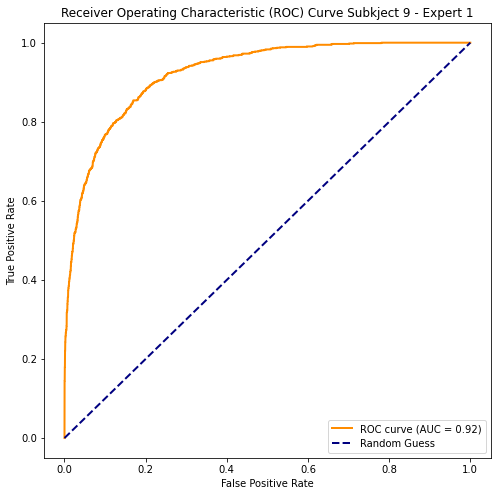

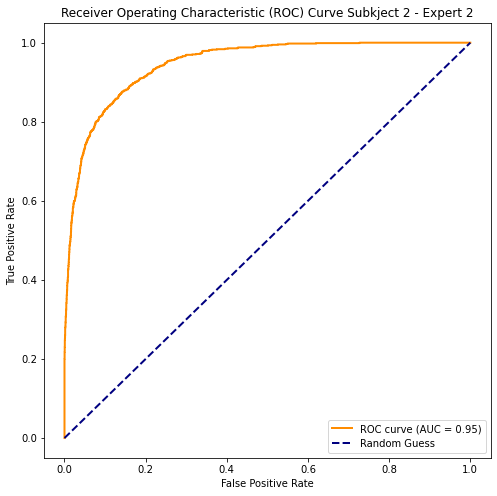

In [53]:
# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [0])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_0 [0].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 9 - Expert 1')
plt.legend(loc='lower right')
plt.show()

# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [1])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_1 [1].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 2 - Expert 2')
plt.legend(loc='lower right')
plt.show()

Matriz de confusión para los datos de prueba.

In [54]:
for i in range(len(X_test)):
    # roc_auc_test_0 = pp.calc_roc_acu(classifier_0, X_test[i], y_test_0[i])
    # roc_auc_test_1 = pp.calc_roc_acu(classifier_1, X_test[i], y_test_1[i])
    print(f"\nMatriz de Confusión para el Conjunto de Prueba - Sujeto {i + 1}:")
    cm_test_0 = pp.calculate_multilabel_confusion_matrix(classifier, X_test[i], y_test_0[i])
    cm_test_1 = pp.calculate_multilabel_confusion_matrix(classifier, X_test[i], y_test_1[i])
    print(f"Experto 1:\n{cm_test_0}")
    print(f"Experto 2:\n{cm_test_1}")


Matriz de Confusión para el Conjunto de Prueba - Sujeto 1:
Experto 1:
[[[799  18]
  [ 31  91]]

 [[771   1]
  [164   3]]

 [[495  82]
  [107 255]]

 [[654  60]
  [ 15 210]]

 [[857  19]
  [ 27  36]]]
Experto 2:
[[[799  18]
  [ 31  91]]

 [[771   1]
  [164   3]]

 [[495  82]
  [107 255]]

 [[654  60]
  [ 15 210]]

 [[857  19]
  [ 27  36]]]

Matriz de Confusión para el Conjunto de Prueba - Sujeto 2:
Experto 1:
[[[803   8]
  [ 15  85]]

 [[769   1]
  [135   6]]

 [[539  49]
  [108 215]]

 [[678  36]
  [ 37 160]]

 [[755   6]
  [ 48 102]]]
Experto 2:
[[[816  22]
  [  2  71]]

 [[803   2]
  [101   5]]

 [[535  54]
  [112 210]]

 [[645  23]
  [ 70 173]]

 [[740   4]
  [ 63 104]]]


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Obtener señales EEG para un sujeto específico (cambia el índice según se desee)
# Notar que en la ejecución teniamos el subject 9 y 2 como subjects de test
eeg_signals = pp.subject[9].getEEG()

# Obtener probabilidades de clase del clasificador
proba_predictions = classifier.predict_proba(X_test)  # Ajusta X_test según tus datos de prueba

# Definir umbrales para la clasificación de las cinco clases
thresholds = [0.5, 0.2, 0.4, 0.5] 
# bajamos el umbral para las clases más complicadas de predecir.

# Crear una figura y ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Graficar las señales EEG
for i, signal in enumerate(eeg_signals.columns):
    ax.plot(eeg_signals.index, eeg_signals[signal] + i * 100, label=f'EEG_{i + 1}')

# Clasificar probabilidades según umbrales
for i, proba_preds in enumerate(proba_predictions):
    for j, threshold in enumerate(thresholds):
        predicted_class = 1 if proba_preds[j] >= threshold else 0
        ax.plot([i, i + 1], [len(eeg_signals.columns) * 100 - (j + 1) * 50, len(eeg_signals.columns) * 100 - (j + 1) * 50], 
                color='red' if predicted_class == 1 else 'blue', alpha=0.5)

# Ajustar etiquetas y leyenda
ax.set_xlabel('Tiempo')
ax.set_ylabel('EEG Signals')
ax.legend()

# Mostrar la gráfica
plt.show()

**Opción (B)**. Entrenamiento con sólo un experto. Posteriormente, calculamos la curva ROC por experto y luego combiamos los resultados.

In [57]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc

# Definimos el modelo de Random Forest
classifier = OneVsRestClassifier(
     RandomForestClassifier(n_estimators = 1000,
                            criterion = "gini",
                            random_state = 0)
)

# Entrenamiento secuencialmente el modelo con los datos de cada sujeto
classifier.fit(combined_X, combined_y_0)

OneVsRestClassifier(estimator=RandomForestClassifier(n_estimators=1000,
                                                     random_state=0))

In [60]:
results_roc_auc_0 = pp.calc_result_roc_auc(classifier, combined_X, combined_y_0, 0)
results_roc_auc_1 = pp.calc_result_roc_auc(classifier, combined_X, combined_y_1, 1)

In [63]:
print ('results_roc_auc_0:',results_roc_auc_0)
print ('results_roc_auc_1:',results_roc_auc_1)

results_roc_auc_0: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}
results_roc_auc_1: {0: 0.9918585319159656, 1: 0.9002818508923046, 2: 0.9468489665496386, 3: 0.9839105850723702, 4: 0.9821365881536516}


In [ ]:
n_subjects = len(X_train)
n_classes  = len(y_train_0[0][0])

print('Datos para el experto 1')
for i in range(n_subjects):
    print('\t Subject ', str(i), ';')
    for j in range(n_classes):
         print('\t\t\t', str(j), ':', results_roc_auc_0[i][j]['roc_auc_train'])

print ('Datos para el experto 2')
for i in range (n_subjects):
    print('\t Subject ', str(i), ';')
    for j in range(n_classes):
        print('\t\t\t', str(j), ':', results_roc_auc_1[i][j]['roc_auc_train'])

Datos para el experto 1
	 Subject  0 ;
			 0 : 0.9830332922318124
			 1 : 0.7531822787141935
			 2 : 0.7932620416587688
			 3 : 0.9552282842070838
			 4 : 0.9527157249233464
	 Subject  1 ;
			 0 : 0.9949378151260504
			 1 : 0.5541295059084275
			 2 : 0.6540147730895951
			 3 : 0.9933705955471372
			 4 : 0.9794366012965037
	 Subject  2 ;
			 0 : 0.9781045302551418
			 1 : 0.817391304347826
			 2 : 0.7005660865627223
			 3 : 0.9796797683310842
			 4 : 0.917712631820266
	 Subject  3 ;
			 0 : 0.9849126344086022
			 1 : 0.7309223623092236
			 2 : 0.8950975649088856
			 3 : 0.9675762773532929
			 4 : 0.8620260468183317
	 Subject  4 ;
			 0 : 0.9720426203031765
			 1 : 0.7429840893703452
			 2 : 0.8807836803686273
			 3 : 0.9842302342997755
			 4 : 0.9298089606212856
	 Subject  5 ;
			 0 : 0.9915003501400561
			 1 : 0.9431292808219178
			 2 : 0.9384621053019416
			 3 : 0.9858329725048711
			 4 : 0.9942604639399772
Datos para el experto 2
	 Subject  0 ;
			 0 : 0.9929136561284206
			 1 : 0.81

Matriz de confusión para los datos de entrenamiento (con etiquetas de un experto).

In [64]:
# Datos para el experto 1
print('Datos para el experto 1')
for i in range(n_subjects):
    print('\tSubject', str(i), ';')
    cm_train_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_train[i], y_train_0[i])

    print(cm_train_0)

# Datos para el experto 2
print('Datos para el experto 2')
for i in range(n_subjects):
    print('\tSubject', str(i), ';')
    cm_train_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_train[i], y_train_1[i])
    print(cm_train_1)

Datos para el experto 1
	Subject 0 ;
[[[613   0]
  [  0 301]]

 [[844   0]
  [  0  70]]

 [[647   0]
  [  0 267]]

 [[719   0]
  [  0 195]]

 [[833   0]
  [  0  81]]]
	Subject 1 ;
[[[620   0]
  [  0 144]]

 [[627   0]
  [  0 137]]

 [[530   0]
  [  0 234]]

 [[605   0]
  [  0 159]]

 [[674   0]
  [  0  90]]]
	Subject 2 ;
[[[766   0]
  [  0  57]]

 [[690   0]
  [  0 133]]

 [[533   0]
  [  0 290]]

 [[576   0]
  [  0 247]]

 [[727   0]
  [  0  96]]]
	Subject 3 ;
[[[714   0]
  [  0  80]]

 [[730   0]
  [  0  64]]

 [[545   0]
  [  0 249]]

 [[496   0]
  [  0 298]]

 [[691   0]
  [  0 103]]]
	Subject 4 ;
[[[578   0]
  [  0 206]]

 [[721   0]
  [  0  63]]

 [[629   0]
  [  0 155]]

 [[522   0]
  [  0 262]]

 [[686   0]
  [  0  98]]]
	Subject 5 ;
[[[762   0]
  [  0 162]]

 [[810   0]
  [  0 114]]

 [[555   0]
  [  0 369]]

 [[746   0]
  [  0 178]]

 [[823   0]
  [  0 101]]]
Datos para el experto 2
	Subject 0 ;
[[[605  26]
  [  8 275]]

 [[784  27]
  [ 60  43]]

 [[589  39]
  [ 58 228]]

 [[

Combinamos las predicciones y comprobmos el auc y matriz de confusión:

In [ ]:
# mos los resultados
# combined_results = {}
# for i in range(n_subjects):
#     combined_results[i] = {}
#     for j in range(n_classes):
#         # Combinamos fpr, tpr, thresholds y roc_auc de results_0 y results_1
#         combined_results[i][j] = {
#             'fpr': np.concatenate((results_roc_auc_0[i][j]['fpr'], results_roc_auc_1[i][j]['fpr'])),
#             'tpr': np.concatenate((results_roc_auc_0[i][j]['tpr'], results_roc_auc_1[i][j]['tpr'])),
#             'thresholds': np.concatenate((results_roc_auc_0[i][j]['thresholds'], results_roc_auc_1[i][j]['thresholds'])),
#             'roc_auc_train': np.mean([results_roc_auc_0[i][j]['roc_auc_train'], results_roc_auc_1[i][j]['roc_auc_train']])
#         }

In [ ]:
# for i in range(n_subjects):
#     print('Subject ', str(i), ';')
#     for j in range(n_classes):
#         print('\t\t\t', combined_results[i][j]['roc_auc_train'])

Subject  0 ;
			 0.9879734741801165
			 0.7830542824486237
			 0.7986401636021649
			 0.9262384983293619
			 0.9478825550120563
Subject  1 ;
			 0.9949378151260504
			 0.5541295059084275
			 0.6540147730895951
			 0.9933705955471372
			 0.9794366012965037
Subject  2 ;
			 0.9793308743264135
			 0.7949041706479534
			 0.7090204368474791
			 0.9732877518062315
			 0.9138264165677057
Subject  3 ;
			 0.9816187295950599
			 0.707637205793323
			 0.8954412951405335
			 0.9701037797344232
			 0.8646494095202426
Subject  4 ;
			 0.9682918661706953
			 0.718214298165833
			 0.8437396866054085
			 0.9861535010788596
			 0.9297494625817124
Subject  5 ;
			 0.995750175070028
			 0.9715646404109589
			 0.9692310526509709
			 0.9929164862524356
			 0.9971302319699886


Validación.

In [66]:
# Evaluar el rendimiento en el primer sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [0], y_val_0 [0])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [0], y_val_1 [0])
print("Exactitud para el primer sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el primer sujeto y segundo Experto de validación:", roc_auc_val_1)

print ("")
# Realizar la predicción para el segundo sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [0], y_val_0 [0])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [0], y_val_1 [0])


print("Exactitud para el segundo sujeto y primer Exèrto de validación:", roc_auc_val_0)
print("Exactitud para el segundo sujeto  y segundo Exèrto de de validación:", roc_auc_val_1)

Exactitud para el primer sujeto y primer Experto de validación: {0: 0.9929254901960785, 1: 0.8497000500804484, 2: 0.9634459028589648, 3: 0.9972391574568117, 4: 0.9847828397191182}
Exactitud para el primer sujeto y segundo Experto de validación: {0: 0.9929254901960785, 1: 0.8497000500804484, 2: 0.9634459028589648, 3: 0.9972391574568117, 4: 0.9847828397191182}

Exactitud para el segundo sujeto y primer Exèrto de validación: {0: 0.9929254901960785, 1: 0.8497000500804484, 2: 0.9634459028589648, 3: 0.9972391574568117, 4: 0.9847828397191182}
Exactitud para el segundo sujeto  y segundo Exèrto de de validación: {0: 0.9929254901960785, 1: 0.8497000500804484, 2: 0.9634459028589648, 3: 0.9972391574568117, 4: 0.9847828397191182}


Matriz de confusión para los datos de validación.

In [67]:
for i in range(len(X_val)):
    #roc_auc_val_0 = pp.calc_roc_acu(clasificador, X_val[i], y_val_0[i])
    #roc_auc_val_1 = pp.calc_roc_acu(clasificador, X_val[i], y_val_1[i])

    print(f"\nMatriz de Confusión para el Conjunto de Validación - Sujeto {i + 1}:")
    cm_val_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_0[i])
    cm_val_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_1[i])

    print(f"Experto 1:\n{cm_val_0}")
    print(f"Experto 2:\n{cm_val_1}")


Matriz de Confusión para el Conjunto de Validación - Sujeto 1:
Experto 1:
[[[578  17]
  [ 12 363]]

 [[861   0]
  [109   0]]

 [[756  20]
  [ 75 119]]

 [[807  20]
  [  3 140]]

 [[811  10]
  [ 30 119]]]
Experto 2:
[[[578  17]
  [ 12 363]]

 [[861   0]
  [109   0]]

 [[756  20]
  [ 75 119]]

 [[807  20]
  [  3 140]]

 [[811  10]
  [ 30 119]]]

Matriz de Confusión para el Conjunto de Validación - Sujeto 2:
Experto 1:
[[[592  47]
  [  3 124]]

 [[547   0]
  [218   1]]

 [[572  21]
  [110  63]]

 [[638  16]
  [ 10 102]]

 [[610  21]
  [ 54  81]]]
Experto 2:
[[[592  47]
  [  3 124]]

 [[547   0]
  [218   1]]

 [[572  21]
  [110  63]]

 [[638  16]
  [ 10 102]]

 [[610  21]
  [ 54  81]]]


Conjunto de prueba.

In [68]:
# Evaluar el rendimiento en el primer sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [0], y_test_0 [0])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [0], y_test_1 [0])
print("Exactitud para el primer sujeto y primer Experto de Test:", roc_auc_test_0)
print("Exactitud para el primer sujeto y segundo Experto de Test:", roc_auc_test_1)

print ("")

# Realizar la predicción para el segundo sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [1], y_test_0 [1])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [1], y_test_1 [1])
print("Exactitud para el segundo sujeto y primer Experto de test:", roc_auc_test_0)
print("Exactitud para el segundo sujeto y segundo Experto de test:", roc_auc_test_1)

Exactitud para el primer sujeto y primer Experto de Test: {0: 0.9805114673836708, 1: 0.823260215320654, 2: 0.8875254938383905, 3: 0.9838530967942732, 4: 0.9535587446546351}
Exactitud para el primer sujeto y segundo Experto de Test: {0: 0.9805114673836708, 1: 0.823260215320654, 2: 0.8875254938383905, 3: 0.9838530967942732, 4: 0.9535587446546351}

Exactitud para el segundo sujeto y primer Experto de test: {0: 0.9889457459926019, 1: 0.8662798194713088, 2: 0.9110275689223057, 3: 0.9678937564873665, 4: 0.9785501533070522}
Exactitud para el segundo sujeto y segundo Experto de test: {0: 0.9941968810278876, 1: 0.8822805578342905, 2: 0.907538833057398, 3: 0.9315350779921637, 4: 0.9721242997875218}


Matriz de confusión par los datos del conjunto de prueba.

In [69]:
for i in range(len(X_test)):
    # roc_auc_test_0 = pp.calc_roc_acu(clasificador, X_test[i], y_test_0[i])
    # roc_auc_test_1 = pp.calc_roc_acu(clasificador, X_test[i], y_test_1[i])
    print(f"\nMatriz de Confusión para el Conjunto de Prueba - Sujeto {i + 1}:")
    cm_test_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_0[i])
    cm_test_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_1[i])

    print(f"Experto 1:\n{cm_test_0}")
    print(f"Experto 2:\n{cm_test_1}")


Matriz de Confusión para el Conjunto de Prueba - Sujeto 1:
Experto 1:
[[[798  19]
  [ 30  92]]

 [[771   1]
  [166   1]]

 [[513  64]
  [150 212]]

 [[631  83]
  [  7 218]]

 [[862  14]
  [ 29  34]]]
Experto 2:
[[[798  19]
  [ 30  92]]

 [[771   1]
  [166   1]]

 [[513  64]
  [150 212]]

 [[631  83]
  [  7 218]]

 [[862  14]
  [ 29  34]]]

Matriz de Confusión para el Conjunto de Prueba - Sujeto 2:
Experto 1:
[[[796  15]
  [ 14  86]]

 [[770   0]
  [138   3]]

 [[540  48]
  [114 209]]

 [[677  37]
  [ 35 162]]

 [[759   2]
  [ 56  94]]]
Experto 2:
[[[807  31]
  [  3  70]]

 [[805   0]
  [103   3]]

 [[536  53]
  [118 204]]

 [[643  25]
  [ 69 174]]

 [[744   0]
  [ 71  96]]]


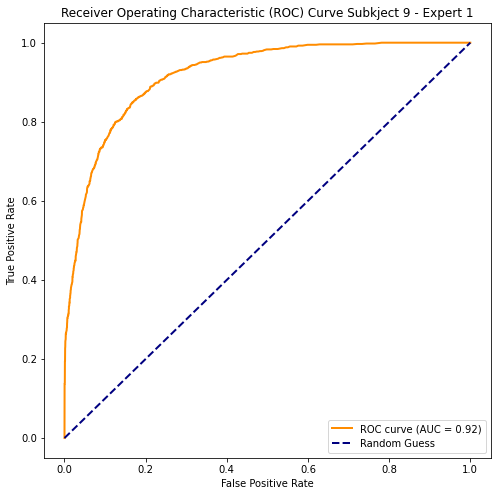

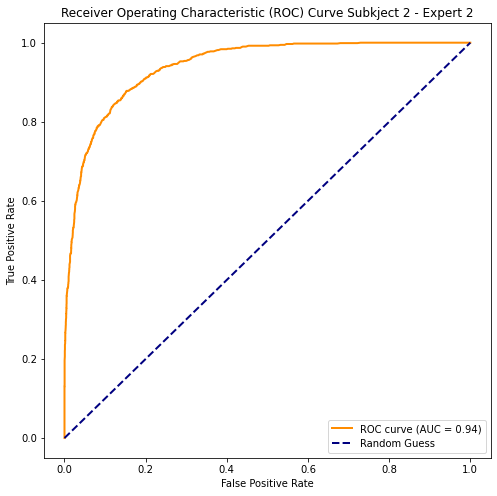

In [70]:
# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [0])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_0 [0].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 9 - Expert 1')
plt.legend(loc='lower right')
plt.show()

# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [1])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_1 [1].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 2 - Expert 2')
plt.legend(loc='lower right')
plt.show()

- Entrenamiento de un sujeto sólo y etiquetas de un solo experto.

In [71]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc

n_classes = 5
classifier = OneVsRestClassifier (
     RandomForestClassifier(n_estimators = 1000,
                            criterion = "gini",
                            random_state = 0)
)

classifier.fit(X_train[0], y_train_0 [0])

rf = []
rf.append(classifier)
y_score_train = classifier.predict_proba(X_train[0])
fpr = dict()
tpr = dict()
thresholds    = dict()
roc_auc_train = dict()
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_train_0[0][:, i], y_score_train [:, i])
    roc_auc_train[i] = auc (fpr[i], tpr[i])

In [72]:
roc_auc_train # Con 1 sujeto y los datos de prueba. Con la matriz de características normalizada.

{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}

- Validación de un sujeto sólo y etiquetas de un sólo experto.

In [73]:
# Evaluamos el rendimiento en el primer sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu(classifier, X_val[0], y_val_0[0])
roc_auc_val_1 =  pp.calc_roc_acu(classifier, X_val[0], y_val_1[0])
print("Exactitud para el primer sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el primer sujeto y segundo Experto de validación:", roc_auc_val_1)
print ("")

# Realizamos la predicción para el segundo sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu(classifier, X_val[0], y_val_0[0])
roc_auc_val_1 =  pp.calc_roc_acu(classifier, X_val[0], y_val_1[0])
print("Exactitud para el segundo sujeto y primer Exèrto de validación:", roc_auc_val_0)
print("Exactitud para el segundo sujeto  y segundo Exèrto de de validación:", roc_auc_val_1)

Exactitud para el primer sujeto y primer Experto de validación: {0: 0.9797803921568627, 1: 0.5732719581455317, 2: 0.9415287224997343, 3: 0.9963386069794775, 4: 0.9721284405169666}
Exactitud para el primer sujeto y segundo Experto de validación: {0: 0.9797803921568627, 1: 0.5732719581455317, 2: 0.9415287224997343, 3: 0.9963386069794775, 4: 0.9721284405169666}

Exactitud para el segundo sujeto y primer Exèrto de validación: {0: 0.9797803921568627, 1: 0.5732719581455317, 2: 0.9415287224997343, 3: 0.9963386069794775, 4: 0.9721284405169666}
Exactitud para el segundo sujeto  y segundo Exèrto de de validación: {0: 0.9797803921568627, 1: 0.5732719581455317, 2: 0.9415287224997343, 3: 0.9963386069794775, 4: 0.9721284405169666}


Matriz de confusión para los datos de validación.

In [74]:
for i in range(len(X_val)):
    # roc_auc_val_0 = pp.calc_roc_acu(clasificador, X_val[i], y_val_0[i])
    # roc_auc_val_1 = pp.calc_roc_acu(clasificador, X_val[i], y_val_1[i])
    print(f"\nMatriz de Confusión para el Conjunto de Validación - Sujeto {i + 1}:")
    cm_val_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_0[i])
    cm_val_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_1[i])
    
    print(f"Experto 1:\n{cm_val_0}")
    print(f"Experto 2:\n{cm_val_1}")


Matriz de Confusión para el Conjunto de Validación - Sujeto 1:
Experto 1:
[[[560  35]
  [  9 366]]

 [[861   0]
  [109   0]]

 [[747  29]
  [ 70 124]]

 [[811  16]
  [  5 138]]

 [[815   6]
  [ 61  88]]]
Experto 2:
[[[560  35]
  [  9 366]]

 [[861   0]
  [109   0]]

 [[747  29]
  [ 70 124]]

 [[811  16]
  [  5 138]]

 [[815   6]
  [ 61  88]]]

Matriz de Confusión para el Conjunto de Validación - Sujeto 2:
Experto 1:
[[[551  88]
  [  1 126]]

 [[547   0]
  [219   0]]

 [[562  31]
  [101  72]]

 [[651   3]
  [ 18  94]]

 [[620  11]
  [ 64  71]]]
Experto 2:
[[[551  88]
  [  1 126]]

 [[547   0]
  [219   0]]

 [[562  31]
  [101  72]]

 [[651   3]
  [ 18  94]]

 [[620  11]
  [ 64  71]]]


- Conjunto de prueba de un sujeto sólo y etiquetas de un sólo experto.

In [75]:
# Evaluamos el rendimiento en el primer sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu(classifier, X_test[0], y_test_0[0])
roc_auc_test_1 =  pp.calc_roc_acu(classifier, X_test[0], y_test_1[0])
print("Exactitud para el primer sujeto y primer Experto de Test:", roc_auc_test_0)
print("Exactitud para el primer sujeto y segundo Experto de Test:", roc_auc_test_1)
print ("")

# Realizamos la predicción para el segundo sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu(classifier, X_test[1], y_test_0[1])
roc_auc_test_1 =  pp.calc_roc_acu(classifier, X_test[1], y_test_1[1])
print("Exactitud para el segundo sujeto y primer Experto de test:", roc_auc_test_0)
print("Exactitud para el segundo sujeto y segundo Experto de test:", roc_auc_test_1)

Exactitud para el primer sujeto y primer Experto de Test: {0: 0.9649808375303489, 1: 0.7333855604852471, 2: 0.8617300382048507, 3: 0.9614005602240896, 4: 0.9482224396607958}
Exactitud para el primer sujeto y segundo Experto de Test: {0: 0.9649808375303489, 1: 0.7333855604852471, 2: 0.8617300382048507, 3: 0.9614005602240896, 4: 0.9482224396607958}

Exactitud para el segundo sujeto y primer Experto de test: {0: 0.9854315659679409, 1: 0.7908722483190569, 2: 0.8416498178218655, 3: 0.9519046197159066, 4: 0.9757117827420061}
Exactitud para el segundo sujeto y segundo Experto de test: {0: 0.9838166541341093, 1: 0.7973924762686042, 2: 0.8493604277172595, 3: 0.9183669697641752, 4: 0.9619873156911982}


Matriz de confusión para los datos de prueba.

In [76]:
for i in range(len(X_test)):
    # roc_auc_test_0 = pp.calc_roc_acu(clasificador, X_test[i], y_test_0[i])
    # roc_auc_test_1 = pp.calc_roc_acu(clasificador, X_test[i], y_test_1[i])
    print(f"\nMatriz de Confusión para el Conjunto de Prueba - Sujeto {i + 1}:")
    cm_test_0 =  pp.calculate_multilabel_confusion_matrix(classifier, X_test[i], y_test_0[i])
    cm_test_1 =  pp.calculate_multilabel_confusion_matrix(classifier, X_test[i], y_test_1[i])

    print(f"Experto 1:\n{cm_test_0}")
    print(f"Experto 2:\n{cm_test_1}")


Matriz de Confusión para el Conjunto de Prueba - Sujeto 1:
Experto 1:
[[[758  59]
  [ 12 110]]

 [[772   0]
  [167   0]]

 [[553  24]
  [222 140]]

 [[659  55]
  [ 18 207]]

 [[874   2]
  [ 45  18]]]
Experto 2:
[[[758  59]
  [ 12 110]]

 [[772   0]
  [167   0]]

 [[553  24]
  [222 140]]

 [[659  55]
  [ 18 207]]

 [[874   2]
  [ 45  18]]]

Matriz de Confusión para el Conjunto de Prueba - Sujeto 2:
Experto 1:
[[[739  72]
  [  3  97]]

 [[770   0]
  [141   0]]

 [[558  30]
  [214 109]]

 [[709   5]
  [ 98  99]]

 [[760   1]
  [ 86  64]]]
Experto 2:
[[[742  96]
  [  0  73]]

 [[805   0]
  [106   0]]

 [[557  32]
  [215 107]]

 [[665   3]
  [142 101]]

 [[744   0]
  [102  65]]]


- Generación del modelo con la matriz de características generadas por la función del API `yasa` (`yasa.SleepStaging(raw, eeg_name ='C4-A1' ,  eog_name='LOC-A2', emg_name='X1') (features_2_norm)`).

In [77]:
from sklearn.preprocessing import label_binarize

def binarize_y(vec):
    return label_binarize(vec, classes = [0, 1, 2, 3, 4])

X_train = [sub.get_yasa_optim_features().values for sub in X_train_o]
X_val   = [sub.get_yasa_optim_features().values for sub in X_val_o]
X_test  = [sub.get_yasa_optim_features().values for sub in X_test_o]


y_train_0 = [binarize_y(sub.get_labels()[0]) for sub in X_train_o]
y_train_1 = [binarize_y(sub.get_labels()[1]) for sub in X_train_o]

y_val_0 = [binarize_y(sub.get_labels()[0]) for sub in X_val_o]
y_val_1 = [binarize_y(sub.get_labels()[1]) for sub in X_val_o]

y_test_0 = [binarize_y(sub.get_labels()[0]) for sub in X_test_o]
y_test_1 = [binarize_y(sub.get_labels()[1]) for sub in X_test_o]

- Entrenamiento del modelo combinando los sujetos y sus etiquetas y realizando un único entrenamiento.

In [78]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc

# Combinamos las características y etiquetas de los seis sujetos en una sola estructura
combined_X   = []
combined_y_0 = []
combined_y_1 = []

for i in range(6):
    combined_X.extend(X_train[i])
    combined_y_0.extend(y_train_0[i])
    combined_y_1.extend(y_train_1[i])

combined_X   = np.array(combined_X)
combined_y_0 = np.array(combined_y_0)
combined_y_1 = np.array(combined_y_1)

combined_x_all = np.concatenate([combined_X, combined_X])
combined_y_all = np.concatenate([combined_y_0, combined_y_1])

classifier = OneVsRestClassifier(
     RandomForestClassifier(n_estimators = 1000,
                            criterion = "gini",
                            random_state = 0)
)
classifier.fit(combined_x_all, combined_y_all)

OneVsRestClassifier(estimator=RandomForestClassifier(n_estimators=1000,
                                                     random_state=0))

In [ ]:
from sklearn.inspection import permutation_importance

for i in range (len(X_test)):
    for j in range (len(y_test_0)):
        # Calcular la importancia de la permutación
        result = permutation_importance(classifier, X_test [i], y_test_0 [j], n_repeats = 2, random_state = 42)

        # Obtener las importancias
        importances = result.importances_mean

        # Obtener índices ordenados por importancia
        indices = importances.argsort()[::-1]
        print (f'Las 30 features más importantes para el subject {i} del Experto 1:')
        # Imprimir las características ordenadas por importancia
        for f in range(X_test[i].shape [1]):
            print(f"\t\t{X_test[i].columns[indices[f]]}: {importances[indices[f]]}")
# Como tarda bastante, la traza que saccamos es bajo el subject 0 y experto 1 . no se hace el for... 
# si se desea para los dos subjects hay que esperar bastante y consumir muchisimos recursos ciputacionales...

In [ ]:
from sklearn.inspection import permutation_importance
for i in range (len(X_test)):
    for j in range (len(y_test_0)):

        # Calcular la importancia de la permutación
        result = permutation_importance(classifier, X_test [i], y_test_1 [j], n_repeats = 30, random_state = 42)

        # Obtener las importancias
        importances = result.importances_mean

        # Obtener índices ordenados por importancia
        indices = importances.argsort()[::-1]
        print (f' Las 30 features más importantes para el subject {i} del Experto 2:)
        # Imprimir las características ordenadas por importancia
        for f in range(X_test[i] .shape[1]):
            print(f"{X_test[i].columns[indices[f]]}: {importances[indices[f]]}")

In [81]:
pp.calc_roc_acu (classifier, combined_x_all, combined_y_all)

{0: 0.9992726157134799,
 1: 0.9881299416149647,
 2: 0.9924173893957494,
 3: 0.9981082199322366,
 4: 0.9985678162262597}

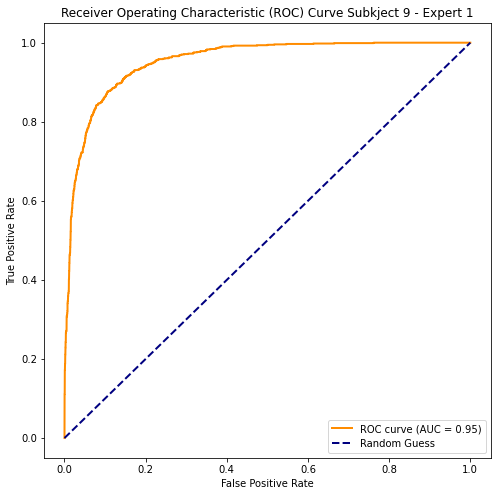

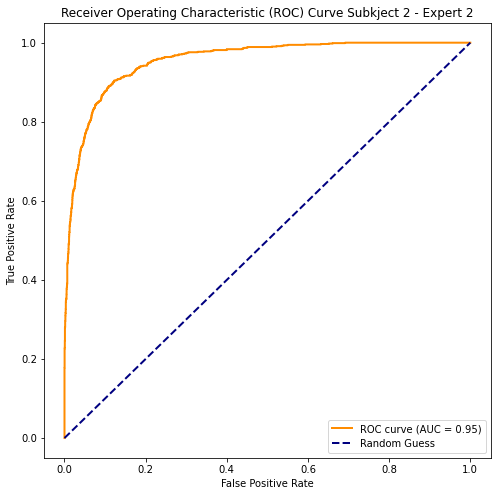

In [82]:
# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [0])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_0 [0].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 9 - Expert 1')
plt.legend(loc='lower right')
plt.show()

# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [1])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_1 [1].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 2 - Expert 2')
plt.legend(loc='lower right')
plt.show()

Matriz de confusión para los datos de entrenamiento.

In [83]:
cm_entrenamiento = pp.calculate_multilabel_confusion_matrix (classifier, combined_x_all, combined_y_all)
print("Matriz de Confusión para el Conjunto de Entrenamiento:")
print(cm_entrenamiento)

Matriz de Confusión para el Conjunto de Entrenamiento:
[[[8125   68]
  [  79 1734]]

 [[8857   71]
  [ 407  671]]

 [[6438  275]
  [ 304 2989]]

 [[7326  107]
  [ 162 2411]]

 [[8653  104]
  [  73 1176]]]


Validación.

In [85]:
# Evaluar el rendimiento en el primer sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [0], y_val_0 [0])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [0], y_val_1 [0])
print("Exactitud para el primer sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el primer sujeto y segundo Experto de validación:", roc_auc_val_1)

print ("")
# Realizar la predicción para el segundo sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [1], y_val_0 [1])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [1], y_val_1 [1])


print("Exactitud para el segundo sujeto y primer Experto  de validación:", roc_auc_val_0)
print("Exactitud para el segundo sujeto  y segundo Experto de validación:", roc_auc_val_1)

Exactitud para el primer sujeto y primer Experto de validación: {0: 0.9925557422969187, 1: 0.8440260418331577, 2: 0.9458165054734828, 3: 0.9985540457124495, 4: 0.99664020796377}
Exactitud para el primer sujeto y segundo Experto de validación: {0: 0.9925557422969187, 1: 0.8440260418331577, 2: 0.9458165054734828, 3: 0.9985540457124495, 4: 0.99664020796377}

Exactitud para el segundo sujeto y primer Experto  de validación: {0: 0.9660024891254791, 1: 0.89774444249664, 2: 0.8902416438409576, 3: 0.9976381607688947, 4: 0.9803603920878089}
Exactitud para el segundo sujeto  y segundo Experto de validación: {0: 0.9660024891254791, 1: 0.89774444249664, 2: 0.8902416438409576, 3: 0.9976381607688947, 4: 0.9803603920878089}


Matriz de confusión para los datos de validación:

In [86]:
for i in range(len(X_val)):
    #roc_auc_val_0 = pp.calc_roc_acu(clasificador, X_val[i], y_val_0[i])
    #roc_auc_val_1 = pp.calc_roc_acu(clasificador, X_val[i], y_val_1[i])

    print(f"\nMatriz de Confusión para el Conjunto de Validación - Sujeto {i + 1}:")
    cm_val_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_0[i])
    cm_val_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_1[i])

    print(f"Experto 1:\n{cm_val_0}")
    print(f"Experto 2:\n{cm_val_1}")


Matriz de Confusión para el Conjunto de Validación - Sujeto 1:
Experto 1:
[[[577  18]
  [ 37 338]]

 [[861   0]
  [107   2]]

 [[703  73]
  [ 39 155]]

 [[812  15]
  [  2 141]]

 [[812   9]
  [ 13 136]]]
Experto 2:
[[[577  18]
  [ 37 338]]

 [[861   0]
  [107   2]]

 [[703  73]
  [ 39 155]]

 [[812  15]
  [  2 141]]

 [[812   9]
  [ 13 136]]]

Matriz de Confusión para el Conjunto de Validación - Sujeto 2:
Experto 1:
[[[570  69]
  [ 12 115]]

 [[546   1]
  [191  28]]

 [[562  31]
  [ 89  84]]

 [[650   4]
  [  9 103]]

 [[631   0]
  [ 83  52]]]
Experto 2:
[[[570  69]
  [ 12 115]]

 [[546   1]
  [191  28]]

 [[562  31]
  [ 89  84]]

 [[650   4]
  [  9 103]]

 [[631   0]
  [ 83  52]]]


Test.

In [87]:
# Evaluar el rendimiento en el primer sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [0], y_test_0 [0])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [0], y_test_1 [0])
print("Exactitud para el primer sujeto y primer Experto de Test:", roc_auc_test_0)
print("Exactitud para el primer sujeto y segundo Experto de Test:", roc_auc_test_1)

print ("")

# Realizar la predicción para el segundo sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [1], y_test_0 [1])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [1], y_test_1 [1])
print("Exactitud para el segundo sujeto y primer Experto de test:", roc_auc_test_0)
print("Exactitud para el segundo sujeto y segundo Experto de test:", roc_auc_test_1)

Exactitud para el primer sujeto y primer Experto de Test: {0: 0.9730421173024059, 1: 0.8654982780552883, 2: 0.9304461062650211, 3: 0.9899844382197324, 4: 0.9862832499818802}
Exactitud para el primer sujeto y segundo Experto de Test: {0: 0.9730421173024059, 1: 0.8654982780552883, 2: 0.9304461062650211, 3: 0.9899844382197324, 4: 0.9862832499818802}

Exactitud para el segundo sujeto y primer Experto de test: {0: 0.9858199753390876, 1: 0.8600027631942525, 2: 0.93078283945157, 3: 0.9895562285828037, 4: 0.9890757774857644}
Exactitud para el segundo sujeto y segundo Experto de test: {0: 0.9946055513780365, 1: 0.9080042189148012, 2: 0.9227715150428667, 3: 0.9681501195140583, 4: 0.9899756937737428}


Matriz de confusión para los datos de prueba.

In [88]:
for i in range(len(X_test)):
    #roc_auc_test_0 = pp.calc_roc_acu(clasificador, X_test[i], y_test_0[i])
    #roc_auc_test_1 = pp.calc_roc_acu(clasificador, X_test[i], y_test_1[i])

    print(f"\nMatriz de Confusión para el Conjunto de Prueba - Sujeto {i + 1}:")
    cm_test_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_0[i])
    cm_test_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_1[i])

    print(f"Experto 1:\n{cm_test_0}")
    print(f"Experto 2:\n{cm_test_1}")


Matriz de Confusión para el Conjunto de Prueba - Sujeto 1:
Experto 1:
[[[795  22]
  [ 38  84]]

 [[770   2]
  [159   8]]

 [[481  96]
  [ 28 334]]

 [[704  10]
  [ 37 188]]

 [[861  15]
  [ 12  51]]]
Experto 2:
[[[795  22]
  [ 38  84]]

 [[770   2]
  [159   8]]

 [[481  96]
  [ 28 334]]

 [[704  10]
  [ 37 188]]

 [[861  15]
  [ 12  51]]]

Matriz de Confusión para el Conjunto de Prueba - Sujeto 2:
Experto 1:
[[[791  20]
  [ 11  89]]

 [[770   0]
  [138   3]]

 [[526  62]
  [ 62 261]]

 [[708   6]
  [ 28 169]]

 [[751  10]
  [ 41 109]]]
Experto 2:
[[[800  38]
  [  2  71]]

 [[804   1]
  [104   2]]

 [[522  67]
  [ 66 256]]

 [[666   2]
  [ 70 173]]

 [[740   4]
  [ 52 115]]]


- Entrenamiento con solo un experto. Posteriormente, calculamos la curva ROC por experto y combiamos los resultados.

In [89]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc

# Definimos el modelo de Random Forest
classifier = OneVsRestClassifier(
     RandomForestClassifier(n_estimators = 1000,
                            criterion = "gini",
                            random_state = 0)
)

# Entrenamos secuencialmente el modelo con los datos de cada sujeto
classifier.fit(combined_X, combined_y_0)

OneVsRestClassifier(estimator=RandomForestClassifier(n_estimators=1000,
                                                     random_state=0))

In [90]:
results_roc_auc_0 = pp.calc_roc_acu (classifier, combined_X, combined_y_0)
results_roc_auc_1 = pp.calc_roc_acu (classifier, combined_X, combined_y_1)
print ('results_roc_auc_0:',results_roc_auc_0)
print ('results_roc_auc_1:',results_roc_auc_1)

results_roc_auc_0: {0: 1.0, 1: 0.9999999999999999, 2: 1.0, 3: 1.0, 4: 1.0000000000000002}
results_roc_auc_1: {0: 0.9934025503663773, 1: 0.9107088156993448, 2: 0.9524624492955522, 3: 0.9892074644599185, 4: 0.9933002000244928}


In [92]:
# Datos para el experto 1
print('Datos para el experto 1')
for i in range(n_subjects):
    print('\tSubject', str(i), ';')
    cm_train_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_train[i], y_train_0[i])

    print(cm_train_0)

# Datos para el experto 2
print('Datos para el experto 2')
for i in range(n_subjects):
    print('\tSubject', str(i), ';')
    cm_train_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_train[i], y_train_1[i])
    print(cm_train_1)

Datos para el experto 1
	Subject 0 ;
[[[613   0]
  [  0 301]]

 [[844   0]
  [  0  70]]

 [[647   0]
  [  0 267]]

 [[719   0]
  [  0 195]]

 [[833   0]
  [  0  81]]]
	Subject 1 ;
[[[620   0]
  [  0 144]]

 [[627   0]
  [  0 137]]

 [[530   0]
  [  0 234]]

 [[605   0]
  [  0 159]]

 [[674   0]
  [  0  90]]]
	Subject 2 ;
[[[766   0]
  [  0  57]]

 [[690   0]
  [  0 133]]

 [[533   0]
  [  0 290]]

 [[576   0]
  [  0 247]]

 [[727   0]
  [  0  96]]]
	Subject 3 ;
[[[714   0]
  [  0  80]]

 [[730   0]
  [  0  64]]

 [[545   0]
  [  0 249]]

 [[496   0]
  [  0 298]]

 [[691   0]
  [  0 103]]]
	Subject 4 ;
[[[578   0]
  [  0 206]]

 [[721   0]
  [  0  63]]

 [[629   0]
  [  0 155]]

 [[522   0]
  [  0 262]]

 [[686   0]
  [  0  98]]]
	Subject 5 ;
[[[762   0]
  [  0 162]]

 [[810   0]
  [  0 114]]

 [[555   0]
  [  0 369]]

 [[746   0]
  [  0 178]]

 [[823   0]
  [  0 101]]]
Datos para el experto 2
	Subject 0 ;
[[[605  26]
  [  8 275]]

 [[784  27]
  [ 60  43]]

 [[589  39]
  [ 58 228]]

 [[

- Validación

In [93]:
# Evaluar el rendimiento en el primer sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [0], y_val_0 [0])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [0], y_val_1 [0])
print("Exactitud para el primer sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el primer sujeto y segundo Experto de validación:", roc_auc_val_1)

print ("")
# Realizar la predicción para el segundo sujeto de validación
roc_auc_val_0 =  pp.calc_roc_acu (classifier, X_val [1], y_val_0 [1])
roc_auc_val_1 =  pp.calc_roc_acu (classifier, X_val [1], y_val_1 [1])


print("Exactitud para el segundo sujeto y primer Experto de validación:", roc_auc_val_0)
print("Exactitud para el segundo sujeto  y segundo Experto de validación:", roc_auc_val_1)

Exactitud para el primer sujeto y primer Experto de validación: {0: 0.9924907563025209, 1: 0.8269667231403638, 2: 0.9323387182484855, 3: 0.9981819872992788, 4: 0.9974781123037055}
Exactitud para el primer sujeto y segundo Experto de validación: {0: 0.9924907563025209, 1: 0.8269667231403638, 2: 0.9323387182484855, 3: 0.9981819872992788, 4: 0.9974781123037055}

Exactitud para el segundo sujeto y primer Experto de validación: {0: 0.9646408635540276, 1: 0.894355262828379, 2: 0.8978691672596477, 3: 0.997924858016601, 4: 0.9834653988378236}
Exactitud para el segundo sujeto  y segundo Experto de validación: {0: 0.9646408635540276, 1: 0.894355262828379, 2: 0.8978691672596477, 3: 0.997924858016601, 4: 0.9834653988378236}


Matriz de confusión para los datos de validación:

In [94]:
for i in range(len(X_val)):
    #roc_auc_val_0 = pp.calc_roc_acu(clasificador, X_val[i], y_val_0[i])
    #roc_auc_val_1 = pp.calc_roc_acu(clasificador, X_val[i], y_val_1[i])

    print(f"\nMatriz de Confusión para el Conjunto de Validación - Sujeto {i + 1}:")
    cm_val_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_0[i])
    cm_val_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_val[i], y_val_1[i])

    print(f"Experto 1:\n{cm_val_0}")
    print(f"Experto 2:\n{cm_val_1}")


Matriz de Confusión para el Conjunto de Validación - Sujeto 1:
Experto 1:
[[[577  18]
  [ 35 340]]

 [[861   0]
  [108   1]]

 [[705  71]
  [ 52 142]]

 [[787  40]
  [  0 143]]

 [[813   8]
  [ 12 137]]]
Experto 2:
[[[577  18]
  [ 35 340]]

 [[861   0]
  [108   1]]

 [[705  71]
  [ 52 142]]

 [[787  40]
  [  0 143]]

 [[813   8]
  [ 12 137]]]

Matriz de Confusión para el Conjunto de Validación - Sujeto 2:
Experto 1:
[[[561  78]
  [ 11 116]]

 [[547   0]
  [213   6]]

 [[568  25]
  [ 89  84]]

 [[648   6]
  [  4 108]]

 [[631   0]
  [ 86  49]]]
Experto 2:
[[[561  78]
  [ 11 116]]

 [[547   0]
  [213   6]]

 [[568  25]
  [ 89  84]]

 [[648   6]
  [  4 108]]

 [[631   0]
  [ 86  49]]]


Conjunto de prueba.

In [95]:
# Evaluar el rendimiento en el primer sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [0], y_test_0 [0])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [0], y_test_1 [0])
print("Exactitud para el primer sujeto y primer Experto de Test:", roc_auc_test_0)
print("Exactitud para el primer sujeto y segundo Experto de Test:", roc_auc_test_1)

print ("")

# Realizar la predicción para el segundo sujeto de test
roc_auc_test_0 =  pp.calc_roc_acu (classifier, X_test [1], y_test_0 [1])
roc_auc_test_1 =  pp.calc_roc_acu (classifier, X_test [1], y_test_1 [1])
print("Exactitud para el segundo sujeto y primer Experto de test:", roc_auc_test_0)
print("Exactitud para el segundo sujeto y segundo Experto de test:", roc_auc_test_1)

Exactitud para el primer sujeto y primer Experto de Test: {0: 0.9725053674980436, 1: 0.8525759362104804, 2: 0.9190181640606297, 3: 0.9899719887955183, 4: 0.9882673769660071}
Exactitud para el primer sujeto y segundo Experto de Test: {0: 0.9725053674980436, 1: 0.8525759362104804, 2: 0.9190181640606297, 3: 0.9899719887955183, 4: 0.9882673769660071}

Exactitud para el segundo sujeto y primer Experto de test: {0: 0.9853884093711467, 1: 0.8443768996960486, 2: 0.9294902171394874, 3: 0.9870217122381948, 4: 0.9888961892247043}
Exactitud para el segundo sujeto y segundo Experto de test: {0: 0.9938372511197568, 1: 0.8829426930739482, 2: 0.9217011673644139, 3: 0.9582440058155294, 4: 0.9906598094134311}


Matriz de confusión para los datos de prueba.

In [96]:
for i in range(len(X_test)):
    #roc_auc_test_0 = pp.calc_roc_acu(clasificador, X_test[i], y_test_0[i])
    #roc_auc_test_1 = pp.calc_roc_acu(clasificador, X_test[i], y_test_1[i])

    print(f"\nMatriz de Confusión para el Conjunto de test - Sujeto {i + 1}:")
    cm_test_0 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_0[i])
    cm_test_1 =  pp.calculate_multilabel_confusion_matrix (classifier, X_test[i], y_test_1[i])

    print(f"Experto 1:\n{cm_test_0}")
    print(f"Experto 2:\n{cm_test_1}")


Matriz de Confusión para el Conjunto de test - Sujeto 1:
Experto 1:
[[[792  25]
  [ 32  90]]

 [[771   1]
  [161   6]]

 [[483  94]
  [ 29 333]]

 [[704  10]
  [ 31 194]]

 [[861  15]
  [ 15  48]]]
Experto 2:
[[[792  25]
  [ 32  90]]

 [[771   1]
  [161   6]]

 [[483  94]
  [ 29 333]]

 [[704  10]
  [ 31 194]]

 [[861  15]
  [ 15  48]]]

Matriz de Confusión para el Conjunto de test - Sujeto 2:
Experto 1:
[[[787  24]
  [ 11  89]]

 [[770   0]
  [141   0]]

 [[528  60]
  [ 64 259]]

 [[701  13]
  [ 33 164]]

 [[755   6]
  [ 45 105]]]
Experto 2:
[[[796  42]
  [  2  71]]

 [[805   0]
  [106   0]]

 [[521  68]
  [ 71 251]]

 [[661   7]
  [ 73 170]]

 [[742   2]
  [ 58 109]]]


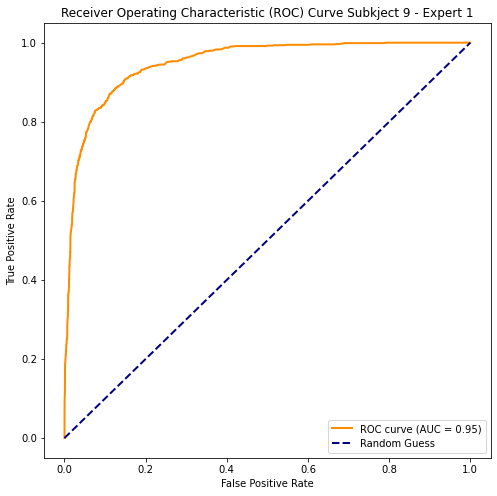

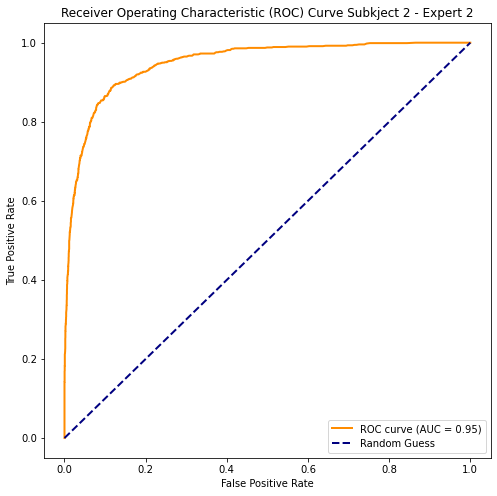

In [97]:
# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [0])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_0 [0].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 9 - Expert 1')
plt.legend(loc='lower right')
plt.show()

# Calcula las probabilidades de las predicciones en el conjunto de prueba
y_prob = classifier.predict_proba(X_test [1])

# Calcula la curva ROC
fpr, tpr, _ = roc_curve(y_test_1 [1].ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Subkject 2 - Expert 2')
plt.legend(loc='lower right')
plt.show()

# 10. Análisis de resultados

En la evaluación de nuestro modelo para la identificación de etapas del sueño, se han empleado dos estrategias de entrenamiento con diferentes conjuntos de características, así como la división de datos en conjuntos de entrenamiento, validación y prueba utilizando la estrategia hold-out. Se destacan dos estrategias de entrenamiento: una que utiliza las etiquetas de dos expertos y otra que utiliza solo las etiquetas de un experto. Además, se ha empleado la librería YASA para extraer características relevantes.

En base a los resultados anteirores, utilizando las etiquetas de dos expertos, se muestra un rendimiento impresionante en la métrica del área bajo la curva (AUC) en el conjunto de entrenamiento y validación. Sin embargo, al analizar las matrices de confusión y métricas específicas como sensibilidad y especificidad, se revelan aspectos importantes.

Se destaca que el modelo presenta una alta especificidad en la fase N1, indicando que es efectivo para predecir correctamente esta etapa del sueño. Sin embargo, la sensibilidad en la fase N2 disminuye, lo que sugiere que el modelo tiene dificultades para predecir esta etapa, pero mantiene una alta especificidad en otras fases. Se resalta que, en el contexto del sueño, una baja sensibilidad en la fase N2 puede no ser crítica para la salud del sujeto, ya que esta etapa corresponde a un sueño ligero.

El análisis de la estrategia de utilizar solo las etiquetas de un experto muestra resultados más desafiantes, especialmente en la predicción de la fase N2 y REM. Las métricas de sensibilidad y AUC disminuyen en comparación con la estrategia anterior. Se observa que la sensibilidad en la fase N2 disminuye aún más, lo que puede deberse a las variaciones en las predicciones de los expertos utilizados para el entrenamiento.

La evaluación con la librería YASA muestra resultados comparables, aunque ligeramente mejores en algunas métricas. Sin embargo, se destaca que la sensibilidad puede variar según el sujeto, y el modelo puede tener dificultades, especialmente en la fase N2.

Finalmente, se identifica al Subject 8 como el más desafiante de predecir, con bajos niveles de sensibilidad en varias etapas del sueño. Se resalta la importancia de mantener una alta especificidad para garantizar que, cuando el modelo predice una etapa, sea altamente probable que sea correcta.

En resumen, el modelo demuestra ser eficaz en la identificación de ciertas etapas del sueño, con fortalezas en la fase N1 y limitaciones en la sensibilidad de la fase N2. Se reconoce la importancia de mantener una alta especificidad, especialmente en el contexto de la clasificación del sueño, donde algunas etapas pueden no tener un impacto crítico en la salud.

## 10.1. Visión clínica de la solución planteada

La visión clínica de la solución planteada se centra en evaluar la utilidad y aplicabilidad del modelo de clasificación en el contexto de la medicina del sueño. Algunos aspectos clave incluyen:

1. **Especificidad y Sensibilidad:**
   - **Especificidad:** La capacidad del modelo para predecir correctamente las etapas de sueño que no pertenecen a la clase de interés (No REM). Una alta especificidad es crucial para asegurar que las predicciones negativas del modelo sean confiables, especialmente al descartar la presencia de ciertas etapas del sueño.
   - **Sensibilidad:** La habilidad del modelo para identificar correctamente las etapas de sueño de interés. Aunque se observa una sensibilidad aceptable en general, es esencial examinar casos específicos, especialmente donde la sensibilidad es baja, para comprender mejor las limitaciones del modelo.

2. **Contexto Clínico:**
   - La interpretación de los resultados debe hacerse considerando el impacto práctico en el diagnóstico de trastornos del sueño. Cada etapa del sueño puede tener una relevancia clínica diferente, y la eficacia del modelo debería evaluarse en función de esta relevancia.

3. **Resultados Detallados y Optimización:**
   - Un análisis detallado de las métricas de rendimiento, especialmente en subjects difíciles de predecir, proporciona información valiosa para la mejora continua del modelo. La posibilidad de ajustar hiperparámetros, explorar nuevas características o probar arquitecturas avanzadas sugiere un compromiso con la optimización constante.

4. **Dificultades en Predicción de Etapas Específicas:**
   - Se reconoce la dificultad en predecir las etapas N2 y algunos casos de N3 debido a características específicas de las ondas y la sensibilidad a artefactos e interferencias. Este reconocimiento de desafíos específicos ayuda a contextualizar las limitaciones del modelo.

5. **Interpretabilidad del Modelo:**
   - La facilidad para explicar el modelo, gracias al uso de un algoritmo de selección automática de características, es un aspecto positivo. Esto asegura que los resultados puedan ser comprendidos y justificados desde una perspectiva clínica.

6. **Validación Externa:**
   - La sugerencia de realizar validación externa con expertos en medicina del sueño refuerza la aplicabilidad clínica del modelo. La colaboración con profesionales de la salud ayuda a garantizar que las predicciones del modelo sean coherentes con el conocimiento clínico y aplicables en entornos reales.

En resumen, la visión clínica de la solución destaca la importancia de evaluar la eficiencia y robustez del modelo desde una perspectiva práctica y clínica. La combinación de alta especificidad, sensibilidad aceptable y una fácil interpretabilidad del modelo respalda su idoneidad para aplicaciones médicas relacionadas con la identificación de etapas del sueño.

## 10.2. Interpretabilidad/Explicabilidad

La selección de variables basada en las marcas de los expertos sobre las fases de sueño es una estrategia de interpretabilidad que implica utilizar únicamente aquellas características que los expertos consideran relevantes para la identificación de las diferentes etapas del sueño. Este enfoque tiene varias ventajas en términos de explicabilidad del modelo:

1. **Relevancia Clínica Directa:**
   - Al utilizar solo las características que los expertos han marcado como relevantes para las diferentes fases del sueño, el modelo se basa en información que tiene una relevancia clínica directa. Esto facilita la interpretación de las predicciones del modelo en términos de los criterios clínicos establecidos por los expertos.

2. **Simplicidad y Claridad:**
   - Reducir el conjunto de características a aquellas marcadas por expertos simplifica el modelo y lo hace más claro y comprensible. Se eliminan variables que podrían agregar complejidad sin contribuir significativamente a la capacidad predictiva del modelo.

3. **Facilita la Comparación con Decisiones Expertas:**
   - Al limitar las características a aquellas utilizadas por los expertos, se facilita la comparación entre las decisiones del modelo y las decisiones de los profesionales de la salud. Esto puede ser esencial en entornos clínicos donde la interpretación del modelo debe ser coherente con el conocimiento experto.

4. **Reducción del Riesgo de Overfitting:**
   - Utilizar únicamente características marcadas por expertos puede ayudar a reducir el riesgo de sobreajuste (overfitting) del modelo, ya que se enfoca en las variables consideradas más relevantes y evita ajustarse excesivamente a ruido o características irrelevantes en los datos.

5. **Explicabilidad Directa:**
   - La selección de variables basada en las marcas de los expertos ofrece una explicabilidad directa del modelo, ya que se puede argumentar claramente por qué ciertas variables fueron incluidas y cómo se relacionan con las decisiones del modelo.

Aunque este enfoque simplifica el modelo y mejora su explicabilidad, es esencial considerar que también puede haber información valiosa en otras características que no fueron marcadas por expertos. Por lo tanto, es recomendable equilibrar la simplificación del modelo con la necesidad de capturar la complejidad inherente de los datos. Además, la iteración continua con expertos en medicina del sueño puede ser valiosa para ajustar y mejorar el modelo en base a nuevos conocimientos y descubrimientos clínicos.

# 11. Conclusión

La solución planteada demuestra ser prometedora desde una perspectiva clínica. Se destaca la alta especificidad del modelo, lo que indica su capacidad para predecir correctamente las etapas de sueño que no pertenecen a la clase de interés, en este caso, la fase "No REM". Además, se observa una sensibilidad aceptable en la mayoría de las etapas, lo que sugiere que el modelo tiene una baja tendencia a clasificar erróneamente las etapas de sueño.

La robustez del modelo se verifica al combinar todas las variables y etiquetas de los dos expertos en una única estructura, lo que resulta en un rendimiento mejorado en términos de especificidad y sensibilidad en la mayoría de las etapas. Sin embargo, se reconoce que hay subjects que son más difíciles de predecir, y los resultados de la curva ROC son menores en esos casos. Se atribuye esta variabilidad a posibles interferencias, ruido en las señales o características particulares de los hábitos de sueño de esos individuos.

La visión clínica de la solución planteada enfatiza la importancia de considerar el contexto clínico al interpretar la eficiencia y robustez del modelo. La detección precisa de la fase REM puede ser crítica en ciertos contextos clínicos, y se sugiere evaluar la eficiencia del modelo en función de la relevancia clínica de cada clase. La interpretabilidad y explicabilidad del modelo se destacan como aspectos positivos, ya que se emplea un algoritmo de selección automática de características que es fácilmente explicable.

La conclusión general es que el modelo cumple con los requisitos clínicos y demuestra ser robusto en diversas situaciones. Aunque se señala que la aplicación puede ser mejorable, con sugerencias como la eliminación de artefactos y la comparación con otros modelos como el Gradient Boosting de Yasa, se destaca que el modelo es capaz de predecir correctamente las etapas de sueño con un área bajo la curva (AUC) significativo. Además, su fácil explicabilidad es un punto a favor, y se sugiere la posibilidad de realizar validaciones externas con expertos en medicina del sueño para garantizar su aplicabilidad y precisión en entornos clínicos reales. En general, la solución presenta una base sólida para la identificación de etapas del sueño, con potencial para mejoras adicionales y aplicaciones clínicas significativas.

# 12. Bibliografía y referencias

- [1] Khalighi, S., Sousa, T., Pires, G., & Nunes, U. (2013). Automatic sleep staging: A computer-assisted approach for optimal combination of features and polysomnographic channels. *Expert Systems with Applications*, 40, 7046–7059.
- [2] Khalighi, S., Sousa, T., Santos, J. M., & Nunes, U. (2016). ISRUC-Sleep: A comprehensive public dataset for sleep researchers. *Computer Methods and Programs in Biomedicine*, 124, 180–192.